# Climate-Friendly Food Systems (CFFS) Labelling Project

### The University of British Columbia

#### Created by Silvia Huang, CFFS Data Analyst
***

## Part IV: Data Analysis

## Set up and Import Libraries

In [1]:
#pip install -r requirements.txt

In [2]:
import numpy as np
import pandas as pd
import pdpipe as pdp
import matplotlib.pyplot as plt
import glob
import os
import csv
from itertools import islice
from decimal import Decimal
import xml.etree.ElementTree as et
from xml.etree.ElementTree import parse
import openpyxl
import pytest
pd.set_option('mode.chained_assignment', None)

C:\Users\smvan\anaconda3\lib\site-packages\pdpipe\col_generation.py:12: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
# Set the root path, change the the current working directory into the project folder
path = "C:/Users/smvan/CFFS-S23/CFFS-22-23"
# path = os.getcwd()
os.chdir(path)

In [4]:
# Enable reading data table in the scrolling window if you prefer
pd.set_option("display.max_rows", None, "display.max_columns", None)

***
## Import Cleaned Datasets

In [5]:
Items = pd.read_csv(os.path.join(os.getcwd(), "data", "preprocessed", "Items_List.csv"))
Items.dtypes

ItemId             object
Description        object
CaseQty           float64
CaseUOM            object
PakQty            float64
PakUOM             object
InventoryGroup     object
dtype: object

In [6]:
Items.head()

,ItemId,Description,CaseQty,CaseUOM,PakQty,PakUOM,InventoryGroup
0,I-7631,5 SPICE POWDER,1.0,ea,1.0,lb,SPICES
1,I-2353,"9""X6"" 2-COMPARTMENT CLAMSHELL",200.0,CT,1.0,CT,DISPOSABLES
2,I-43239,AGAR AGAR POWDER,500.0,g,1.0,g,FOOD - GROCERY
3,I-57481,AHA WATER SP BLUEB POM PET,24.0,each,1.0,each,BEVERAGE
4,I-57484,AHA WATER SP PEACH HONEY PET,24.0,each,1.0,each,BEVERAGE


In [7]:
Ingredients = pd.read_csv(os.path.join(os.getcwd(), "data", "preprocessed", "Ingredients_List.csv"))
Ingredients.dtypes

IngredientId     object
Qty             float64
Uom              object
Conversion      float64
InvFactor       float64
Recipe           object
dtype: object

In [8]:
Ingredients.head()

,IngredientId,Qty,Uom,Conversion,InvFactor,Recipe
0,P-48933,1.00,Kg,1.00000,1.0000,P-10113
1,I-4626,16.00,CT,1.00000,2.6667,P-10115
2,P-18746,1.00,Kg,1.00000,1.0000,P-10241
3,I-3388,1.00,L,1.00000,0.3058,P-10496
4,I-4658,2.27,Kg,2.20462,0.6942,P-10496


In [9]:
Preps = pd.read_csv(os.path.join(os.getcwd(), "data", "cleaning", "Preps_List_Cleaned.csv"))
Preps.dtypes

PrepId             object
Description        object
PakQty            float64
PakUOM             object
InventoryGroup     object
StdQty            float64
StdUom             object
dtype: object

In [10]:
Preps.head()
Preps.shape

(1514, 7)

In [11]:
Products = pd.read_csv(os.path.join(os.getcwd(), "data", "preprocessed", "Products_List.csv"))
Products.dtypes

ProdId         object
Description    object
SalesGroup     object
dtype: object

In [12]:
Products.head()

,ProdId,Description,SalesGroup
0,R-47209,5 spice powder|spice,FT HOMESKILLET
1,R-55408,ADD|Cheese,FEAST
2,R-63588,ADD|CHICKEN,FT GRAB & GO
3,R-63593,ADD|Chicken Strip Dip,FT SIDES
4,R-65790,ADD|Chili|TAILGATE,SPECIALS


In [13]:
Conversions = pd.read_csv(os.path.join(os.getcwd(), "data", "cleaning", "Conversions_Added.csv"))
Conversions.dtypes

ConversionId       object
Multiplier        float64
ConvertFromQty    float64
ConvertFromUom     object
ConvertToQty      float64
ConvertToUom       object
dtype: object

In [14]:
Conversions

,ConversionId,Multiplier,ConvertFromQty,ConvertFromUom,ConvertToQty,ConvertToUom
0,NaN,1.000000,1.0000,XXX,1.0000,L
1,NaN,0.877193,1.0000,1.14L,1.1400,L
2,NaN,0.666667,1.0000,1.5L,1.5000,L
3,NaN,0.571429,1.0000,1.75 L,1.7500,L
4,NaN,0.500000,1.0000,2L,2.0000,L
5,NaN,0.250000,1.0000,4L,4.0000,L
6,NaN,0.083333,1.0000,FOOT,12.0000,INCH
7,NaN,0.062500,1.0000,16L,16.0000,L
8,NaN,0.059172,1.0000,1/2LTR,16.9000,fl oz
9,NaN,0.039370,1.0000,750ML,25.4000,fl oz


In [15]:
mapping = pd.read_csv(os.path.join(os.getcwd(), "data", "mapping", "Mapping.csv"))
mapping.dtypes

ItemId                                                     object
CategoryID                                                float64
Description                                                object
CaseQty                                                   float64
CaseUOM                                                    object
PakQty                                                    float64
PakUOM                                                     object
InventoryGroup                                             object
Active Total Supply Chain Emissions (kg CO2 / kg food)    float64
g N lost/kg product                                       float64
Land Use (m^2)                                            float64
Freshwater Withdrawals (L/FU)                             float64
Stress-Weighted Water Use (L/FU)                          float64
dtype: object

In [16]:
mapping

,ItemId,CategoryID,Description,CaseQty,CaseUOM,PakQty,PakUOM,InventoryGroup,Active Total Supply Chain Emissions (kg CO2 / kg food),g N lost/kg product,Land Use (m^2),Freshwater Withdrawals (L/FU),Stress-Weighted Water Use (L/FU)
0,I-57545,1.0,CHUCK FLAT BONELESS FZN,3.300,Kg,1.000,Kg,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
1,I-10869,1.0,BEEF STIRFRY COV FR,5.000,Kg,1.000,Kg,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
2,I-7064,1.0,BEEF OUTSIDE FLAT AAA,1.000,Kg,1.000,Kg,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
3,I-37005,1.0,BEEF MEATBALLS,4.540,Kg,1000.000,g,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
4,I-37002,1.0,BEEF INSIDE ROUND SHAVED,9.000,Kg,1000.000,g,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
5,I-3876,1.0,BEEF CHUCK GROUND AAA,1.000,Kg,1.000,Kg,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
6,I-34065,1.0,BEEF BONES KNUCKLE FZ,1.000,Kg,1.000,Kg,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
7,I-11661,1.0,"BEEF STEW 3/4"" FROZEN",5.000,Kg,1.000,Kg,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
8,I-3837,1.0,"BEEF STEW DICED 3/4""FR",1.000,Kg,1.000,Kg,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000
9,I-43648,1.0,BRISKET BEEF CORN SMKD FR,4.500,Kg,1.000,Kg,MEAT,41.346300,329.500000,0.12645,1677.200000,61309.0000


In [17]:
# Check if there are any duplicates in the mapping dataframe, "ItemId" column? False is good.
check = mapping["ItemId"].duplicated().any()
check

False

In [18]:
mapping.loc[mapping["ItemId"] == 'I-62863']

,ItemId,CategoryID,Description,CaseQty,CaseUOM,PakQty,PakUOM,InventoryGroup,Active Total Supply Chain Emissions (kg CO2 / kg food),g N lost/kg product,Land Use (m^2),Freshwater Withdrawals (L/FU),Stress-Weighted Water Use (L/FU)
1988,I-62863,59.0,CK|G&G|HMR|Meat Ball & Pasta.,1.0,ea,1.0,ea,PRODUCTION FOOD,0.0,0.0,0.0,0.0,0.0


### Unit Converter

In [19]:
# Import standard unit conversion information for items
Std_Unit = pd.read_csv(os.path.join(os.getcwd(), "data", "external", "standard_conversions.csv"))
Std_Unit.head()

,Multiplier,ConvertFromQty,ConvertFromUom,ConvertToQty,ConvertToUom
0,4.92890,1,tsp,4.92890,ml
1,14.78700,1,Tbsp,14.78700,ml
2,946.35000,1,qt,946.35000,ml
3,473.17625,1,pt,473.17625,ml
4,28.34950,1,oz,28.34950,g


In [20]:
# Import list of prep that need convert uom to standard uom manually
Manual_PrepU = pd.read_csv(os.path.join(os.getcwd(), "data", "cleaning", "update", "Preps_UpdateUom.csv"))
Manual_PrepU.head()

,PrepId,Description,PakQty,PakUOM,InventoryGroup,StdQty,StdUom
0,P-54697,LEMON|Wedge 1/8,8.0,each,PREP,84.0,g
1,P-35132,MARINATED|Lemon & Herb Chx,185.0,ea,PREP,24050.0,g
2,P-51992,YIELD|Bread|Sourdough 5/8,36.0,slice,NaN,1620.0,g
3,P-26234,BATCH|Roasted Garlic Bread,16.0,ea,PREP,1280.0,g
4,P-26170,GRILLED|NaanBread,1.0,ea,PREP,125.0,g


In [21]:
# Add unit conversion info for preps into converter
Prep_cov = Manual_PrepU[['PrepId', 'PakQty','PakUOM','StdQty','StdUom']]
Prep_cov.insert(1, "Multiplier", '')
Prep_cov.columns = Conversions.columns

# Prep_cov.loc['Multiplier'] = Prep_cov['ConvertFromQty']/Prep_cov['ConvertToQty']
for index, row in Prep_cov.iterrows():
    # print(Prep_cov.loc[index, 'ConvertFromQty'])
    Prep_cov.loc[index, 'Multiplier'] = Prep_cov.loc[index, 'ConvertFromQty']/Prep_cov.loc[index, 'ConvertToQty']
Prep_cov.head()
Prep_cov.tail()


# ORIGINAL CODE BELOW:

# There was an issue where the values of Multiplier per row was not being added to the dataframe correctly

# Prep_cov = Manual_PrepU[['PrepId', 'PakQty','PakUOM','StdQty','StdUom']]
# Prep_cov.insert(1, "Multiplier", '')
# Prep_cov.columns = Conversions.columns
# Prep_cov.loc['Multiplier'] = Prep_cov['ConvertFromQty']/Prep_cov['ConvertToQty']
# Prep_cov.head()


,ConversionId,Multiplier,ConvertFromQty,ConvertFromUom,ConvertToQty,ConvertToUom
446,P-71329,0.006579,44.0,each,6688.0,g
447,P-62067,0.04,12.0,slice,300.0,g
448,P-70682,0.006993,60.0,each,8580.0,g
449,P-64994,0.03125,15.0,slice,480.0,g
450,P-71666,0.027027,20.0,slice,740.0,g


In [22]:
# Drop duplicates and concatenate DataFrames: Conversions and Prep_cov to make a DataFrame: frames
frames = [Conversions, Prep_cov]
Conversions = pd.concat(frames).reset_index(drop=True, inplace=False).drop_duplicates()
Conversions.tail()

,ConversionId,Multiplier,ConvertFromQty,ConvertFromUom,ConvertToQty,ConvertToUom
1227,P-71329,0.006579,44.0,each,6688.0,g
1228,P-62067,0.04,12.0,slice,300.0,g
1229,P-70682,0.006993,60.0,each,8580.0,g
1230,P-64994,0.03125,15.0,slice,480.0,g
1231,P-71666,0.027027,20.0,slice,740.0,g


In [23]:
# Seperate uoms that converted to 'ml' or 'g'
liquid_unit = Std_Unit.loc[Std_Unit['ConvertToUom'] == 'ml', 'ConvertFromUom'].tolist()
solid_unit = Std_Unit.loc[Std_Unit['ConvertToUom'] == 'g', 'ConvertFromUom'].tolist()

In [24]:
# Construct a standard unit converter
def std_converter(qty, uom):
    if uom in Std_Unit['ConvertFromUom'].tolist():
        multiplier = Std_Unit.loc[Std_Unit['ConvertFromUom'] == uom, 'Multiplier']
        Qty = float(qty)*float(multiplier)
        Uom = Std_Unit.loc[Std_Unit['ConvertFromUom'] == uom, 'ConvertToUom'].values[0]
    else:
        Qty = qty
        Uom = uom
    return (Qty, Uom)

In [25]:
# Test the std_converter
std_converter(0.25,'lb')

(113.398, 'g')

In [26]:
# Construct a unit converter for specific items
spc_cov = list(filter(None, Conversions['ConversionId'].tolist()))

def spc_converter(ingre, qty, uom):
    if uom in liquid_unit + solid_unit: #convert to std uom for ingredients has no specific convention instruction
        return std_converter(qty, uom)
    elif ingre in spc_cov: #convert to std uom for ingredients has specific convention instruction
        conversion = Conversions.loc[(Conversions['ConversionId'] == ingre) & (Conversions['ConvertFromUom'] == uom)
                                    & (Conversions['ConvertToUom'] == 'g')]
        conversion.drop_duplicates(subset=['ConversionId'], inplace = True)
        multiplier = conversion['Multiplier']
        if multiplier.empty:
            return std_converter(qty, uom)
        else: 
            #print(conversion)
            Qty = float(qty)/float(multiplier)
            Uom = conversion['ConvertToUom'].values[0]
            return (Qty, Uom)
    else:
        return std_converter(qty, uom)

In [27]:
spc_cov

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 'I-1041',
 'I-1120',
 'I-1122',
 'I-1131',
 'I-1197',
 'I-1716',
 'I-1758',
 'I-1758',
 'I-1759',
 'I-1759',
 'I-1813',
 'I-1813',
 'I-1814',
 'I-1814',
 'I-1815',
 'I-1815',
 'I-1820',
 'I-1820',
 'I-1821',
 'I-1821',
 'I-1827',
 'I-1827',
 'I-1829',
 'I-2074',
 'I-2074',
 'I-2083',
 'I-2115',
 'I-2115',
 'I-2115',
 'I-2158',
 'I-2188',
 'I-2205',
 'I-2205',
 'I-2205',
 'I-2207',
 'I-2207',
 'I-2207',
 'I-2208',
 'I-2208',
 'I-2217',
 'I-2220',
 'I-2220',
 'I-2220',
 'I-2221',
 'I-2221',
 'I-2221',
 'I-2223',
 'I-2223',
 'I-2223',
 'I-2236',
 'I-2236',
 'I-2236',
 'I-2244',
 'I-2244',
 'I-2244',
 'I-2251',
 'I-2251',
 'I-2251',
 'I-2252',
 'I-2252',
 'I-2252',
 'I-2252',
 'I-2254',
 'I-2254',
 'I-2313',
 'I-2489',
 'I-2572',
 'I-2654',
 'I-2903',
 'I-2903',
 'I-2903

In [28]:
# Test the spc_converter
spc_converter('I-1120', 1, 'CT')

(50.0, 'g')

In [29]:
spc_converter('P-35132', 1, 'ea')

(130.00000000000156, 'g')

## GHG Factors Calculation for Preps

In [30]:
# Created new columns with emissions factors
Preps['GHG Emission (g)'] = 0
Preps['GHG Emission(g)/StdUom'] = 0
Preps['N lost (g)'] = 0
Preps['N lost (g)/StdUom'] = 0
Preps['Freshwater Withdrawals (ml)'] = 0
Preps['Freshwater Withdrawals (ml)/StdUom'] = 0
Preps['Stress-Weighted Water Use (ml)'] = 0
Preps['Stress-Weighted Water Use (ml)/StdUom'] = 0
Preps['Land Use (m^2)'] = 0
Preps['Land Use (m^2)/StdUom'] = 0

In [31]:
Ingredients.head()

,IngredientId,Qty,Uom,Conversion,InvFactor,Recipe
0,P-48933,1.00,Kg,1.00000,1.0000,P-10113
1,I-4626,16.00,CT,1.00000,2.6667,P-10115
2,P-18746,1.00,Kg,1.00000,1.0000,P-10241
3,I-3388,1.00,L,1.00000,0.3058,P-10496
4,I-4658,2.27,Kg,2.20462,0.6942,P-10496


In [32]:
Preps.loc[Preps["PrepId"] == "P-67984"]

,PrepId,Description,PakQty,PakUOM,InventoryGroup,StdQty,StdUom,GHG Emission (g),GHG Emission(g)/StdUom,N lost (g),N lost (g)/StdUom,Freshwater Withdrawals (ml),Freshwater Withdrawals (ml)/StdUom,Stress-Weighted Water Use (ml),Stress-Weighted Water Use (ml)/StdUom,Land Use (m^2),Land Use (m^2)/StdUom


In [33]:
Preps.head()

,PrepId,Description,PakQty,PakUOM,InventoryGroup,StdQty,StdUom,GHG Emission (g),GHG Emission(g)/StdUom,N lost (g),N lost (g)/StdUom,Freshwater Withdrawals (ml),Freshwater Withdrawals (ml)/StdUom,Stress-Weighted Water Use (ml),Stress-Weighted Water Use (ml)/StdUom,Land Use (m^2),Land Use (m^2)/StdUom
0,P-44338,2K18 - Sumac & Garlic Potatoes,21.0,Kg,NaN,21000.0,g,0,0,0,0,0,0,0,0,0,0
1,P-43744,2K18 - Thai Larb (Pork),6.5,Kg,FEAST,6500.0,g,0,0,0,0,0,0,0,0,0,0
2,P-44639,ADDlSoutheast Braised Beef,35.0,Kg,FEAST,35000.0,g,0,0,0,0,0,0,0,0,0,0
3,P-65630,AQlCreme Caramel,6.0,PTN,NaN,918.0,g,0,0,0,0,0,0,0,0,0,0
4,P-65625,AQlCreme Caramel(Flan),1.0,L,NaN,1000.0,ml,0,0,0,0,0,0,0,0,0,0


In [34]:
# Calculate GHG, nitro, water footprints per gram/ml of each prep for items as ingredients only
def get_items_ghge_prep(index, row):
    ingres = Ingredients.loc[Ingredients['Recipe'] == Preps.loc[index,'PrepId']]
    ghg = Preps.loc[index, 'GHG Emission (g)']
    nitro = Preps.loc[index, 'N lost (g)']
    water = Preps.loc[index, 'Freshwater Withdrawals (ml)']
    str_water = Preps.loc[index, 'Stress-Weighted Water Use (ml)']
    weight = Preps.loc[index, 'StdQty']
    land = Preps.loc[index, "Land Use (m^2)"]
    #print('Index:', index, '\nIngres:\n', ingres)
    print('Index:', index, '\nIngres:\n', ingres)
    for idx, row in ingres.iterrows():
        ingre = ingres.loc[idx,'IngredientId']
        if ingre.startswith('I'):
            print(ingre)
            ghge = mapping.loc[mapping['ItemId'] == ingre, 'Active Total Supply Chain Emissions (kg CO2 / kg food)']
            print(ghge)
            nitro_fac = mapping.loc[mapping['ItemId'] == ingre, 'g N lost/kg product']
            water_fac = mapping.loc[mapping['ItemId'] == ingre, 'Freshwater Withdrawals (L/FU)']
            str_water_fac = mapping.loc[mapping['ItemId'] == ingre, 'Stress-Weighted Water Use (L/FU)']
            land_fac = mapping.loc[mapping["ItemId"] == ingre, "Land Use (m^2)"]
            Qty = float(ingres.loc[idx,'Qty'])
            Uom = ingres.loc[idx,'Uom']
            if ingre in spc_cov:
                qty = spc_converter(ingre, Qty, Uom)[0]
                print(ghge)
                ghg += qty*float(ghge)
                nitro += qty*float(nitro_fac)/1000
                water += qty*float(water_fac)
                str_water += qty*float(str_water_fac)
                land += qty * float(land_fac)
            else:
                print("Test")
                qty = std_converter(Qty, Uom)[0]
                print(ghge)
                ghg += qty*float(ghge)
                nitro += qty*float(nitro_fac)/1000
                water += qty*float(water_fac)
                str_water += qty*float(str_water_fac)
                land += qty * float(land_fac)
            #print(ingre, Qty, Uom, qty, float(ghge), qty*float(ghge))
            #print(ghg, nitro, water, str_water)
            print(ingre, Qty, Uom, qty, float(ghge), qty*float(ghge))
            print(ghg, nitro, water, str_water)
    Preps.loc[index, 'GHG Emission (g)'] = float(ghg)
    Preps.loc[index, 'GHG Emission(g)/StdUom'] = ghg/float(weight)
    Preps.loc[index, 'N lost (g)'] = float(nitro)
    Preps.loc[index, 'N lost (g)/StdUom'] = nitro/float(weight)
    Preps.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
    Preps.loc[index, 'Freshwater Withdrawals (ml)/StdUom'] = water/float(weight)
    Preps.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
    Preps.loc[index, 'Stress-Weighted Water Use (ml)/StdUom'] = str_water/float(weight)
    Preps.loc[index, 'Land Use (m^2)'] = float(land)
    Preps.loc[index, 'Land Use (m^2)/StdUom'] = land / float(weight)

In [35]:
for index, row in Preps.iterrows():
    get_items_ghge_prep(index , row)

Index: 0 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2275      I-16060   50.0   g    1.000000     2.3810  P-44338
2276       I-4463  100.0   g    0.002205     4.7619  P-44338
2277       I-4657    0.5  Kg    2.204620     0.0238  P-44338
2278       I-4817   22.0  Kg    2.204620     1.0476  P-44338
2279       I-4919    4.0  oz    0.062500     0.1905  P-44338
2280       I-6026  150.0   g    1.000000     7.1429  P-44338
I-16060
1992    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1992    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-16060 50.0 g 50.0 9.3703 468.515
468.515 0.3375 1245.0 11015.0
I-4463
832    0.622
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
832    0.622
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4463 100.0 g 100.0 0.622 62.2
530.715 1.1275 6695.0 259355.0
I-4657
940    0.3015
Name: Active Tot

Index: 13 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
912      I-14177  800.0   g       0.001    53.3333  P-26965
913       I-3358   10.0  Kg       1.000     0.6667  P-26965
914       I-4978    1.0  Kg       1.000     0.0667  P-26965
915       I-5983    4.0  Kg       1.000     0.2667  P-26965
916      P-51535  600.0   g       1.000    40.0000  P-26965
I-14177
120    8.9104
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
120    8.9104
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-14177 800.0 g 800.0 8.9104 7128.32
7128.32 74.64 1247440.0 64370480.00000001
I-3358
538    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
538    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3358 10.0 Kg 10000.0 1.5225 15225.0
22353.32 222.64 5439440.0 192587480.0
I-4978
348    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg 

662    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3590 3.0 g 3.0 4.2854 12.856200000000001
124.4757 0.04359999999999999 6840.9 487051.30000000005
I-3670
1137    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1137    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3670 15.0 ml 15.0 1.6414 24.621
149.0967 0.04359999999999999 6992.4 488029.30000000005
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 15.0 ml 15.0 0.0 0.0
149.0967 0.14485 7295.775 505053.17500000005
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 125.0 ml 125.0 0.0 0.0
149.0967 0.14485 7420.775 505178.17500000005
Index:

Test
1450    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-26960 350.0 ml 350.0 0.0 0.0
0.0 2.3625 7078.750000000001 397223.75
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 25.0 ml 25.0 3.2401 81.0025
81.0025 2.3674999999999997 7113.750000000001 397563.75
I-3392
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3392 10.0 ml 10.0 3.1509 31.509
112.5115 2.3694999999999995 7788.750000000001 446940.95
I-4375
935    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
935    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4375 1.0 CT 14.999999250000037 0.3015 4.522499773875011
117.03399977387501 2.487999

Test
1262    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-19631 80.0 g 80.0 9.3703 749.624
3560.714 2.565 9462.0 83714.0
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 300.0 g 300.0 3.2401 972.03
4532.744 2.625 9882.0 87794.0
I-3620
1249    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1249    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3620 75.0 g 75.0 9.3703 702.7725
5235.5165 3.13125 11749.5 104316.5
I-3624
1237    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1237    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3624 75.0 g 75.0 9.3703 702.7725
5938.289 3.6375 13617.0 120839.0
I-3630
673    4.2854
Name: Active Total Supply Chain Emissions

Test
1228    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-11207 60.0 g 60.0 9.3703 562.2180000000001
562.2180000000001 0.405 1494.0 13218.0
I-12176
1396    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1396    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-12176 15.0 g 15.0 0.44 6.6
568.8180000000001 0.405 1494.0 13218.0
I-1813
811    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
811    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1813 25.0 ml 25.0 0.3942 9.855
578.6730000000001 0.47250000000000003 2429.0 46855.5
I-19737
885    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
885    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-19737 4.0 L 4000.0 0.6932 2772.8
3351.4730000000004 32.0725 310429.0 17969655.5
I-3388
1164

1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 700.0 ml 700.0 3.2401 2268.07
90260.07000000002 2336.14 7406980.0 6679520.0
I-3447
975    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
975    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3447 165.0 ml 165.0 0.5029 82.9785
90343.04850000002 2337.4435 7420394.5 7164537.5
I-3640
1220    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1220    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3640 56.0 g 56.0 9.3703 524.7368
90867.78530000002 2337.8215 7421788.9 7176874.3
Index: 75 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7034      I-11185  185.0   g    0.035274     0.2056  P-67921
7035       I-2980   30.0   g    0.0010

1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 500.0 ml 500.0 3.2401 1620.05
1620.05 0.1 700.0 6800.0
I-35897
2317    0.7115
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
2317    0.7115
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-35897 1.0 Kg 1000.0 0.7115 711.5
2331.55 2.8000000000000003 1700.0 38100.0
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 2.0 L 2000.0 0.0 0.0
2331.55 2.8000000000000003 3700.0 40100.0
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 30.0 g 30.0 0.44 13.2
2344

1170    5.6383
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1170    5.6383
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3390 125.0 ml 125.0 5.6383 704.7875
704.7875 0.025 39737.5 3049462.5
Index: 105 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
1631       I-3390  60.0  ml       0.001     9.2308  P-39336
1632      P-25993  20.0   g       0.001     3.0769  P-39336
1633      P-44728  45.0   g       1.000     6.9231  P-39336
1634      P-57284   3.5  Kg       1.000     0.5385  P-39336
1635      P-62351   3.5  Kg       1.000     0.5385  P-39336
I-3390
1170    5.6383
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1170    5.6383
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3390 60.0 ml 60.0 5.6383 338.298
338.298 0.012 19074.0 1463742.0
Index: 106 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
5341      I-12176    6.0

Test
979    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4731 20.0 Kg 20000.0 0.5029 10058.0
20172.84 226.525 2681470.0 90910340.0
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 900.0 g 900.0 0.44 396.0
20568.84 226.525 2681470.0 90910340.0
I-8060
92    11.4316
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
92    11.4316
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-8060 2.5 Kg 2500.0 11.4316 28579.0
49147.84 477.4 5206910.0 216048260.0
Index: 119 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7398       I-2911   10.0   g    0.001000     8.3333  P-71309
7399       I-3390   90.0  ml    0.001000    75.0000  P-71309
7400       I-3447  120.0  ml    1.000000   100.0000  P-71309
7401       I-3630   15.0   g    0.0352

1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 60.0 ml 60.0 3.2401 194.406
241.2575 0.24825000000000003 815.25 35965.25
I-3620
1249    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1249    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3620 3.0 g 3.0 9.3703 28.1109
269.3684 0.2685 889.95 36626.15
I-3628
1231    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1231    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3628 3.0 g 3.0 9.3703 28.1109
297.4793 0.28875 964.6500000000001 37287.05
I-3654
1201    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1201    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3654 5.0 g 5.0 9.3703 46.8515
344.3308 0.3225 1089.15 38388.55
I-4007
78    4.3996
Name: Active Total Supply Chai

1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 100.0 ml 100.0 3.2401 324.01
324.01 0.02 140.0 1360.0
I-3392
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3392 50.0 ml 50.0 3.1509 157.54500000000002
481.555 0.03 3515.0 248246.0
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 50.0 ml 50.0 0.0 0.0
481.555 0.36750000000000005 4526.25 304992.25
I-48542
1051    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1051    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-48542 200.0 g 200.0 0.5029 100.58
582.135 1.9475000000000002 20786.25 892892.25
I-7388
313    1.7542
Name: Active To

     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
750       I-3222  250.0   g       0.001     5.2083  P-26631
751       I-3360    2.0  Kg       1.000     0.0417  P-26631
752       I-5983    2.0   L       1.000     0.0417  P-26631
I-3222
450    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
450    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3222 250.0 g 250.0 1.5225 380.625
380.625 3.7 104800.0 3205425.0
I-3360
458    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
458    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3360 2.0 Kg 2000.0 1.5225 3045.0
3425.625 33.300000000000004 943200.0 28848825.0
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 2.0 L 2000.0 0.0 0.0
3425.625

1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 750.0 ml 750.0 0.0 0.0
1367.2927499999998 11.884875 153378.25 6610923.75
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 7.0 g 7.0 0.44 3.08
1370.3727499999998 11.884875 153378.25 6610923.75
I-6812
1214    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1214    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6812 3.0 g 3.0 9.3703 28.1109
1398.4836499999997 11.905125 153452.95 6611584.65
Index: 172 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3814      I-11172    2.0   g    0.001000     0.8333  P-53239
3815      I-13904    2.6  Kg    2.204620     1.0833  P-53

I-3390
1170    5.6383
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1170    5.6383
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3390 150.0 ml 150.0 5.6383 845.745
1033.151 0.165 48183.0 3663761.0
I-3630
673    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
673    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3630 20.0 g 20.0 4.2854 85.708
1118.8590000000002 0.40900000000000003 84649.0 6251047.0
I-4010
72    4.3996
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
72    4.3996
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4010 5.0 Kg 5000.0 4.3996 21998.000000000004
23116.859000000004 584.409 1936149.0 7918547.0
I-4712
806    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
806    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), 

1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3392 120.0 ml 120.0 3.1509 378.108
378.108 0.024 8100.0 592526.4
I-3696
1404    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1404    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3696 30.0 ml 30.0 1.93 57.9
436.008 0.024 8130.0 592556.4
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 130.0 ml 130.0 0.0 0.0
436.008 0.9015 10759.25 740096.65
I-6028
1143    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1143    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6028 15.0 g 15.0 1.6414 24.621
460.62899999999996 0.9015 10910.75 741074.65
Index: 199 
Ingres:
      IngredientId    Qty Uom  Conversi

888    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3677 1.0 L 1000.0 0.6932 693.2
2401.3694 10.2885 726980.2 7803053.4
I-5978
1219    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1219    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5978 15.0 g 15.0 9.3703 140.55450000000002
2541.9239000000002 10.389750000000001 727353.7 7806357.9
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 15.0 g 15.0 0.44 6.6
2548.5239 10.389750000000001 727353.7 7806357.9
I-6812
1214    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1214    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6812 10.0 g 10.0 9.3703 93.703
2642.2269 10.457250000000002 727602.7 7808560.9
I

1237    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3624 3.0 g 3.0 9.3703 28.1109
556.6974 0.88275 125461.2 8920872.9
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 45.0 ml 45.0 0.0 0.0
556.6974 0.88275 125506.2 8920917.9
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 3.0 g 3.0 0.44 1.32
558.0174000000001 0.88275 125506.2 8920917.9
I-7388
313    1.7542
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
313    1.7542
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-7388 1.0 Kg 1000.0 1.7542 1754.2
2312.2174 6.78275 132106.2 8953317.9
Index: 222 
Ingres:
      IngredientId   Qty Uom  Conversion 

1230    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3629 8.0 g 8.0 9.3703 74.9624
356.8774 0.064 16094.199999999999 1221547.4
I-3630
673    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
673    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3630 10.0 g 10.0 4.2854 42.854
399.7314 0.186 34327.2 2515190.4
I-56726
2063    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
2063    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-56726 20.0 g 20.0 9.3703 187.406
587.1374000000001 0.321 34825.2 2519596.4
I-7388
313    1.7542
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
313    1.7542
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-7388 1.0 Kg 1000.0 1.7542 1754.2
2341.3374000000003 6.221 41425.2 2551996.4
Index: 233 
Ingres:
      Ingre

1148    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3671 560.0 ml 560.0 1.6414 919.184
1750.0445 8.13625 87827.5 2983722.5
I-44472
1418    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1418    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-44472 20.0 g 20.0 1.93 38.6
1788.6444999999999 8.13625 87847.5 2983742.5
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 44.0 g 44.0 0.44 19.36
1808.0044999999998 8.13625 87847.5 2983742.5
I-60772
1167    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1167    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-60772 8.8 L 8800.0 3.2401 28512.88
30320.8845 9.89625 100167.5 3103422.5
I-68967
2249    1.5225
Name:

Test
985    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4848 1.2 Kg 1200.0 0.5029 603.48
59981.894 572.7675 6526182.0 264481089.0
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 158.0 g 158.0 0.44 69.52
60051.414 572.7675 6526182.0 264481089.0
I-6820
347    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
347    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6820 270.0 g 270.0 0.9734 262.818
60314.231999999996 574.59 6538035.0 264575481.0
I-69627
2515    0.9943
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
2515    0.9943
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-69627 27.0 L 27000.0 0.9943 26846.1
87160.332 592.95 8347845.0 330607491.0
I-9274
2074

I-3387 1.5 cup 354.8821875 3.2401 1149.85377571875
1149.85377571875 0.0709764375 20496.8350625 24826.39775
I-3651
1269    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1269    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3651 10.0 g 10.0 9.3703 93.703
1243.55677571875 0.1384764375 20745.8350625 27029.39775
I-4657
940    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
940    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4657 2.0 oz 56.699 0.3015 17.094748499999998
1260.65152421875 0.5863985375 20853.5631625 30261.24075
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 2.0 cup 473.17625 0.0 0.0
1260.65152421875 0.5863985375 21326.7394125 30734.417
I-6026
1397    0.44
Name: Active Total Suppl

1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 1.0 L 1000.0 0.0 0.0
166165.78850000002 1321.2525 6738954.0 246840601.5
I-9382
1410    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1410    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-9382 125.0 ml 125.0 1.93 241.25
166407.03850000002 1321.2525 6739079.0 246840726.5
Index: 283 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
3966       I-2156  1000.0   g    0.001000     8.3333  P-53947
3967       I-3243  1000.0   g    0.002205     8.3333  P-53947
3968       I-3290  1000.0   g    0.001000     8.3333  P-53947
3969      P-53946     5.5  Kg    1.000000     0.0458  P-53947
I-2156
234    3.6615
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
234    3.6615
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2156 1000.0 g 1000.0 3.6615 

Test
347    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6820 1.0 Kg 1000.0 0.9734 973.4000000000001
5953.200000000001 77.05 1624400.0 8833000.0
Index: 300 
Ingres:
      IngredientId    Qty Uom   Conversion  InvFactor   Recipe
4879       I-1813  250.0  ml     0.033814    59.5238  P-56323
4880       I-6850    4.0  Kg  1000.000000     0.9524  P-56323
4881      P-25993   10.0   g     0.001000     2.3810  P-56323
I-1813
811    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
811    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1813 250.0 ml 250.0 0.3942 98.55
98.55 0.675 9350.0 336375.0
I-6850
208    2.9782
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
208    2.9782
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6850 4.0 Kg 4000.0 2.9782 11912.800000000001
12011.35 104.955 1058986.0 52346823.0
Index: 301 
In

      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7342       I-4531    5.0  Kg     2.20462     1.1111  P-70991
7343       I-5983  100.0  ml     0.00100    22.2222  P-70991
7344       I-6028   90.0   g     0.00100    20.0000  P-70991
7345       I-6820  120.0   g     0.00100    26.6667  P-70991
7346      P-45047   25.0   g     0.00100     5.5556  P-70991
I-4531
790    1.6547
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
790    1.6547
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4531 5.0 Kg 5000.0 1.6547 8273.5
8273.5 13.5 2017500.0 81225500.0
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 100.0 ml 100.0 0.0 0.0
8273.5 13.5 2017600.0 81225600.0
I-6028
1143    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1143    1.6414
Name

      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
7088      I-61648  50.0  ea         1.0        1.0  P-68139
I-61648
2071    9.8315
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
2071    9.8315
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-61648 50.0 ea 50.0 9.8315 491.575
491.575 6.640000000000001 90515.0 2712135.0
Index: 338 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3637       I-3148  1.0  Kg         1.0     0.3333  P-51540
3638      P-50601  3.0   L         1.0     1.0000  P-51540
I-3148
279    1.6776
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
279    1.6776
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3148 1.0 Kg 1000.0 1.6776 1677.6
1677.6 5.9 0.0 0.0
Index: 339 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
1574       I-4538   5.0  Kg     2.20462       1.25  P-37778
1575      P-189

1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 100.0 ml 100.0 3.2401 324.01
1174.275 0.2225 7995.0 134872.5
Index: 363 
Ingres:
     IngredientId   Qty  Uom  Conversion  InvFactor   Recipe
530       I-3388   0.5  cup      0.2272       0.25  P-26229
531       I-3408   1.0   lb      1.0000       0.50  P-26229
532       I-5983   2.0    L      1.0000       1.00  P-26229
533       I-6026  45.0    g      1.0000      22.50  P-26229
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 0.5 cup 118.2940625 3.2401 383.28459190625
383.28459190625 0.0236588125 165.6116875 1608.7992499999998
I-3408
401    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
401    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3408 1.0 lb 453.592 1.

232    3.6615
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2159 1.0 CT 50.0 3.6615 183.07500000000002
183.07500000000002 3.06 31645.0 931050.0
Index: 379 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4833       I-3231    2.0  Kg     1.00000        0.4  P-56249
4834       I-3624   10.0   g     0.00100        2.0  P-56249
4835       I-3638   10.0   g     1.00000        2.0  P-56249
4836       I-5983    8.0   L     1.00000        1.6  P-56249
4837       I-6006  200.0  ml     0.00100       40.0  P-56249
4838      P-25993   50.0   g     0.00100       10.0  P-56249
4839      P-26020  500.0   g     0.00100      100.0  P-56249
4840      P-41407   75.0   g     1.00000       15.0  P-56249
4841      P-50552    1.0  Kg     2.20462        0.2  P-56249
4842      P-50676   75.0   g     1.00000       15.0  P-56249
I-3231
350    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
350    0.9734
Name: Active T

1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 50.0 ml 50.0 3.2401 162.005
2510.645 8.27 70.0 680.0
I-3623
1236    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1236    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3623 10.0 g 10.0 9.3703 93.703
2604.348 8.3375 319.0 2883.0
I-3625
1233    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1233    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3625 10.0 g 10.0 9.3703 93.703
2698.051 8.405000000000001 568.0 5086.0
I-3629
1230    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1230    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3629 20.0 g 20.0 9.3703 187.406
2885.457 8.540

Index: 421 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4660       I-3388   1.00  oz    0.029546     0.1100  P-55438
4661      I-37842   4.54  Kg    1.000000     0.4994  P-55438
4662       I-5983  20.00   L    1.000000     2.2002  P-55438
4663       I-6026   1.00   g    1.000000     0.1100  P-55438
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 1.0 oz 28.3495 3.2401 91.85521494999999
91.85521494999999 0.0056699 39.689299999999996 385.5532
I-37842
399    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
399    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-37842 4.54 Kg 4540.0 1.5225 6912.15
7004.00521495 67.1976699 1903207.6893 58210903.5532
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64

900    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4572 11.4 Kg 11400.0 0.3062 3490.6800000000003
3490.6800000000003 90.06 112860.0 432060.0
Index: 443 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3480       I-4598  1.0  Kg        1.25     0.0012  P-50977
I-4598
1002    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1002    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4598 1.0 Kg 1000.0 0.5029 502.90000000000003
502.90000000000003 7.9 81300.0 2939500.0
Index: 444 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
1661       I-4598  23.0  Kg        1.25     1.6902  P-41095
I-4598
1002    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1002    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4598 23.0 Kg 23000.0 0.5029 11566.7
11566.7 181.7 1869900.0 67608

1252    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3634 15.0 g 15.0 9.3703 140.55450000000002
8342.954500000002 28.18125 29453.5 30506672.5
I-4601
1054    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1054    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4601 150.0 g 150.0 0.5029 75.435
8418.389500000001 29.366249999999997 41648.5 30947597.5
I-4742
937    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
937    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4742 250.0 g 250.0 0.3015 75.375
8493.764500000001 31.34125 42123.5 30961847.5
I-5022
952    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
952    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5022 2.0 lb 907.184 0.5029 456.2228336
8949.987333600002 38.5080

Test
1404    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3696 1400.0 ml 1400.0 1.93 2702.0
13506.276000000002 24.448 3673290.0 259973732.8
I-4657
940    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
940    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4657 800.0 g 800.0 0.3015 241.2
13747.476000000002 30.768 3674810.0 260019332.8
I-4658
921    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
921    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4658 800.0 g 800.0 0.3062 244.96000000000004
13992.436000000002 37.088 3682730.0 260049652.8
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 7.6 L 7600.0 0.0 0.0
13992.436000000002 88.388 3836440.0 

I-3392
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3392 1.0 L 1000.0 3.1509 3150.9
3150.9 0.2 67500.0 4937720.0
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 100.0 ml 100.0 0.0 0.0
3150.9 0.875 69522.5 5051212.5
I-49967
2620    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
2620    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-49967 50.0 ml 50.0 1.6414 82.07
3232.9700000000003 0.875 70027.5 5054472.5
I-6443
810    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
810    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6443 500.0 ml 500.0 0.3942 197.1


1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3392 60.0 ml 60.0 3.1509 189.054
287.538 0.012 4656.0 300175.2
I-3696
1404    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1404    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3696 80.0 ml 80.0 1.93 154.4
441.938 0.012 4736.0 300255.2
I-45114
1435    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1435    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-45114 500.0 ml 500.0 0.0 0.0
441.938 3.387 14848.5 867717.7
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 120.0 ml 120.0 0.0 0.0
441.938 4.197 17275.5 100390

348    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
348    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4978 50.0 g 50.0 0.9734 48.67
598.2435999999999 5.73285 72154.1 3122267.3
I-5975
1240    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1240    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5975 3.0 g 3.0 9.3703 28.1109
626.3544999999999 5.7531 72228.8 3122928.1999999997
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 3.0 g 3.0 0.44 1.32
627.6745 5.7531 72228.8 3122928.1999999997
Index: 551 
Ingres:
      IngredientId   Qty   Uom  Conversion  InvFactor   Recipe
3763      P-52941  40.0    ml         1.0     1.0256  P-52942
3764      P-52994   3.0  each         1.0     0.07

897    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
897    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4574 300.0 g 300.0 0.3062 91.86000000000001
1584.435 5.9399999999999995 3180.0 13410.0
Index: 569 
Ingres:
      IngredientId     Qty    Uom  Conversion  InvFactor   Recipe
2504       I-2157     1.5     Kg    1.000000     0.0678  P-44674
2505       I-3243     1.5     Kg    2.204620     0.0678  P-44674
2506       I-3392   200.0     ml    0.001000     9.0334  P-44674
2507       I-3431     3.0     Kg    1.000000     0.1355  P-44674
2508       I-3646     8.0      g    1.000000     0.3613  P-44674
2509       I-3696    60.0     ml    1.000000     2.7100  P-44674
2510       I-4020    15.0     Kg    1.000000     0.6775  P-44674
2511       I-4679    10.0  BUNCH    1.000000     0.4517  P-44674
2512       I-4712     4.0     CT    1.000000     0.1807  P-44674
2513       I-4745  1600.0      g    0.002205    72.2674  P

Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 1.0 L 1000.0 0.0 0.0
1930.0 6.75 21225.0 1135925.0
I-4796
963    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
963    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4796 10.0 g 10.0 0.5029 5.029
1935.029 6.829 22038.0 1165320.0
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 10.0 L 10000.0 0.0 0.0
1935.029 6.829 32038.0 1175320.0
I-6028
1143    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1143    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6028 500.0 g 500.0 1.6414 820.6999999999999
2755.729 6.829 37088.0 1207920.0
I-7705
1430    0.0
Name: Active Total Supply Chain Emissions (kg 

2389    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1280 1.0 CT 1.0 1.5225 1.5225
1.5225 0.0148 419.2 12821.7
I-17617
102    8.9104
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
102    8.9104
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-17617 1.0 slice 14.000000000000007 8.9104 124.74560000000005
126.26810000000005 1.3210000000000006 22249.400000000012 1139305.1000000006
I-2308
43    9.8315
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
43    9.8315
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2308 45.0 g 45.0 9.8315 442.4175
568.6856 7.2970000000000015 103712.90000000001 3580226.6000000006
I-3267
2451    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
2451    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3267 60.0 ml 60.0 0.0 0.0
568.6856

      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
5533       I-3387  90.0  ml       0.001       90.0  P-56985
5534       I-3388  90.0  ml       0.001       90.0  P-56985
5535      P-54280   1.0  Kg       1.000        1.0  P-56985
I-3387
1165    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1165    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3387 90.0 ml 90.0 3.2401 291.609
291.609 0.018 125.99999999999999 1224.0
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 90.0 ml 90.0 3.2401 291.609
583.218 0.036 251.99999999999997 2448.0
Index: 623 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
7748       I-1035  50.0  CT       1.000        1.0  P-71709
7749      P-26636  25.0   g       0.001        0.5  P-71709
I-1035
392    1.5225
Name:

Test
1965    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-37475 400.0 g 400.0 0.5029 201.16
763.378 10.315 54239.0 2323943.0
I-4288
905    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
905    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4288 200.0 g 200.0 0.3062 61.24000000000001
824.618 11.895 56219.0 2331523.0
I-44472
1418    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1418    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-44472 20.0 g 20.0 1.93 38.6
863.2180000000001 11.895 56239.0 2331543.0
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 200.0 g 200.0 0.44 88.0
951.2180000000001 11.895 56239.0 2331543.0
I-6028
1143    1.6414
Name: A

1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 1.5 L 1500.0 0.0 0.0
297916.312 3985.3150000000005 54318426.0 1627454692.0
Index: 650 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
2873      P-22534  2.0   g    1.000000        2.0  P-47226
2874      P-34534  2.0   g    0.035274        2.0  P-47226
2875      P-51536  1.0   g    1.000000        1.0  P-47226
Index: 651 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
954       I-2156  250.0   g    0.001000    80.6452  P-27328
955       I-3118   80.0   g    0.001000    25.8065  P-27328
956      I-31992    1.0   L    1.000000     0.3226  P-27328
957       I-3231  600.0   g    0.001000   193.5484  P-27328
958       I-3291  600.0   g    0.001000   193.5484  P-27328
959       I-3501   15.0   g    0.001000     4.8387  P-27328
960       I-3629   10.0   g    0.035274     3.2258  P-27328
961       I-3630   20.0   g    0.035274     6.4516  P-27328
962       I

Index: 668 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2409       I-1813  100.0  ml    0.033814    22.2222  P-44502
2410       I-3388   75.0  ml    0.001000    16.6667  P-44502
2411       I-4538    5.0  Kg    2.204620     1.1111  P-44502
2412      P-25993    5.0   g    0.001000     1.1111  P-44502
I-1813
811    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
811    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1813 100.0 ml 100.0 0.3942 39.42
39.42 0.27 3740.0 134550.0
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 75.0 ml 75.0 3.2401 243.0075
282.4275 0.28500000000000003 3845.0 135570.0
I-4538
849    0.622
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
849    0.622
Name: Active Total Supply Chain Emis

Test
1991    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3094 20.0 g 20.0 9.3703 187.406
187.406 0.135 498.0 4406.0
I-3619
1242    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1242    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3619 10.0 g 10.0 9.3703 93.703
281.10900000000004 0.2025 747.0 6609.0
I-4657
940    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
940    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4657 500.0 g 500.0 0.3015 150.75
431.85900000000004 4.1525 1697.0 35109.0
I-8060
92    11.4316
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
92    11.4316
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-8060 908.0 g 908.0 11.4316 10379.8928
10811.7518 95.27029999999999 918936.8080000001 45485201.544
I-9297
2374    41.34

I-19665
70    4.3996
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
70    4.3996
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-19665 5.0 Kg 5000.0 4.3996 21998.000000000004
21998.000000000004 584.0 1851500.0 1667500.0
I-3392
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3392 250.0 ml 250.0 3.1509 787.725
22785.725000000002 584.05 1868375.0 2901930.0
I-3433
1007    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1007    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3433 500.0 ml 500.0 0.5029 251.45000000000002
23037.175000000003 588.0 1909025.0 4371680.0
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emiss

Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 125.0 g 125.0 0.44 55.0
4177.932 2.9700000000000006 10956.0 96932.0
Index: 723 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3433       I-3388   20.0  ml       0.001    16.6667  P-50860
3434       I-3692   30.0  ml       0.001    25.0000  P-50860
3435      P-18907   15.0   g       1.000    12.5000  P-50860
3436      P-26020   30.0   g       0.001    25.0000  P-50860
3437      P-43440  100.0   g       0.001    83.3333  P-50860
3438      P-44429    1.0  Kg       1.000     0.8333  P-50860
3439      P-50500   30.0   g       1.000    25.0000  P-50860
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 20.0 ml 20.0 3.2401 64.80199999999999
64.80199999999999 0.004 28.0 272.0
I-3692
1408    1.93
Name: Active Total Supply Chai

1504    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3284 15.0 ml 15.0 0.0 0.0
0.0 0.0 15.0 15.0
I-3625
1233    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1233    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3625 18.0 g 18.0 9.3703 168.6654
168.6654 0.1215 463.2 3980.4
I-43864
364    2.3017
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
364    2.3017
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-43864 1.25 Kg 1250.0 2.3017 2877.125
3045.7904 8.559 838338.2 30574355.4
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 5.0 g 5.0 0.44 2.2
3047.9903999999997 8.559 838338.2 30574355.4
I-69627
2515    0.9943
Name: Active Total Supply Chain Emissions (kg CO2 / kg

800    1.6547
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4829 0.3 BASKET 51.000025500012754 1.6547 84.3897421948711
2162.314669308037 12.664034472174983 93020.86174315953 3108964.050410726
I-4905
783    1.6547
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
783    1.6547
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4905 5.0 oz 141.7475 1.6547 234.54958825
2396.864257558037 13.046752722174983 150215.97799315953 5411666.3626607265
Index: 753 
Ingres:
    IngredientId    Qty Uom  Conversion  InvFactor   Recipe
51       I-4371    8.0  oz      0.0625        8.0  P-13469
52       I-4538   20.0  oz      0.0625       20.0  P-13469
53       I-4564   18.0  oz      0.0625       18.0  P-13469
54       I-4594    0.5  CT      1.0000        0.5  P-13469
55       I-4611   10.0  oz      0.0625       10.0  P-13469
56       I-4626    1.0  CT      1.0000        1.0  P-13469
57       I-4793   10.0  oz   

Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 5.0 g 5.0 0.44 2.2
6288.371849884039 18.020649072251395 16721.843244305153 198953.4408321456
Index: 767 
Ingres:
      IngredientId     Qty    Uom  Conversion  InvFactor   Recipe
3950       I-1028    20.0     CT       1.000     0.1333  P-53944
3951      I-14179     1.5     Kg       1.000     0.0100  P-53944
3952      I-17673   500.0      g       0.001     3.3333  P-53944
3953       I-2306    12.0  slice       1.000     0.0800  P-53944
3954       I-3458  2750.0     ml       0.001    18.3333  P-53944
3955      P-26226  1125.0     ml       0.001     7.5000  P-53944
I-1028
441    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
441    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1028 20.0 CT 2400.0000000000095 1.5225 3654.0000000000146
3654.0000000000146 35.520000000000145 1006080.000000004 30772080.000000123
I-141

      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3707       I-4558    2.5  Kg     2.20462     0.4348  P-52910
3708       I-4574    2.5  Kg     2.20462     0.4348  P-52910
3709      P-25761  500.0   g     0.00100    86.9565  P-52910
3710      P-52702  500.0   g     1.00000    86.9565  P-52910
I-4558
845    0.622
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
845    0.622
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4558 2.5 Kg 2500.0 0.622 1555.0
1555.0 19.75 136250.0 6208500.0
I-4574
897    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
897    0.3062
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4574 2.5 Kg 2500.0 0.3062 765.5000000000001
2320.5 39.5 161000.0 6303250.0
Index: 785 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3766      I-11211   65.0   g    1.000000      3.250  P-52960
3767       I-3312   60.0   

Test
978    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4737 5.0 Kg 5000.0 0.5029 2514.5
3681.68 45.125 410460.0 14763690.0
I-4745
938    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
938    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4745 1.0 Kg 1000.0 0.3015 301.5
3983.18 53.025 412360.0 14820690.0
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 500.0 ml 500.0 0.0 0.0
3983.18 56.4 422472.5 15388152.5
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 40.0 L 40000.0 0.0 0.0
3983.18 56.4 462472.5 15428152.5
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / k

Test
348    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4978 2.0 Kg 2000.0 0.9734 1946.8000000000002
1946.8000000000002 13.5 87800.0 699200.0
Index: 816 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3938       I-3856  5.0  Kg         1.0      1.250  P-53924
3939      P-53923  0.5   L         1.0      0.125  P-53924
I-3856
34    9.8315
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
34    9.8315
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3856 5.0 Kg 5000.0 9.8315 49157.5
49157.5 664.0 9051500.0 271213500.0
Index: 817 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
4001       I-3488  1000.0   g    0.002205     1.0526  P-53962
I-3488
655    2.5345
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
655    2.5345
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3488 1000.0 g

457    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
457    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-15032 2.0 LOAF 908.0000000000279 1.5225 1382.4300000000424
1382.4300000000424 13.438400000000412 380633.6000000117 11642103.600000357
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 125.0 ml 125.0 3.2401 405.0125
1787.4425000000424 13.463400000000412 380808.6000000117 11643803.600000357
I-3642
1213    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1213    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3642 5.0 g 5.0 9.3703 46.8515
1834.2940000000424 13.497150000000412 380933.1000000117 11644905.100000357
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food)

      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
2453       I-4712  1.0  CT         1.0      0.125  P-44585
I-4712
806    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
806    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4712 1.0 CT 67.00001407000295 0.3942 26.411405546395162
26.411405546395162 0.18090003798900797 2505.80052621811 90148.51893118897
Index: 864 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
124       I-2697  225.0   g         1.0   140.6250  P-14703
125       I-3348    1.5   L         1.0     0.9375  P-14703
I-2697
1428    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1428    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2697 225.0 g 225.0 0.0 0.0
0.0 1.51875 4550.625 255358.125
I-3348
1502    1.22
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1502    1.2

Test
2515    0.9943
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-69627 600.0 ml 600.0 0.9943 596.5799999999999
2555.5252 13.932599999999999 452101.4 23014509.4
Index: 892 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4379       I-2979   50.0   g    1.000000       50.0  P-55037
4380       I-3620  200.0   g    1.000000      200.0  P-55037
4381       I-3621   10.0   g    1.000000       10.0  P-55037
4382       I-3628   10.0   g    1.000000       10.0  P-55037
4383       I-3629  200.0   g    0.035274      200.0  P-55037
4384       I-3638   10.0   g    1.000000       10.0  P-55037
4385       I-6812   20.0   g    0.001000       20.0  P-55037
4386       I-6832  500.0   g    1.000000      500.0  P-55037
I-2979
1234    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1234    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2979 50.0 g 50.0 9.3703 468.515
468.51

Test
1535    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2598 1.0 CT 1.0 0.0 0.0
0.0 0.0 0.0 0.0
Index: 911 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
862       I-1127    1.0  CT       1.000        1.0  P-26806
863       I-2306   20.0   g       0.050       20.0  P-26806
864      P-25993    0.2   g       0.001        0.2  P-26806
865      P-32747  120.0  ml       0.001      120.0  P-26806
866      P-50837   12.0   g       1.000       12.0  P-26806
867      P-50839   12.0   g       1.000       12.0  P-26806
868       P-9738    5.0   g       0.001        5.0  P-26806
I-1127
451    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
451    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1127 1.0 CT 150.0000000000015 1.5225 228.3750000000023
228.3750000000023 2.2200000000000224 62880.00000000063 1923255.0000000193
I-2306
40    9.8315
Name: Active Total Supp

Test
956    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-13226 1.0 Kg 1000.0 0.5029 502.90000000000003
502.90000000000003 7.9 81300.0 2939500.0
I-4463
832    0.622
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
832    0.622
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4463 1.0 Kg 1000.0 0.622 622.0
1124.9 15.8 135800.0 5422900.0
I-4488
953    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
953    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4488 1.0 Kg 1000.0 0.5029 502.90000000000003
1627.8000000000002 23.700000000000003 217100.0 8362400.0
Index: 930 
Ingres:
     IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
228      I-11556  100.0     g    0.001000       50.0  P-23151
229      I-14177  100.0     g    0.001000       50.0  P-23151
230      I-17159  100.0     g    0.002205       50.0  

Test
1221    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2911 20.0 g 20.0 9.3703 187.406
32247.325999999997 201.66299999999998 177448.0 4066486.0
I-3387
1165    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1165    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3387 2.0 L 2000.0 3.2401 6480.2
38727.526 202.063 180248.0 4093686.0
Index: 952 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3156       I-3856  3.0  Kg         1.0     1.0345  P-50372
3157      P-51269  1.0  Kg         1.0     0.3448  P-50372
I-3856
34    9.8315
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
34    9.8315
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3856 3.0 Kg 3000.0 9.8315 29494.5
29494.5 398.40000000000003 5430900.0 162728100.0
Index: 953 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   

1137    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3670 60.0 ml 60.0 1.6414 98.484
98.484 0.0 606.0 3912.0
I-6026
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 3.0 g 3.0 0.44 1.32
99.80399999999999 0.0 606.0 3912.0
I-6812
1214    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1214    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6812 2.0 g 2.0 9.3703 18.7406
118.54459999999999 0.0135 655.8 4352.6
Index: 980 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4361       I-3388  250.0  ml     0.00100    13.8889  P-54778
4362       I-4914   20.0  Kg     2.20462     1.1111  P-54778
4363      P-25993    5.0   g     0.00100     0.2778  P-54778
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg C

1339    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3225 2.8 L 2800.0 0.0 0.0
206731.5 1647.5 8388800.0 306547800.0
I-3660
1139    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1139    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3660 100.0 g 100.0 1.6414 164.14
206895.64 1647.5 8389810.0 306554320.0
I-4708
992    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
992    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4708 1.0 lb 453.592 0.5029 228.1114168
207123.75141680002 1651.0833768 8426687.0296 307887653.684
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 6.0 L 6000.0 0.0 0.0
207123.75141680002 1651.0833768 8432687.0296 307893653.684
I-6026
1397   

Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 20.0 ml 20.0 0.0 0.0
175.56349999999998 0.17675000000000002 1246.0 73585.20000000001
I-6820
347    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
347    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6820 5.0 g 5.0 0.9734 4.867
180.43049999999997 0.21050000000000002 1465.5 75333.20000000001
Index: 1010 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3618       I-7912  1.0  Kg         1.0        0.5  P-51525
3619      P-50600  3.0   L         1.0        1.5  P-51525
I-7912
391    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
391    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-7912 1.0 Kg 1000.0 1.5225 1522.5
1522.5 14.8 419200.0 12821700.0
Index: 1011 
Ingres:
      IngredientId   Qty Uom  Conversion  In

1167    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1167    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-60772 1.8 L 1800.0 3.2401 5832.18
6848.05 1.5750000000000002 12490.0 315610.0
Index: 1032 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1044      P-20239    1.5  Kg     1.00000     0.3261  P-29170
1045      P-34293    1.5  Kg     2.20462     0.3261  P-29170
1046      P-44510  150.0   g     1.00000    32.6087  P-29170
1047      P-45403    1.5  Kg     1.00000     0.3261  P-29170
1048      P-56459  750.0  ml     0.00100   163.0435  P-29170
Index: 1033 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
1600      I-32246  15.0   g    0.002205     0.1765  P-38875
1601      P-13881  40.0   g    0.001000     0.4706  P-38875
1602      P-18907   1.0   g    1.000000     0.0118  P-38875
1603      P-19208  10.0   g    0.001000     0.1176  P-38875
1604       P-7139  20

1165    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1165    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3387 2.0 L 2000.0 3.2401 6480.2
6480.2 0.4 2800.0 27200.0
I-4620
1062    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1062    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4620 1.1 Kg 1100.0 0.5029 553.19
7033.389999999999 9.09 92230.0 3260650.0
I-4657
940    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
940    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4657 250.0 g 250.0 0.3015 75.375
7108.764999999999 11.065 92705.0 3274900.0
I-4695
993    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
993    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4695 1.1 Kg 1100.0 0.

Test
692    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-8077 1.0 Kg 1000.0 4.2854 4285.400000000001
4460.665400000001 12.321499999999999 1824948.2 129369465.4
Index: 1065 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3786      I-14177    1.5  Kg       1.000     0.1154  P-52984
3787      I-14179    1.0  Kg       1.000     0.0769  P-52984
3788       I-2141  500.0   g       0.001    38.4615  P-52984
3789      P-26622   10.0   L       1.000     0.7692  P-52984
I-14177
120    8.9104
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
120    8.9104
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-14177 1.5 Kg 1500.0 8.9104 13365.599999999999
13365.599999999999 139.95 2338950.0 120694650.00000001
I-14179
106    8.9104
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
106    8.9104
Name: Active Total Supply Chain Emissions (kg CO2 / kg f

1226    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1226    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-11216 10.0 g 10.0 9.3703 93.703
327.9605 0.23625000000000002 871.5 7710.5
I-19737
885    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
885    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-19737 4.0 L 4000.0 0.6932 2772.8
3100.7605000000003 31.83625 308871.5 17930510.5
I-2217
185    6.9824
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
185    6.9824
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2217 450.0 ml 450.0 6.9824 3142.08
6242.8405 44.47225 321507.5 31656576.1
I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388

Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 250.0 ml 250.0 0.0 0.0
0.0 17.009999999999998 50967.0 2860011.0
I-48542
1051    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1051    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-48542 2.27 Kg 2270.0 0.5029 1141.583
1141.583 34.943 235518.0 9532676.0
I-5983
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1291    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-5983 10.0 L 10000.0 0.0 0.0
1141.583 34.943 245518.0 9542676.0
I-6820
347    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
347    0.9734
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6820 100.0 g 100.0 0.9734 97.34
1238.923 35.617999999999995 249908.0 9577636.0
Index: 1098 
Ingres:
      IngredientI

1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3392 10.0 ml 10.0 3.1509 31.509
31.509 0.0695 877.25 60726.450000000004
I-3696
1404    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1404    1.93
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3696 150.0 ml 150.0 1.93 289.5
321.009 0.0695 1027.25 60876.450000000004
I-47774
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1424    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-47774 60.0 ml 60.0 0.0 0.0
321.009 0.47450000000000003 2240.75 128971.95000000001
I-6443
810    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
810    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6443 10.0 ml 10.0 0.3942 3.942
324.951 0.5015000000000001 2614.75 142426.95
I-9685
895    0.3062
Name

Test
1397    0.44
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6026 2.0 g 2.0 0.44 0.88
1201.8423 8.600249999999999 109729.4 6807470.8
I-6812
1214    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1214    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6812 2.0 g 2.0 9.3703 18.7406
1220.5829 8.61375 109779.2 6807911.399999999
Index: 1123 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1654       I-3392   15.0  ml    0.001000       15.0  P-40595
1655      I-47774  650.0  ml    0.001000      650.0  P-40595
1656       I-5983  200.0  ml    0.001000      200.0  P-40595
1657       I-6443   35.0  ml    0.033814       35.0  P-40595
1658      P-34880  100.0   g    0.001000      100.0  P-40595
I-3392
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1153    3.1509
Name: Active Total Supply Chain Emissions (kg CO2 / kg food),

807    0.3942
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4709 2.0 CT 168.0000268800043 0.3942 66.2256105960977
66.2256105960977 0.45360007257601165 6283.20100531216 226044.0361670458
I-6850
208    2.9782
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
208    2.9782
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-6850 2.0 Kg 2000.0 2.9782 5956.400000000001
6022.625610596098 52.59360007257601 531101.2010053121 26231268.036167044
Index: 1137 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
1434      I-11207   75.00   g    1.000000      7.500  P-36076
1435       I-1813  100.00  ml    0.033814     10.000  P-36076
1436       I-3388  250.00  ml    0.001000     25.000  P-36076
1437       I-3435  300.00   g    0.001013     30.000  P-36076
1438       I-3620   20.00   g    1.000000      2.000  P-36076
1439       I-3627   35.00   g    0.035274      3.500  P-36076
1440       I

1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 175.0 ml 175.0 3.2401 567.0175
567.0175 0.035 244.99999999999997 2380.0
Index: 1153 
Ingres:
     IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
801       I-3619   2.0      g         1.0      0.050  P-26712
802       I-3992   5.0     Kg         1.0      0.125  P-26712
803       I-4568   2.0     lb         1.0      0.050  P-26712
804       I-4603   2.0     lb         1.0      0.050  P-26712
805       I-4743   5.0     lb         1.0      0.125  P-26712
806       I-4772   1.0  BUNCH         1.0      0.025  P-26712
807       I-5983  45.0      L         1.0      1.125  P-26712
I-3619
1242    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1242    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3619 2.0 g 2.0 9.3703 18.7406
18.7406 0.0135 49.8 440.6
I-3992
79    4.3996
Name: Active Total Supply Chain Emissions 

Test
969    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4787 268.0 g 268.0 0.5029 134.7772
134.7772 2.1172000000000004 21788.399999999998 787786.0
Index: 1181 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3464      P-32663  3.0  Kg         1.0        1.0  P-50923
Index: 1182 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
5869       I-4731  10.0  lb         1.0        1.0  P-58359
I-4731
979    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
979    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4731 10.0 lb 4535.92 0.5029 2281.114168
2281.114168 35.833768000000006 368770.296 13333336.84
Index: 1183 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1248       I-4745  11.55  Kg     2.20462      1.049  P-34123
I-4745
938    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float

Test
937    0.3015
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4742 10.0 lb 4535.92 0.3015 1367.57988
12005.467707906248 101.24129481250002 221141.51168749997 7401313.84325
Index: 1203 
Ingres:
     IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
882       I-3451   5.68    L      1.0000     0.1893  P-26840
883       I-3579  10.00    g      1.0000     0.3333  P-26840
884       I-3619   2.00    g      1.0000     0.0667  P-26840
885       I-3677   8.52    L      1.0000     0.2840  P-26840
886       I-4742  10.00   lb      1.0000     0.3333  P-26840
887      P-25993  10.00    g      0.0010     0.3333  P-26840
888      P-26626   0.50  cup      0.2272     0.0167  P-26840
889      P-26715  12.00    L      1.0000     0.4000  P-26840
890      P-26822   0.50  cup      0.2272     0.0167  P-26840
I-3451
973    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
973    0.5029
Name: Active Total Supply Chain Emissions (

Index: 1215 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1526       I-2911    8.0   g    0.001000      0.400  P-36687
1527       I-3388  120.0  ml    0.001000      6.000  P-36687
1528       I-3676    1.5   L    1.000000      0.075  P-36687
1529       I-3679    2.0   L    1.000000      0.100  P-36687
1530       I-4451    1.0  Kg    2.204620      0.050  P-36687
1531       I-4896  600.0   g    0.002205     30.000  P-36687
1532      P-25993   15.0   g    0.001000      0.750  P-36687
1533      P-26020   50.0   g    0.001000      2.500  P-36687
1534      P-28989    1.0  Kg    1.000000      0.050  P-36687
1535      P-32661   12.0   L    1.000000      0.600  P-36687
1536      P-38556    1.0  Kg    1.000000      0.050  P-36687
1537      P-41094    1.0  Kg    1.000000      0.050  P-36687
1538      P-41095    1.0  Kg    1.000000      0.050  P-36687
I-2911
1221    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1221    9.3703
Name:

Test
1260    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-11218 150.0 g 150.0 9.3703 1405.545
1405.545 1.0125 3735.0 33045.0
I-3625
1233    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1233    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3625 300.0 g 300.0 9.3703 2811.09
4216.635 3.0374999999999996 11205.0 99135.0
I-3629
1230    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1230    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3629 300.0 g 300.0 9.3703 2811.09
7027.725 5.0625 18675.0 165225.0
I-3630
673    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
673    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3630 450.0 g 450.0 4.2854 1928.43
8956.155 10.5525 839160.0 58379160.0
I-3638
1223    9.3703
Name: Active Total 

1205    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3577 60.0 g 60.0 9.3703 562.2180000000001
886.2280000000001 0.42500000000000004 1634.0 14578.0
I-7388
313    1.7542
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
313    1.7542
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-7388 3.0 Kg 3000.0 1.7542 5262.6
6148.828 18.125 21434.0 111778.0
Index: 1240 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4347       I-3577   20.0   g    1.000000    11.1111  P-54752
4348       I-3624   15.0  mg    0.000001     8.3333  P-54752
4349       I-3678  500.0  ml    0.001000   277.7778  P-54752
4350       I-6832   15.0   g    1.000000     8.3333  P-54752
4351      P-18907   10.0   g    1.000000     5.5556  P-54752
4352      P-38556  200.0   g    0.001000   111.1111  P-54752
4353      P-44510   20.0   g    1.000000    11.1111  P-54752
4354       P-7444   60.0  ml    0.00100

      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
3159      I-11207   115.0   g    1.000000     9.5833  P-50417
3160      I-19737  2500.0   g    0.001033   208.3333  P-50417
3161       I-3388   300.0  ml    0.001000    25.0000  P-50417
3162       I-3620    15.0   g    1.000000     1.2500  P-50417
3163       I-3624    25.0   g    0.001000     2.0833  P-50417
3164       I-3654    70.0   g    1.000000     5.8333  P-50417
3165      I-42230    25.0   g    1.000000     2.0833  P-50417
3166      I-43653     7.5  Kg    1.000000     0.6250  P-50417
3167      P-24750   100.0   g    0.001000     8.3333  P-50417
3168      P-26020   250.0   g    0.001000    20.8333  P-50417
3169      P-34880   250.0   g    0.001000    20.8333  P-50417
3170      P-38556  3000.0   g    0.001000   250.0000  P-50417
3171      P-46492   100.0   g    0.001000     8.3333  P-50417
I-11207
1228    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1228    9.3703
Name: Activ

I-3388
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1164    3.2401
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3388 30.0 ml 30.0 3.2401 97.203
97.203 0.006 42.0 408.0
I-34065
6    41.3463
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
6    41.3463
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-34065 30.0 lb 13607.76 41.3463 562630.527288
562727.730288 4483.76292 22822977.072 834278565.84
I-3435
887    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
887    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3435 2.84 L 2840.0 0.6932 1968.688
564696.4182879999 4506.19892 23041657.072 847003753.84
I-3619
1242    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1242    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dty

232    3.6615
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
232    3.6615
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-2159 8.0 CT 400.0 3.6615 1464.6000000000001
2155.8150000000214 31.199200000000207 443476.80000000587 13269451.80000018
I-3381
677    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
677    4.2854
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3381 500.0 g 500.0 4.2854 2142.7000000000003
4298.515000000021 37.299200000000205 1355126.8000000059 77951601.80000018
I-3389
1169    5.6383
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1169    5.6383
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3389 120.0 ml 120.0 5.6383 676.596
4975.111000000021 37.323200000000206 1393274.8000000059 80879085.80000018
Index: 1289 
Ingres:
      IngredientId    Qty  Uom  Conversion  InvFactor   Rec

470    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
470    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1050 1.0 CT 1.0 1.5225 1.5225
1.5225 0.0148 419.2 12821.7
Index: 1323 
Ingres:
     IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
185       I-1073  1.0  slice         1.0        1.0  P-22043
I-1073
478    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
478    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1073 1.0 slice 100.0 1.5225 152.25
152.25 1.48 41920.0 1282170.0
Index: 1324 
Ingres:
     IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
188       I-1060  0.033  CAKE         1.0      0.033  P-22046
I-1060
472    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
472    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-1060 0.033 

1146    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3661 30.0 g 30.0 1.6414 49.242
7149.902000000001 28.889999999999997 39618.0 30907989.0
Index: 1351 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
1165       I-3225    2.84   L       1.000     0.9161  P-32739
1166       I-3284   20.00  ml       0.002     6.4516  P-32739
1167       I-3660  250.00   g       0.001    80.6452  P-32739
I-3225
1339    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1339    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3225 2.84 L 2840.0 0.0 0.0
0.0 0.0 2840.0 2840.0
I-3284
1504    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
1504    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3284 20.0 ml 20.0 0.0 0.0
0.0 0.0 2860.0 2860.0
I-3660
1139    1.6414
Name: Active Total Supply Chain Emissions (kg CO2 / kg f

Index: 1378 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
4633       I-4898  1.3  lb         1.0        1.3  P-55420
I-4898
1043    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1043    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4898 1.3 lb 589.6696 0.5029 296.54484184
296.54484184 4.65838984 47940.138479999994 1733333.7891999998
Index: 1379 
Ingres:
     IngredientId  Qty     Uom  Conversion  InvFactor   Recipe
200       I-3159  1.0  bottle         1.0      0.001  P-22247
I-3159
710    0.4306
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
710    0.4306
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3159 1.0 bottle 2500.0 0.4306 1076.5
1076.5 6.75 8750.0 11750.0
Index: 1380 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5662       I-4590  5.0  Kg     2.20462     1.6129  P-57284
I-4590
899    0.30

765    0.3581
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4271 1.0 lb 453.592 0.3581 162.4312952
162.4312952 1.2246984 51936.284 464795.7224
Index: 1413 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
6324      I-17159  1.0  Kg     2.20462        1.0  P-62547
I-17159
877    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
877    0.6932
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-17159 1.0 Kg 1000.0 0.6932 693.2
693.2 7.9 77000.0 4480700.0
Index: 1414 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3626       I-4515  1.0  Kg     2.20462     0.0011  P-51529
I-4515
297    1.6776
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
297    1.6776
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4515 1.0 Kg 1000.0 1.6776 1677.6
1677.6 5.9 0.0 0.0
Index: 1415 
Ingres:
      IngredientI

I-63697
2041    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
2041    1.5225
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-63697 1.0 ea 1.0 1.5225 1.5225
1.5225 0.0148 419.2 12821.7
Index: 1449 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
6404      I-63091  1.0  ea         1.0      0.001  P-64400
I-63091
2048    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
2048    0.0
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-63091 1.0 ea 1.0 0.0 0.0
0.0 0.0 1.0 1.0
Index: 1450 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3635       I-3314  454.0   g         1.0     1.3969  P-51536
I-3314
2020    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
2020    9.3703
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-3314 454.0 g 454.0 9.3703 

Test
964    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4795 1.25 Kg 1250.0 0.5029 628.625
628.625 9.875 101625.0 3674375.0
Index: 1486 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5609       I-8340  5.0  Kg    35.27399     1.0417  P-57148
I-8340
1021    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
1021    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-8340 5.0 Kg 5000.0 0.5029 2514.5
2514.5 39.5 406500.0 14697500.0
Index: 1487 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3617       I-4737  1.0  Kg     2.20462     0.0011  P-51524
I-4737
978    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
Test
978    0.5029
Name: Active Total Supply Chain Emissions (kg CO2 / kg food), dtype: float64
I-4737 1.0 Kg 1000.0 0.5029 502.90000000000003
502.90000000000003 7.9 81300.0 2939500.0
Index: 14

In [36]:
mapping.loc[mapping["ItemId"] == "I-5012"]

,ItemId,CategoryID,Description,CaseQty,CaseUOM,PakQty,PakUOM,InventoryGroup,Active Total Supply Chain Emissions (kg CO2 / kg food),g N lost/kg product,Land Use (m^2),Freshwater Withdrawals (L/FU),Stress-Weighted Water Use (L/FU)
720,I-5012,31.0,PEACH SLCD GRADE A IQF,2.0,bag,2.5,Kg,PRODUCE,0.4306,2.7,0.00071,3.5,4.7


In [37]:
# Calculate GHG, nitro, water footprints per gram/ml of each prep for other preps as ingredients
def get_preps_ghge_prep(index, row):
    ingres = Ingredients.loc[Ingredients['Recipe'] == Preps.loc[index,'PrepId']]
    ghg = Preps.loc[index, 'GHG Emission (g)']
    nitro = Preps.loc[index, 'N lost (g)']
    water = Preps.loc[index, 'Freshwater Withdrawals (ml)']
    str_water = Preps.loc[index, 'Stress-Weighted Water Use (ml)']
    weight = Preps.loc[index, 'StdQty']
    
    # most recently added
    land = Preps.loc[index, 'Land Use (m^2)']
    
    print('Index:', index, '\nIngres:\n', ingres)
    for idx, row in ingres.iterrows():
        ingre = ingres.loc[idx,'IngredientId']
        if ingre.startswith('P') and len(ingres) > 1:
            ghge = Preps.loc[Preps['PrepId'] == ingre, 'GHG Emission(g)/StdUom']
            nitro_fac = Preps.loc[Preps['PrepId'] == ingre, 'N lost (g)/StdUom']
            water_fac = Preps.loc[Preps['PrepId'] == ingre, 'Freshwater Withdrawals (ml)/StdUom']
            str_water_fac = Preps.loc[Preps['PrepId'] == ingre, 'Stress-Weighted Water Use (ml)/StdUom']
            
            land_fac = Preps.loc[Preps['PrepId'] == ingre, 'Land Use (m^2)/StdUom']
            #print(ghge)
            Qty = float(ingres.loc[idx,'Qty'])
            Uom = ingres.loc[idx,'Uom']
            if ingre in spc_cov:
                qty = spc_converter(ingre, Qty, Uom)[0]
                ghg += qty*float(ghge)
                nitro += qty*float(nitro_fac)
                water += qty*float(water_fac)
                str_water += qty*float(str_water_fac)
                
                # most recently added
                land += qty * float(land_fac)
            else:
                qty = std_converter(Qty, Uom)[0]
                ghg += qty*float(ghge)
                nitro += qty*float(nitro_fac)
                water += qty*float(water_fac)
                str_water += qty*float(str_water_fac)
                
                # most recently added
                land += qty * float(land_fac)
            print(ingre, Qty, Uom, qty, qty*float(ghge))
            print(ghg, nitro, water, str_water)
    Preps.loc[index, 'GHG Emission (g)'] = float(ghg)
    Preps.loc[index, 'GHG Emission(g)/StdUom'] = ghg/float(weight)
    Preps.loc[index, 'N lost (g)'] = float(nitro)
    Preps.loc[index, 'N lost (g)/StdUom'] = nitro/float(weight)
    Preps.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
    Preps.loc[index, 'Freshwater Withdrawals (ml)/StdUom'] = water/float(weight)
    Preps.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
    Preps.loc[index, 'Stress-Weighted Water Use (ml)/StdUom'] = str_water/float(weight)
    
    # most recently added
    Preps.loc[index, 'Land Use (m^2)'] = float(land)
    Preps.loc[index, 'Land Use (m^2)/StdUom'] = land / float(weight)

In [38]:
Preps["Freshwater Withdrawals (ml)"].unique()

array([7.40642574e+04, 9.06822115e+06, 4.20258538e+07, ...,
       2.91050000e+04, 2.17800000e+04, 7.88972000e+04])

In [39]:
# Calculate GHG, nitro, water footprints per gram/ml of each prep for linked preps
def link_preps(index, row):
    ingres = Ingredients.loc[Ingredients['Recipe'] == Preps.loc[index,'PrepId']]
    ghg = Preps.loc[index, 'GHG Emission (g)']
    nitro = Preps.loc[index, 'N lost (g)']
    water = Preps.loc[index, 'Freshwater Withdrawals (ml)']
    str_water = Preps.loc[index, 'Stress-Weighted Water Use (ml)']
    weight = Preps.loc[index, 'StdQty']
    
    # most recently added
    land = Preps.loc[index, 'Land Use (m^2)']
    
    # Added this print statement July 31
    print('Index:', index, '\nIngres:\n', ingres)
    if len(ingres) == 1:
        ingre = ingres.iloc[0]['IngredientId']
        if ingre.startswith('P'):
            print(ingres)
            ghge = Preps.loc[Preps['PrepId'] == ingre, 'GHG Emission(g)/StdUom']
            nitro_fac = Preps.loc[Preps['PrepId'] == ingre, 'N lost (g)/StdUom']
            water_fac = Preps.loc[Preps['PrepId'] == ingre, 'Freshwater Withdrawals (ml)/StdUom']
            str_water_fac = Preps.loc[Preps['PrepId'] == ingre, 'Stress-Weighted Water Use (ml)/StdUom']
            
            # most recently added
            land_fac = Preps.loc[Preps['PrepId'] == ingre, "Land Use (m^2)/StdUom"]
            
            Qty = float(ingres.iloc[0]['Qty'])
            Uom = ingres.iloc[0]['Uom']
            if ingre in spc_cov:
                qty = spc_converter(ingre, Qty, Uom)[0]
                ghg = qty*float(ghge)
#                 ghg = qty*ghge
                nitro = qty*float(nitro_fac)
                water = qty*float(water_fac)
                str_water = qty*float(str_water_fac)
                # most recently added
                land += qty * float(land_fac)
            else:
                qty = std_converter(Qty, Uom)[0]
                ghg = qty*float(ghge)
                nitro = qty*float(nitro_fac)
                water = qty*float(water_fac)
                str_water = qty*float(str_water_fac)
                # most recently added
                land += qty * float(land_fac)
            print(ingre, ghge, Qty, Uom, qty, weight)
            print(ghg, nitro, water, str_water)
    Preps.loc[index, 'GHG Emission (g)'] = float(ghg)
    Preps.loc[index, 'GHG Emission(g)/StdUom'] = ghg/float(weight)
    Preps.loc[index, 'N lost (g)'] = float(nitro)
    Preps.loc[index, 'N lost (g)/StdUom'] = nitro/float(weight)
    Preps.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
    Preps.loc[index, 'Freshwater Withdrawals (ml)/StdUom'] = water/float(weight)
    Preps.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
    Preps.loc[index, 'Stress-Weighted Water Use (ml)/StdUom'] = str_water/float(weight)
    # most recently added
    Preps.loc[index, 'Land Use (m^2)'] = float(land)
    Preps.loc[index, 'Land Use (m^2)/StdUom'] = land / float(weight)

In [40]:
for index, row in Preps.iterrows():
    link_preps(index, row)

Index: 0 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2275      I-16060   50.0   g    1.000000     2.3810  P-44338
2276       I-4463  100.0   g    0.002205     4.7619  P-44338
2277       I-4657    0.5  Kg    2.204620     0.0238  P-44338
2278       I-4817   22.0  Kg    2.204620     1.0476  P-44338
2279       I-4919    4.0  oz    0.062500     0.1905  P-44338
2280       I-6026  150.0   g    1.000000     7.1429  P-44338
Index: 1 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
2138       I-3388   125.0  ml    0.001000    19.2308  P-43744
2139      I-35336   150.0   g    0.002205    23.0769  P-43744
2140       I-3646     3.5   g    1.000000     0.5385  P-43744
2141       I-3855     5.0  Kg    1.000000     0.7692  P-43744
2142      I-44472     4.0   g    1.000000     0.6154  P-43744
2143      I-45114   150.0  ml    0.033814    23.0769  P-43744
2144       I-4655   250.0   g    0.002205    38.4615  P-43744
2145       I-4657   200.0   g    0.0022

Index: 50 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
5081       I-3660  100.0   g    0.001000     0.2667  P-56430
5082       I-4530  454.0   g    0.002205     1.2107  P-56430
5083       I-4709    1.0  CT    1.000000     0.0027  P-56430
5084       I-5983  150.0  ml    0.001000     0.4000  P-56430
Index: 51 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
5538       I-3387   30.0  ml       0.001    15.7895  P-56992
5539      P-20239    2.0  Kg       1.000     1.0526  P-56992
5540      P-25993    5.0   g       0.001     2.6316  P-56992
5541      P-26020   45.0   g       0.001    23.6842  P-56992
5542      P-32661    1.0   L       1.000     0.5263  P-56992
5543      P-50568  200.0   g       0.001   105.2632  P-56992
Index: 52 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
6802       I-4010  20.0  Kg         1.0        1.0  P-67591
6803      P-61847   6.0  Kg         1.0        0.3  P-67591
Index: 53 
Ingres:
     Ingr

Index: 97 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7498      I-11093  500.0   g    0.002205   166.6667  P-71455
7499      I-11207   22.0   g    1.000000     7.3333  P-71455
7500      I-11211   20.0   g    1.000000     6.6667  P-71455
7501      I-17051   10.0   g    1.000000     3.3333  P-71455
7502       I-3388   30.0  ml    0.001000    10.0000  P-71455
7503       I-3435   20.0   g    0.001013     6.6667  P-71455
7504       I-3621    4.0   g    1.000000     1.3333  P-71455
7505       I-3630   20.0   g    0.035274     6.6667  P-71455
7506       I-4010    1.5  Kg    1.000000     0.5000  P-71455
7507       I-4429  500.0   g    0.002205   166.6667  P-71455
7508       I-5977   20.0   g    1.000000     6.6667  P-71455
7509       I-6026   10.0   g    1.000000     3.3333  P-71455
7510       I-8060   50.0   g    1.000000    16.6667  P-71455
7511      P-10496   40.0   g    0.001000    13.3333  P-71455
7512      P-26020   50.0   g    0.001000    16.6667  P-71455
7513

Index: 155 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4261      I-11189    1.0   g       0.001      0.250  P-54685
4262      I-40936    1.0   g       1.000      0.250  P-54685
4263       I-5983    1.0   L       1.000      0.250  P-54685
4264       I-6026   30.0   g       1.000      7.500  P-54685
4265      P-25993  150.0   g       0.001     37.500  P-54685
4266      P-57192    2.5  Kg       1.000      0.625  P-54685
Index: 156 
Ingres:
      IngredientId    Qty Uom   Conversion  InvFactor   Recipe
2323      I-11207  300.0   g     1.000000     9.0909  P-44410
2324      I-11240   20.0  Kg     1.000000     0.6061  P-44410
2325       I-3388    0.5   L     1.000000     0.0152  P-44410
2326       I-3629   50.0   g     0.035274     1.5152  P-44410
2327       I-3630   30.0   g     0.035274     0.9091  P-44410
2328       I-4488    8.0  Kg     2.204620     0.2424  P-44410
2329       I-6026  250.0   g     1.000000     7.5758  P-44410
2330       I-6850    2.0  Kg  1000.

Index: 212 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
7340      I-71503  1.0  LOAF         1.0     0.0556  P-70990
7341      P-14479  1.5     L         1.0     0.0833  P-70990
Index: 213 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7381       I-3321  240.0   g       0.001      240.0  P-71176
7382       I-3622    4.0   g       0.001        4.0  P-71176
7383       I-3625    4.0   g       1.000        4.0  P-71176
7384       I-3638    4.0   g       1.000        4.0  P-71176
7385      I-51590  960.0   g       1.000      960.0  P-71176
7386      I-65802  480.0  ml       1.000      480.0  P-71176
7387       I-8060  200.0   g       1.000      200.0  P-71176
Index: 214 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
411      I-10882  250.0  ml    0.001000     62.500  P-26073
412       I-3321  125.0  ml    0.001420     31.250  P-26073
413       I-3348    3.5   L    1.000000      0.875  P-26073
414       I-6443    4.0  o

      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
4092      P-39232  3.0  Kg         1.0     0.2500  P-54300
4093      P-54250  5.0  Kg         1.0     0.4167  P-54300
Index: 275 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3482      I-10869   15.0  Kg    1.000000     1.1538  P-50985
3483       I-3388  500.0  ml    0.001000    38.4615  P-50985
3484       I-3447  200.0  ml    1.000000    15.3846  P-50985
3485       I-3630   25.0   g    0.035274     1.9231  P-50985
3486      I-41492  200.0   g    1.000000    15.3846  P-50985
3487      P-25993   30.0   g    0.001000     2.3077  P-50985
Index: 276 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6132       I-3388   25.0  ml    0.001000       0.05  P-61843
6133       I-3630    5.0   g    0.035274       0.01  P-61843
6134       I-4819  300.0   g    0.002205       0.60  P-61843
6135       I-5975   10.0   g    0.001000       0.02  P-61843
6136      P-25993    5.0   g    0.001000       0

Index: 325 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
5922       I-1813  125.00  ml    0.033814    38.2497  P-58949
5923       I-3284   10.00  ml    0.002000     3.0600  P-58949
5924       I-3660  250.00   g    0.001000    76.4994  P-58949
5925       I-4907    2.25  Kg    1.000000     0.6885  P-58949
5926       I-5983  625.00  ml    0.001000   191.2485  P-58949
5927       I-6820   60.00   g    0.001000    18.3599  P-58949
Index: 326 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
758       I-3388  30.00  ml     0.00100     3.3069  P-26647
759       I-3416   4.54  Kg     2.20462     0.5004  P-26647
760       I-5983  20.00   L     1.00000     2.2046  P-26647
761       I-6026   1.00   g     1.00000     0.1102  P-26647
Index: 327 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
7312       I-9284  10.0  Kg         1.0      1.250  P-70781
7313      P-70777   1.0  Kg         1.0      0.125  P-70781
7314      P-70780   1.0

Index: 386 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1290       I-3144  400.0  ml    0.001000      200.0  P-35141
1291       I-3225  400.0  ml    0.001000      200.0  P-35141
1292       I-3482  200.0   g    0.001000      100.0  P-35141
1293       I-3623    2.0   g    1.000000        1.0  P-35141
1294       I-3660   30.0   g    0.001000       15.0  P-35141
1295       I-6026    5.0   g    1.000000        2.5  P-35141
1296       I-7725    7.0   g    0.035274        3.5  P-35141
Index: 387 
Ingres:
     IngredientId   Qty Uom  Conversion  InvFactor   Recipe
908      I-19295   2.2  Kg    2.204620     0.9565  P-26959
909       I-3392  30.0  ml    0.001000    13.0435  P-26959
910       I-6443  30.0  ml    0.033814    13.0435  P-26959
911      P-25993   2.0   g    0.001000     0.8696  P-26959
Index: 388 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
3621      I-14278   1.0  Kg       1.000     0.5556  P-51527
3622       I-3392  25.0  ml       

Index: 450 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7830      P-48933  1.0  Kg         1.0     1.1765  P-9741
     IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7830      P-48933  1.0  Kg         1.0     1.1765  P-9741
P-48933 1416    0.038084
Name: GHG Emission(g)/StdUom, dtype: float64 1.0 Kg 1000.0 850.0
38.084208622105365 0.9978946869473709 239.99998800000057 7199.999640000018
Index: 451 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7829      P-48933  1.0  Kg         1.0     1.1765  P-9740
     IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7829      P-48933  1.0  Kg         1.0     1.1765  P-9740
P-48933 1416    0.038084
Name: GHG Emission(g)/StdUom, dtype: float64 1.0 Kg 1000.0 850.0
38.084208622105365 0.9978946869473709 239.99998800000057 7199.999640000018
Index: 452 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3417       I-4786  1.0  Kg     2.20462     0.0013  P-50839
Index: 453 
Ingres:
     

      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
4452       I-4463  60.0   g    0.002205     0.6667  P-55129
4453      P-47518  30.0  ml    0.001000     0.3333  P-55129
Index: 504 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1301      I-12176   30.0   g    0.001000       15.0  P-35155
1302       I-1813  600.0  ml    0.033814      300.0  P-35155
1303       I-3321  300.0   g    0.001000      150.0  P-35155
1304       I-3387  600.0  ml    0.001000      300.0  P-35155
1305       I-4472   10.0  CT    1.000000        5.0  P-35155
Index: 505 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
5107       I-3370  250.0   g    0.950152      125.0  P-56459
5108       I-3388  750.0  ml    0.001000      375.0  P-56459
5109       I-3660  250.0   g    0.001000      125.0  P-56459
5110       I-9382  750.0  ml    0.001000      375.0  P-56459
5111      P-18907   20.0   g    1.000000       10.0  P-56459
Index: 506 
Ingres:
      IngredientId     Qt

Index: 575 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3452       I-4509   30.0   g    0.002205       30.0  P-50918
3453       I-4555   30.0   g    0.002205       30.0  P-50918
3454       I-4574   30.0   g    0.002205       30.0  P-50918
3455       I-4745   45.0   g    0.002205       45.0  P-50918
3456       I-4793   30.0   g    0.002205       30.0  P-50918
3457      P-47158  120.0   g    0.001000      120.0  P-50918
3458      P-50917   60.0  ml    0.001000       60.0  P-50918
3459      P-51531   30.0   g    0.001000       30.0  P-50918
3460      P-51532  100.0   g    0.001000      100.0  P-50918
Index: 576 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
983       I-3370  500.0  ml    1.000000    33.3333  P-27397
984       I-3388  500.0   g    0.001042    33.3333  P-27397
985       I-3451    2.8   L    1.000000     0.1867  P-27397
986       I-3620   15.0   g    1.000000     1.0000  P-27397
987       I-3624  175.0   g    0.001000    11.66

Index: 640 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
3903       I-3698  100.00  ml    0.001000    29.4118  P-53875
3904       I-4375    4.00  CT    1.000000     1.1765  P-53875
3905      I-45114  750.00  ml    0.033814   220.5882  P-53875
3906       I-4574  100.00   g    0.002205    29.4118  P-53875
3907       I-4657   50.00   g    0.002205    14.7059  P-53875
3908       I-4660   75.00   g    0.002205    22.0588  P-53875
3909       I-4796  450.00   g    0.002205   132.3529  P-53875
3910       I-6028    1.10  Kg    1.000000     0.3235  P-53875
3911       I-6443    0.75   L   35.211268     0.2206  P-53875
Index: 641 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
3488      I-16215  800.00   g    0.001000   216.2162  P-50988
3489       I-3388  600.00  ml    0.001000   162.1622  P-50988
3490       I-3392   30.00  ml    0.001000     8.1081  P-50988
3491      I-47774    1.25   L    1.000000     0.3378  P-50988
3492      I-48356  100.00   

Index: 711 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1810       I-3348    4.0   L    1.000000     0.8889  P-41751
1811       I-6443  500.0  ml    0.033814   111.1111  P-41751
1812      P-41551    0.4   L    1.000000     0.0889  P-41751
Index: 712 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3339       I-1813   90.0  ml    0.033814    14.5161  P-50744
3340       I-3348    5.0   L    1.000000     0.8065  P-50744
3341       I-4894    1.0  Kg    2.204620     0.1613  P-50744
3342      P-25993   10.0   g    0.001000     1.6129  P-50744
3343      P-26020  200.0   g    0.001000    32.2581  P-50744
Index: 713 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3321      I-16215  1.0  Kg    1.000000     0.1818  P-50703
3322       I-3348  4.0   L    1.000000     0.7273  P-50703
3323       I-6443  2.0  oz    0.920438     0.3636  P-50703
3324      P-25993  8.0   g    0.001000     1.4545  P-50703
3325      P-50567  5.0   g    0.

Index: 781 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6484      I-11189  135.0   g       0.001      11.25  P-65363
6485       I-3290  150.0   g       0.001      12.50  P-65363
6486      I-37475   15.0   g       1.000       1.25  P-65363
6487       I-5983  750.0  ml       0.001      62.50  P-65363
6488       I-6028  300.0   g       0.001      25.00  P-65363
Index: 782 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
5840       I-1813  500.0  ml    0.033814      250.0  P-58336
5841       I-3321  125.0  ml    0.001420       62.5  P-58336
5842       I-3370   50.0  ml    1.000000       25.0  P-58336
5843       I-3387    1.0   L    1.000000        0.5  P-58336
5844      P-25993    5.0   g    0.001000        2.5  P-58336
Index: 783 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6370       I-3388  300.0  ml    0.001000   100.0000  P-64246
6371       I-3545  450.0  ml    0.001000   150.0000  P-64246
6372       I-3657   50

Index: 845 
Ingres:
    IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
70      I-15032    2.0  LOAF       1.000     0.8818  P-13648
71       I-3388  125.0    ml       0.001    55.1146  P-13648
72       I-3642    5.0     g       1.000     2.2046  P-13648
73       I-6026    5.0     g       1.000     2.2046  P-13648
Index: 846 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3872       I-4787  1.0  Kg     2.20462     1.1111  P-53616
Index: 847 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
1252       I-2854  2.42  Kg         1.0     1.7286  P-34535
Index: 848 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
101       I-3370  100.0  ml    1.000000      100.0  P-14548
102       I-3388  600.0  ml    0.001000      600.0  P-14548
103       I-3670   50.0  ml    0.001000       50.0  P-14548
104       I-3693  350.0  ml    0.001000      350.0  P-14548
105       I-4657   30.0   g    0.002205       30.0  P-14548
106       I-4

     IngredientId  Qty Uom  Conversion  InvFactor   Recipe
744       I-3388  1.5   L         1.0      0.375  P-26626
745       I-4657  5.0  lb         1.0      1.250  P-26626
Index: 915 
Ingres:
   IngredientId   Qty Uom  Conversion  InvFactor   Recipe
3       I-3388  1.00   L     1.00000     0.3058  P-10496
4       I-4658  2.27  Kg     2.20462     0.6942  P-10496
Index: 916 
Ingres:
     IngredientId  Qty Uom  Conversion  InvFactor   Recipe
746       I-3388  1.5   L         1.0      0.375  P-26627
747       I-4660  5.0  lb         1.0      1.250  P-26627
Index: 917 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
1257       I-4660  5.0  Kg     2.20462     1.0417  P-34880
Index: 918 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5434       I-4894  1.0  Kg     2.20462        1.0  P-56797
Index: 919 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5456       I-4796  1.0  Kg     2.20462     1.0526  P-56833
Index: 920 
Ingres:
 

      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
6213      I-17582   4.0  Kg    2.204620       1.00  P-61925
6214       I-1813  10.0  ml    0.033814       2.50  P-61925
6215       I-3387  25.0  ml    0.001000       6.25  P-61925
6216      P-25993   3.0   g    0.001000       0.75  P-61925
Index: 978 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
515       I-3388  175.0  ml     0.00100       35.0  P-26225
516       I-4524    1.0  Kg     2.20462        0.2  P-26225
517       I-4818    1.0  Kg     2.20462        0.2  P-26225
518      P-18907   20.0   g     1.00000        4.0  P-26225
519      P-24452    1.0  Kg     2.20462        0.2  P-26225
520      P-26020   20.0   g     0.00100        4.0  P-26225
521      P-44901   20.0   g     0.00100        4.0  P-26225
522      P-50676   20.0   g     0.00100        4.0  P-26225
523      P-55420    1.0  Kg     2.20462        0.2  P-26225
524      P-57284    1.0  Kg     1.00000        0.2  P-26225
Index: 979 
Ingres

Index: 1045 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1136       I-3388  100.0  ml     0.00100       10.0  P-32665
1137       I-4375   15.0  CT     1.00000        1.5  P-32665
1138       I-4798    5.0  Kg     2.20462        0.5  P-32665
1139      P-25993    5.0   g     0.00100        0.5  P-32665
Index: 1046 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1762       I-3621   75.0   g       1.000     2.5000  P-41548
1763       I-3676    3.0   L       1.000     0.1000  P-41548
1764       I-3697    0.2   L       1.000     0.0067  P-41548
1765       I-4745    6.0  lb       1.000     0.2000  P-41548
1766       I-5983    7.0   L       1.000     0.2333  P-41548
1767       I-6026    3.0   g       1.000     0.1000  P-41548
1768      P-26020  250.0   g       0.001     8.3333  P-41548
1769      P-50587   12.0  Kg       1.000     0.4000  P-41548
1770      P-51535  300.0   g       1.000    10.0000  P-41548
1771      P-57143  100.0   g       0.001 

Index: 1118 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1882       I-3458    5.6   L    1.000000     0.7724  P-42355
1883       I-3629    5.0   g    0.035274     0.6897  P-42355
1884       I-5983    1.4   L    1.000000     0.1931  P-42355
1885       I-6026   45.0   g    1.000000     6.2069  P-42355
1886       I-6443  125.0  ml    0.033814    17.2414  P-42355
Index: 1119 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7372       I-4657  200.0   g    0.002205       40.0  P-71172
7373       I-6026    5.0   g    1.000000        1.0  P-71172
7374       I-9382  250.0  ml    0.001000       50.0  P-71172
7375      P-56756    5.0  Kg    1.000000        1.0  P-71172
Index: 1120 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6207       I-2251    3.5   L       1.000     0.5469  P-61910
6208       I-2254    1.2   L       1.000     0.1875  P-61910
6209       I-2897  220.0   g       0.001    34.3750  P-61910
6210       I-3290  

Index: 1187 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3416       I-4792  454.0   g    0.002205       1.25  P-50838
Index: 1188 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3183      I-43648  4.0  Kg         1.0     1.0101  P-50488
Index: 1189 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor  Recipe
7841       P-9778  25.0  lb    0.453592     0.0326  P-9779
     IngredientId   Qty Uom  Conversion  InvFactor  Recipe
7841       P-9778  25.0  lb    0.453592     0.0326  P-9779
P-9778 900    0.962778
Name: GHG Emission(g)/StdUom, dtype: float64 25.0 lb 11339.8 11250.0
10917.707444444444 124.42280555555556 1212728.611111111 70569780.3611111
Index: 1190 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3419       I-4962  1.0  Kg     2.20462     0.0011  P-50841
Index: 1191 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
3188       I-5983  1000.0  ml       0.001      500.0  P-50495
3189   

      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7702       I-3390   30.0  ml    0.001000    15.7895  P-71543
7703       I-3435    6.0   g    0.001013     3.1579  P-71543
7704       I-3621    1.0   g    1.000000     0.5263  P-71543
7705       I-3631   12.0   g    1.000000     6.3158  P-71543
7706       I-5978    6.0   g    1.000000     3.1579  P-71543
7707      P-10496    6.0   g    0.001000     3.1579  P-71543
7708      P-25993   10.0   g    0.001000     5.2632  P-71543
7709      P-26020   15.0   g    0.001000     7.8947  P-71543
7710      P-28989  450.0   g    0.001000   236.8421  P-71543
7711      P-38556  200.0   g    0.001000   105.2632  P-71543
7712      P-41096  200.0   g    0.001000   105.2632  P-71543
7713      P-44429  200.0   g    0.001000   105.2632  P-71543
7714      P-50411  450.0   g    1.000000   236.8421  P-71543
7715      P-50676    6.0   g    1.000000     3.1579  P-71543
7716      P-51582  200.0   g    0.001000   105.2632  P-71543
7717      P-62139   20.

Index: 1323 
Ingres:
     IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
185       I-1073  1.0  slice         1.0        1.0  P-22043
Index: 1324 
Ingres:
     IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
188       I-1060  0.033  CAKE         1.0      0.033  P-22046
Index: 1325 
Ingres:
     IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
178       I-1062  0.033  SHEET         1.0      0.033  P-22034
Index: 1326 
Ingres:
     IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
184       I-1064  0.033  SHEET         1.0      0.033  P-22042
Index: 1327 
Ingres:
     IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
190       I-1065  0.033  SHEET         1.0      0.033  P-22049
Index: 1328 
Ingres:
     IngredientId   Qty Uom  Conversion  InvFactor   Recipe
182      I-16216  72.0   g       0.001       72.0  P-22040
Index: 1329 
Ingres:
     IngredientId  Qty Uom  Conversion  InvFactor   Recipe
186       I-5983  1.0   L         1.0        1

     IngredientId   Qty Uom  Conversion  InvFactor   Recipe
171       I-4653  10.0  Kg     2.20462       1.25  P-20963
Index: 1411 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
6284      I-13420  1.0  LOAF         1.0     0.0833  P-62067
Index: 1412 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5633       I-4271  1.0  lb    2.492266       1.25  P-57213
Index: 1413 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
6324      I-17159  1.0  Kg     2.20462        1.0  P-62547
Index: 1414 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3626       I-4515  1.0  Kg     2.20462     0.0011  P-51529
Index: 1415 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
5629       I-4670  17.0  lb         1.0     1.0546  P-57202
Index: 1416 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
3060       I-4375  48.0  CT         1.0     8.4211  P-48933
Index: 1417 
Ingres:
      Ingred

Index: 1482 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3636       I-4848  1.0  Kg     2.20462     1.5385  P-51537
Index: 1483 
Ingres:
      IngredientId     Qty    Uom  Conversion  InvFactor   Recipe
2908      I-17932  250.00      g     0.00100    67.5676  P-47231
2909      I-30178    5.00  SHEET     1.00000     1.3514  P-47231
2910       I-3079    0.75     Kg     1.00000     0.2027  P-47231
2911       I-4574    0.90     Kg     2.20462     0.2432  P-47231
2912       I-9832    3.70     Kg     2.20462     1.0000  P-47231
2913      P-24750   28.00      g     0.00100     7.5676  P-47231
2914      P-44677    1.20     Kg     1.00000     0.3243  P-47231
2915      P-47230    1.50      L     1.00000     0.4054  P-47231
Index: 1484 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3355      I-58278  1.0  Kg     2.20462       1.25  P-50764
Index: 1485 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
4634       I-4795  1.25  Kg    

In [41]:
for index, row in Preps.iterrows():
    get_preps_ghge_prep(index, row)

Index: 0 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2275      I-16060   50.0   g    1.000000     2.3810  P-44338
2276       I-4463  100.0   g    0.002205     4.7619  P-44338
2277       I-4657    0.5  Kg    2.204620     0.0238  P-44338
2278       I-4817   22.0  Kg    2.204620     1.0476  P-44338
2279       I-4919    4.0  oz    0.062500     0.1905  P-44338
2280       I-6026  150.0   g    1.000000     7.1429  P-44338
Index: 1 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
2138       I-3388   125.0  ml    0.001000    19.2308  P-43744
2139      I-35336   150.0   g    0.002205    23.0769  P-43744
2140       I-3646     3.5   g    1.000000     0.5385  P-43744
2141       I-3855     5.0  Kg    1.000000     0.7692  P-43744
2142      I-44472     4.0   g    1.000000     0.6154  P-43744
2143      I-45114   150.0  ml    0.033814    23.0769  P-43744
2144       I-4655   250.0   g    0.002205    38.4615  P-43744
2145       I-4657   200.0   g    0.0022

      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
4219      I-14179  720.00   g    0.001000    97.8261  P-54664
4220      I-17667    1.04  Kg    1.000000     0.1413  P-54664
4221       I-2141  160.00   g    0.001000    21.7391  P-54664
4222      P-26216    2.40  Kg    1.000000     0.3261  P-54664
4223      P-26226    1.60   L    1.000000     0.2174  P-54664
4224      P-34123  480.00   g    0.001000    65.2174  P-54664
4225      P-58359  480.00   g    0.002205    65.2174  P-54664
4226       P-9767  480.00   g    0.001000    65.2174  P-54664
P-26216 2.4 Kg 2400.0 2161.787586206897
20227.699586206898 238.6049655172414 3791949.793103448 143154206.3448276
P-26226 1.6 L 1600.0 988.0235999999999
21215.7231862069 248.3118655172414 3884504.9931034483 148533512.9448276
P-34123 480.0 g 480.0 151.81798365122614
21367.541169858123 252.28984916846755 3885461.72334868 148562214.85218453
P-58359 480.0 g 480.0 241.392
21608.933169858123 256.08184916846756 3924485.72334868 149973174.8521845

P-26020 50.0 g 50.0 62.28959999999999
12251.946552380952 117.46795365079365 859733.7679365079 51515911.79047618
P-32661 1.5 L 1500.0 0.0
12251.946552380952 117.68662109517955 861884.1372391166 51554173.063520566
P-44901 20.0 g 20.0 15.473846153846155
12267.420398534798 117.92969801825647 864385.6757006551 51644619.21736672
P-50564 1.0 Kg 1000.0 529.3684210526316
12796.78881958743 126.24548749194068 949964.6230690761 54738829.7436825
P-52036 30.0 g 30.0 30.174
12826.96281958743 126.71948749194068 954842.6230690761 54915199.7436825
Index: 29 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
5092       I-3348  500.0  ml       0.001    312.500  P-56433
5093       I-3370   60.0  ml       1.000     37.500  P-56433
5094       I-3583    5.0   g       1.000      3.125  P-56433
5095       I-6026    2.0   g       1.000      1.250  P-56433
5096       I-6812    5.0   g       0.001      3.125  P-56433
5097      P-22534   25.0   g       1.000     15.625  P-56433
5098      P-46870

Index: 43 
Ingres:
      IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
5949      I-12478    1.0  LOAF    1.000000     0.4444  P-60377
5950      I-14177  300.0     g    0.001000   133.3333  P-60377
5951       I-2156  250.0     g    0.001000   111.1111  P-60377
5952       I-2217  500.0    ml    0.001000   222.2222  P-60377
5953      I-56745  500.0     g    0.002205   222.2222  P-60377
5954       I-8060   20.0     g    1.000000     8.8889  P-60377
5955      P-24452  500.0     g    0.002205   222.2222  P-60377
5956      P-25993   10.0     g    0.001000     4.4444  P-60377
5957      P-48933  100.0     g    0.001000    44.4444  P-60377
5958      P-50429  100.0     g    1.000000    44.4444  P-60377
P-24452 500.0 g 500.0 167.49999999999997
12393.0995 130.1406888888889 1566883.2755555555 72212305.72666667
P-25993 10.0 g 10.0 29.91514285714286
12423.014642857142 130.1599746031746 1566954.4184126984 72212935.1552381
P-48933 100.0 g 100.0 3.808420862210536
12426.823063719354 130.259764

Index: 64 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7141      P-24750   30.0   g    0.001000     18.750  P-68232
7142      P-25993   15.0   g    0.001000      9.375  P-68232
7143      P-36505    1.0  Kg    1.000000      0.625  P-68232
7144      P-50550  100.0   g    0.002205     62.500  P-68232
7145      P-50587  100.0   g    0.001000     62.500  P-68232
7146      P-50675   20.0   g    1.000000     12.500  P-68232
7147      P-50837  100.0   g    1.000000     62.500  P-68232
7148      P-51244  100.0   g    1.000000     62.500  P-68232
7149      P-51582  100.0   g    0.001000     62.500  P-68232
7150      P-57143   10.0   g    0.001000      6.250  P-68232
7151      P-68233  900.0  ml    1.000000    562.500  P-68232
P-24750 30.0 g 30.0 21.77429903454557
21.77429903454557 0.34205003454545646 3520.0845327272923 127272.92108181889
P-25993 15.0 g 15.0 44.87271428571429
66.64701332025986 0.3709786059740279 3626.798818441578 128217.06393896174
P-36505 1.0 Kg 1000.0 

P-25993 20.0 g 20.0 59.83028571428572
1654.1822857142856 7.323071428571428 49016.28571428572 1493647.857142857
P-26020 45.0 g 45.0 56.06063999999999
1710.2429257142855 7.648565428571428 49112.81971428572 1496160.4771428572
P-36504 450.0 g 450.0 1232.168275862069
2942.411201576355 11.982013704433497 49112.81971428572 1496160.4771428572
P-38556 250.0 g 250.0 84.85197368421052
3027.2631752605653 14.205332417883788 49647.541936507936 1512202.143809524
P-50837 200.0 g 200.0 125.725
3152.988175260565 16.18033241788379 69972.54193650794 2247077.143809524
P-51535 60.0 g 60.0 43.10571428571429
3196.0938895462796 16.857475275026648 76941.11336507938 2499034.2866666666
P-71862 60.0 ml 60.0 9.40968
3205.50356954628 16.882915275026647 77039.03336507938 2502403.8866666667
P-9738 90.0 g 90.0 4.032445618811156
3209.536015165091 16.988574712468132 77064.44512851466 2503166.2395697255
Index: 84 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
5225       I-2656  500.0   g    0.00100

      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7742      I-17666  200.0   g    0.002205     0.3333  P-71704
7743       I-2681  200.0   g    0.002205     0.3333  P-71704
7744      I-33795  200.0   g    0.002205     0.3333  P-71704
7745      P-25993    5.0   g    0.001000     0.0083  P-71704
P-25993 5.0 g 5.0 14.95757142857143
253.15757142857146 3.009642857142857 1595.5714285714287 47294.71428571428
Index: 114 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
4674      P-44936  5.0   L         1.0     0.3333  P-55486
4675      P-48870  5.5  Kg         1.0     0.3667  P-55486
4676      P-50672  3.0  Kg         1.0     0.2000  P-55486
P-44936 5.0 L 5000.0 2006.328611111111
2006.328611111111 5.930555555555555 28246.25 620793.1944444445
P-48870 5.5 Kg 5500.0 38755.629523809526
40761.958134920635 1025.8488095238097 3261893.5515873013 3539994.146825397
P-50672 3.0 Kg 3000.0 293.28491379310344
41055.24304871374 1025.8669129720856 3262020.2757252324 3541225.1813

P-50781 50.0 g 50.0 57.02785420000001
50987.881435942116 675.1416176832502 9139933.062681742 274605977.19763577
P-57143 30.0 g 30.0 16.763333333333335
51004.64476927545 675.4049510165835 9142643.062681742 274703960.5309691
Index: 135 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5507       I-2254  2.0   L         1.0     0.4706  P-56930
5508       I-3348  2.0   L         1.0     0.4706  P-56930
5509       I-4712  6.0  CT         1.0     1.4118  P-56930
Index: 136 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
7280      P-52984  6.0  Kg         1.0     0.5455  P-70223
7281      P-55438  5.0  Kg         1.0     0.4545  P-70223
P-52984 6.0 Kg 6000.0 12337.476923076923
12337.476923076923 129.18461538461537 2159030.7692307695 111410446.15384616
P-55438 5.0 Kg 5000.0 3852.8301512376233
16190.307074314547 166.147030071084 3216900.785347381 143440646.12810358
Index: 137 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3017     

P-57147 1.5 Kg 1500.0 887.4705882352941
6256.170588235296 69.47117647058826 1174640.5882352947 53111922.94117649
P-67529 2.5 L 2500.0 78.578125
6334.748713235296 70.70555147058826 1187343.7132352947 53571219.81617649
Index: 150 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
6251       I-3388  45.0  ml     0.00100        9.0  P-62010
6252       I-8395   1.0  Kg     2.20462        0.2  P-62010
6253      P-19177   2.0  Kg     1.00000        0.4  P-62010
6254      P-51524   1.0  Kg  1000.00000        0.2  P-62010
6255      P-58359   1.0  Kg     2.20462        0.2  P-62010
6256      P-62009   1.0   L  1000.00000        0.2  P-62010
P-19177 2.0 Kg 2000.0 2039.344262295082
2688.0487622950823 33.8106393442623 260051.52459016393 11082407.081967212
P-51524 1.0 Kg 1000.0 578.0459770114943
3266.0947393065767 42.89109911437724 353499.8004522329 14461142.71415112
P-58359 1.0 Kg 1000.0 502.90000000000003
3768.994739306577 50.79109911437724 434799.8004522329 17400642.71415112
P-

P-26627 60.0 ml 60.0 83.31899028
2424.386814605 10.189832093888889 7042.450260555555 121827.83127666666
P-56290 500.0 g 500.0 314.3125
2738.699314605 15.127332093888889 57854.95026055555 1959015.3312766666
P-57143 10.0 g 10.0 5.587777777777778
2744.2870923827777 15.215109871666666 58758.28359388889 1991676.4423877776
P-57145 500.0 g 500.0 302.9518072289157
3047.2388996116933 19.97414601624498 107734.18720834673 3762459.574917898
P-57146 500.0 g 500.0 302.9518072289157
3350.190706840609 24.733182160823294 156710.09082280457 5533242.707448019
P-57284 500.0 g 500.0 246.93548387096777
3597.126190711577 31.104149902758778 164693.9617905465 5563807.223577051
Index: 177 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6947      I-11207   10.0   g    1.000000     6.6667  P-67830
6948       I-1813   75.0  ml    0.033814    50.0000  P-67830
6949       I-3225  500.0  ml    0.001000   333.3333  P-67830
6950       I-3341  200.0   g    0.001000   133.3333  P-67830
6951       I-

Index: 213 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7381       I-3321  240.0   g       0.001      240.0  P-71176
7382       I-3622    4.0   g       0.001        4.0  P-71176
7383       I-3625    4.0   g       1.000        4.0  P-71176
7384       I-3638    4.0   g       1.000        4.0  P-71176
7385      I-51590  960.0   g       1.000      960.0  P-71176
7386      I-65802  480.0  ml       1.000      480.0  P-71176
7387       I-8060  200.0   g       1.000      200.0  P-71176
Index: 214 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
411      I-10882  250.0  ml    0.001000     62.500  P-26073
412       I-3321  125.0  ml    0.001420     31.250  P-26073
413       I-3348    3.5   L    1.000000      0.875  P-26073
414       I-6443    4.0  oz    0.920438      1.000  P-26073
415      P-18907   15.0   g    1.000000      3.750  P-26073
P-18907 15.0 g 15.0 31.203887755102045
4551.080379355102 2.01227153877551 14128.437240816325 448565.2079795918

P-44470 1.0 L 1000.0 185.64467
1737.1752414285713 15.489512857142858 178627.10142857142 7849623.184285714
P-50429 10.0 g 10.0 7.8228888888888894
1744.9981303174602 15.612401746031747 179891.76809523808 7895348.73984127
P-50676 10.0 g 10.0 7.610553333333333
1752.6086836507936 15.73195507936508 181122.10809523807 7939833.173174604
Index: 240 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7101      I-10865   75.0   g    0.001000    25.0000  P-68203
7102       I-1813   45.0  ml    0.033814    15.0000  P-68203
7103       I-2911   10.0   g    0.001000     3.3333  P-68203
7104       I-3225  500.0  ml    0.001000   166.6667  P-68203
7105       I-3390   60.0  ml    0.001000    20.0000  P-68203
7106      I-38906   10.0   g    1.000000     3.3333  P-68203
7107       I-4488  200.0   g    0.002205    66.6667  P-68203
7108       I-9274    1.0  Kg    1.000000     0.3333  P-68203
7109      P-18907   10.0   g    1.000000     3.3333  P-68203
7110      P-26020   80.0   g    0.0010

Index: 274 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
4092      P-39232  3.0  Kg         1.0     0.2500  P-54300
4093      P-54250  5.0  Kg         1.0     0.4167  P-54300
P-39232 3.0 Kg 3000.0 3124.7840076923076
3124.7840076923076 30.403430769230766 195653.6427692308 9572360.916
P-54250 5.0 Kg 5000.0 1233.2507142857144
4358.0347219780215 46.147002197802195 352451.4999120879 17301821.630285714
Index: 275 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3482      I-10869   15.0  Kg    1.000000     1.1538  P-50985
3483       I-3388  500.0  ml    0.001000    38.4615  P-50985
3484       I-3447  200.0  ml    1.000000    15.3846  P-50985
3485       I-3630   25.0   g    0.035274     1.9231  P-50985
3486      I-41492  200.0   g    1.000000    15.3846  P-50985
3487      P-25993   30.0   g    0.001000     2.3077  P-50985
P-25993 30.0 g 30.0 89.74542857142858
622212.5904285714 4946.122857142857 25237015.92857143 924053595.7857143
Index: 276 
Ingres:

Index: 322 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3276       I-1820  250.0  ml       0.001      125.0  P-50633
3277       I-3625    4.0   g       1.000        2.0  P-50633
3278       I-3638    4.0   g       1.000        2.0  P-50633
3279       I-3660  200.0   g       0.001      100.0  P-50633
3280       I-5012    1.0  Kg       1.000        0.5  P-50633
3281       I-5983  500.0  ml       0.001      250.0  P-50633
3282       I-6026    2.0   g       1.000        1.0  P-50633
3283       I-6820   25.0   g       0.001       12.5  P-50633
Index: 323 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3151       I-3660  150.0   g    0.001000    27.2727  P-50337
3152       I-4847   25.0   g    0.002205     4.5455  P-50337
3153       I-5012    5.0  Kg    1.000000     0.9091  P-50337
3154       I-5983  500.0  ml    0.001000    90.9091  P-50337
3155      P-50495  100.0  ml    0.001000    18.1818  P-50337
P-50495 100.0 ml 100.0 48.67
2460.452500000

Index: 363 
Ingres:
     IngredientId   Qty  Uom  Conversion  InvFactor   Recipe
530       I-3388   0.5  cup      0.2272       0.25  P-26229
531       I-3408   1.0   lb      1.0000       0.50  P-26229
532       I-5983   2.0    L      1.0000       1.00  P-26229
533       I-6026  45.0    g      1.0000      22.50  P-26229
Index: 364 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
7573       I-2911   15.0   g    0.001000       15.0  P-71468
7574       I-3390   30.0  ml    0.001000       30.0  P-71468
7575       I-3630   25.0   g    0.035274       25.0  P-71468
7576       I-3641   15.0   g    1.000000       15.0  P-71468
7577       I-4027    1.0  Kg    1.000000        1.0  P-71468
7578       I-4712    2.0  CT    1.000000        2.0  P-71468
7579       I-6443  100.0  ml    0.033814      100.0  P-71468
7580      P-25993   10.0   g    0.001000       10.0  P-71468
7581      P-26020   30.0   g    0.001000       30.0  P-71468
P-25993 10.0 g 10.0 29.91514285714286
5079.15095

Index: 409 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
4373       I-2681   2.0  Kg     2.20462     1.0526  P-54878
4374       I-3386  60.0  ml     0.00100    31.5789  P-54878
4375      P-25993  20.0   g     0.00100    10.5263  P-54878
P-25993 20.0 g 20.0 59.83028571428572
1048.2362857142857 10.050571428571429 5426.285714285715 158674.85714285713
Index: 410 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3386       I-7388  150.0   g       0.001        1.0  P-50796
3387      P-50794   30.0   g       1.000        0.2  P-50796
P-50794 30.0 g 30.0 25.91230909090909
289.0423090909091 0.9039818181818182 2066.9454545454546 77346.92727272726
Index: 411 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
6384       I-3388   1.0  oz    0.029546     0.1102  P-64359
6385       I-5983  20.0   L    1.000000     2.2046  P-64359
6386       I-6026   5.0   g    1.000000     0.5511  P-64359
6387       I-7766   5.0  Kg    1.000000     0.551

Index: 445 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
2244       I-4598  23.0  Kg        1.25     1.6902  P-44314
Index: 446 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3570       I-4347  1.0  Kg     2.63158     0.0012  P-51244
Index: 447 
Ingres:
   IngredientId   Qty Uom  Conversion  InvFactor   Recipe
1       I-4626  16.0  CT         1.0     2.6667  P-10115
Index: 448 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
2210       I-4626  10.0  CT         1.0     3.0303  P-43962
Index: 449 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7828      P-48933  1.0  Kg         1.0     1.1765  P-9738
Index: 450 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7830      P-48933  1.0  Kg         1.0     1.1765  P-9741
Index: 451 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7829      P-48933  1.0  Kg         1.0     1.1765  P-9740
Index: 452 
Ingres:
      Ingredi

Index: 507 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
636       I-3388    3.0   L    1.000000        1.5  P-26515
637       I-3642    5.0   g    1.000000        2.5  P-26515
638       I-3696  333.0  ml    1.000000      166.5  P-26515
639       I-4341    1.0  CT    1.000000        0.5  P-26515
640       I-4658   50.0   g    0.002205       25.0  P-26515
641      I-47774  333.0  ml    0.001000      166.5  P-26515
642       I-4796   20.0   g    0.002205       10.0  P-26515
643       I-6028  100.0   g    0.001000       50.0  P-26515
644       I-6443  333.0  ml    0.033814      166.5  P-26515
Index: 508 
Ingres:
      IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
1454       I-3321  240.0      g    0.001000    20.0000  P-36486
1455       I-3370  360.0      g    0.950152    30.0000  P-36486
1456       I-3388    6.0      L    1.000000     0.5000  P-36486
1457       I-4621    4.0  BUNCH    1.000000     0.3333  P-36486
1458       I-4973    8.0     lb  453.5

Index: 540 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4419       I-1813  300.0  ml    0.033814     150.00  P-55074
4420       I-2911   15.0   g    0.001000       7.50  P-55074
4421       I-3387    1.5   L    1.000000       0.75  P-55074
4422       I-3695  200.0  ml    0.001000     100.00  P-55074
4423      P-18907    8.0   g    1.000000       4.00  P-55074
4424      P-52036    8.0   g    1.000000       4.00  P-55074
P-18907 8.0 g 8.0 16.642073469387757
5521.6065734693875 1.221168367346939 13930.08775510204 427878.20612244896
P-52036 8.0 g 8.0 8.0464
5529.652973469388 1.347568367346939 15230.88775510204 474910.20612244896
Index: 541 
Ingres:
      IngredientId      Qty Uom  Conversion  InvFactor   Recipe
2896       I-3388    3.000   L    1.000000     0.4545  P-47230
2897       I-3392    0.050   L    1.000000     0.0076  P-47230
2898       I-3431    1.000  Kg    1.000000     0.1515  P-47230
2899       I-3696    0.250  ml    1.000000     0.0379  P-47230
2900   

P-44344 115.0 g 115.0 116.37033770000002
313.4773377 3.0226742500000006 54207.438599999994 2902303.7927
P-47599 115.0 g 115.0 94.21197751110415
407.68931521110414 3.524224451927834 57103.39989000472 3073559.0467316313
P-52088 1.0 PTN 200.0 15.225
422.91431521110417 3.672224451927834 61295.39989000472 3201776.0467316313
Index: 573 
Ingres:
      IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
2945       I-2122   15.0    g    0.001000       15.0  P-47267
2946       I-2910   15.0    g    0.001000       15.0  P-47267
2947       I-4463   20.0    g    0.002205       20.0  P-47267
2948      P-43688   90.0    g    0.001000       90.0  P-47267
2949      P-44344  115.0    g    0.001000      115.0  P-47267
2950      P-52088    1.0  PTN    1.000000        1.0  P-47267
P-43688 90.0 g 90.0 1965.230804347826
2117.785804347826 27.9493152173913 381187.0326086957 11956979.77173913
P-44344 115.0 g 115.0 116.37033770000002
2234.156142047826 28.9074894673913 403065.9712086957 13200283.064439131
P-

      IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
5797       I-1033   1.0     CT    1.000000     0.1667  P-57968
5798      I-12478   2.0  slice    0.033333     0.3333  P-57968
5799      I-14181   1.0  slice    1.000000     0.1667  P-57968
5800      I-17615   1.0  slice    1.000000     0.1667  P-57968
5801      I-17616   1.0  slice    1.000000     0.1667  P-57968
5802      I-17617   1.0  slice    1.000000     0.1667  P-57968
5803      I-17670   2.0  slice    1.000000     0.3333  P-57968
5804       I-2306   2.0  slice    1.000000     0.3333  P-57968
5805       I-3348  45.0     ml    0.001000     7.5000  P-57968
5806      I-65852   1.0   each    1.000000     0.1667  P-57968
5807       I-9295   2.0  slice    1.000000     0.3333  P-57968
5808      P-19175  25.0      g    0.001000     4.1667  P-57968
5809      P-21077  25.0      g    0.001000     4.1667  P-57968
5810      P-22250  15.0      g    0.001000     2.5000  P-57968
5811      P-33438  20.0     ml    0.001000     3.3333 

P-12954 65.0 g 65.0 34.86773333333333
1185.1852333333334 2.9739833333333334 396545.675 2094647.7083333333
P-22251 425.0 g 425.0 1094.5206486486486
2279.705881981982 6.823334684684685 396545.675 2094647.7083333333
P-24452 110.0 g 110.0 36.849999999999994
2316.555881981982 7.7888902402402405 396777.89722222224 2101614.375
P-26020 15.0 g 15.0 18.686879999999995
2335.2427619819823 7.89738824024024 396810.07522222225 2102451.915
P-57146 120.0 g 120.0 72.70843373493976
2407.951195716922 9.039556914939036 408564.29208969214 2527439.866807229
Index: 648 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6174       I-3340  300.0   g    0.001000   250.0000  P-61885
6175       I-3387   30.0  ml    0.001000    25.0000  P-61885
6176       I-3435   25.0  ml    0.001000    20.8333  P-61885
6177       I-4731  300.0   g    0.002205   250.0000  P-61885
6178       I-5006  300.0   g    0.001000   250.0000  P-61885
6179      P-25993    8.0   g    0.001000     6.6667  P-61885
6180      P

Index: 682 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
6688       I-3661  1.0  Kg         1.0        0.1  P-67132
6689      I-37676  1.0  Kg      1000.0        0.1  P-67132
Index: 683 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
6676       I-4496  10.0  Kg     2.20462     0.5556  P-67128
6677       I-4515  10.0  Kg     2.20462     0.5556  P-67128
6678       I-6026  50.0   g     1.00000     2.7778  P-67128
Index: 684 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6670       I-3388  250.0  ml    0.001000       25.0  P-67126
6671       I-4515    2.0  Kg    2.204620        0.2  P-67126
6672       I-4590    3.0  Kg    2.204620        0.3  P-67126
6673       I-4657  500.0   g    0.002205       50.0  P-67126
6674       I-4697    3.0  Kg    2.204620        0.3  P-67126
6675       I-4914    2.0  Kg    2.204620        0.2  P-67126
Index: 685 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6665       

P-50500 30.0 g 30.0 15.881052631578948
1022.0619501974592 10.43753865598634 88595.44139526284 5082412.681659771
Index: 724 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
2970      I-14177  1.0  Kg         1.0        0.5  P-47418
2971      I-14179  1.0  Kg         1.0        0.5  P-47418
Index: 725 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2542       I-3630  500.0   g    0.035274       1.00  P-44776
2543      P-18907    5.0   g    1.000000       0.01  P-44776
P-18907 5.0 g 5.0 10.401295918367348
2153.1012959183677 6.106198979591836 911672.8673469388 64682352.31632653
Index: 726 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5555      I-10279  1.0  Kg     2.20462       0.25  P-57007
5556      I-11807  1.0  Kg     2.20462       0.25  P-57007
5557       I-4819  2.0  Kg     2.20462       0.50  P-57007
Index: 727 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
2586       I-1493    60.0   g       

Index: 769 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
5845       I-2126  15.0   g    0.001000     0.1304  P-58338
5846       I-4463  45.0   g    0.002205     0.3913  P-58338
5847      P-50289  10.0   g    1.000000     0.0870  P-58338
5848      P-57206  30.0   g    0.002205     0.2609  P-58338
5849      P-58336  25.0  ml    0.001000     0.2174  P-58338
P-50289 10.0 g 10.0 34.8099
196.45589999999999 1.8480999999999999 26709.0 1348575.9
P-57206 30.0 g 30.0 13.428749999999999
209.88465 1.94935 31002.75 1387002.15
P-58336 25.0 ml 25.0 46.983437499999994
256.8680875 1.9687249999999998 31269.78125 1395683.4
Index: 770 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
6462       I-1813  50.0  ml    0.033814       25.0  P-65359
6463      I-40957  25.0   g    1.000000       12.5  P-65359
6464       I-4563   1.0  Kg    2.204620        0.5  P-65359
6465       I-8060  50.0   g    1.000000       25.0  P-65359
6466      P-19177   1.0  Kg    1.000000     

      IngredientId    Qty     Uom  Conversion  InvFactor   Recipe
4267      I-30178   50.0   SHEET     1.00000     2.0833  P-54686
4268       I-4811   20.0      Kg     2.20462     0.8333  P-54686
4269      I-50577   10.0  Dollar     1.00000     0.4167  P-54686
4270       I-6026  200.0       g     1.00000     8.3333  P-54686
4271       I-6791    2.0       L     1.00000     0.0833  P-54686
4272      P-26020  500.0       g     0.00100    20.8333  P-54686
P-26020 500.0 g 500.0 622.8959999999998
12646.296000000013 155.75660000000022 543472.6000000018 19243318.00000007
Index: 808 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4201       I-3624   20.0   g       0.001       5.00  P-54660
4202       I-3660    1.8  Kg       1.000       0.45  P-54660
4203       I-6026  450.0   g       1.000     112.50  P-54660
4204       I-7705    1.0   L       1.000       0.25  P-54660
4205       I-9382    2.0   L       1.000       0.50  P-54660
Index: 809 
Ingres:
      IngredientId    Q

Index: 855 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
1132       I-1035  1.0  CT       1.000        1.0  P-32664
1133       I-2911  0.2   g       0.001        0.2  P-32664
1134      P-18907  0.1   g       1.000        0.1  P-32664
1135      P-26077  0.5   g       0.001        0.5  P-32664
P-18907 0.1 g 0.1 0.20802591836734696
154.33208591836734 1.4814739795918366 41925.43734693878 1282218.1063265307
P-26077 0.5 g 0.5 4.6912907865682625
159.0233767049356 1.5222666916695835 42333.07181652111 1302366.3431889967
Index: 856 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7778       I-3387  1.0   L         1.0       0.25  P-7444
7779       I-4657  5.0  lb         1.0       1.25  P-7444
Index: 857 
Ingres:
     IngredientId     Qty Uom   Conversion  InvFactor   Recipe
298       I-1490   250.0   g     0.002205     7.1429  P-25107
299      I-19143   270.0   g     1.000000     7.7143  P-25107
300      I-23753   900.0   g     0.001000    25.7143  P-25

P-50552 2.0 Kg 2000.0 655.4347826086956
13439.329978746877 81.25461318166009 314502.2729135179 10447575.227805538
P-50966 2.5 Kg 2500.0 1733.0
15172.329978746877 101.00461318166009 507002.2729135179 21649325.22780554
P-51536 56.0 g 56.0 733.0169452307692
15905.346923977646 101.53265010473702 508950.14245197945 21666558.788420923
Index: 907 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3548       I-1127    1.0  CT       1.000        1.0  P-51219
3549      I-14177   15.0   g       0.001       15.0  P-51219
3550      P-26068   10.0   g       0.001       10.0  P-51219
3551      P-26205   10.0   g       0.001       10.0  P-51219
3552      P-32747  120.0  ml       0.001      120.0  P-51219
3553      P-50837   10.0   g       1.000       10.0  P-51219
3554      P-50839   10.0   g       1.000       10.0  P-51219
P-26068 10.0 g 10.0 26.01123095238095
388.04223095238325 3.907559358465631 87369.55410052974 3183697.94563494
P-26205 10.0 g 10.0 6.849881088435375
394.89211204

P-62306 5.0 each 250.0 915.375
4933.884762257707 57.23205193815862 714532.392549048 32008822.603218067
P-9756 100.0 g 100.0 55.87777777777778
4989.762540035485 58.1098297159364 723565.7258823813 32335433.71432918
Index: 931 
Ingres:
     IngredientId  Qty Uom  Conversion  InvFactor   Recipe
272       I-5006  2.0  Kg         1.0     0.2222  P-23935
273      P-26143  2.0  Kg         1.0     0.2222  P-23935
274      P-37780  1.0  Kg         1.0     0.1111  P-23935
275      P-52027  1.0  Kg         1.0     0.1111  P-23935
276      P-53993  1.0  Kg         1.0     0.1111  P-23935
277       P-7093  2.0  Kg         1.0     0.2222  P-23935
P-26143 2.0 Kg 2000.0 2525.5599647266313
3531.3599647266315 21.081305114638447 1733047.08994709 10489386.243386243
P-37780 1.0 Kg 1000.0 487.6480780236925
4019.008042750324 27.274906105614605 1775775.0967835712 12436372.15490399
P-52027 1.0 Kg 1000.0 108.00333333333333
4127.0113760836575 27.281572772281272 1775821.763450238 12436825.488237323
P-53993 1.0 Kg 

P-7139 88.7 ml 88.7 418.069482928
2082.6982329280004 39.69723688 73706.98742399999 1971204.756928
Index: 959 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3642       I-3388  150.0  ml       0.001    33.3333  P-52027
3643      P-25993   15.0   g       0.001     3.3333  P-52027
3644      P-57284    5.0  Kg       1.000     1.1111  P-52027
P-25993 15.0 g 15.0 44.87271428571429
530.8877142857143 0.05892857142857143 316.7142857142857 2984.142857142857
P-57284 5.0 Kg 5000.0 2469.354838709678
3000.2425529953925 63.768605990783406 80155.42396313364 308629.30414746545
Index: 960 
Ingres:
      IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
6257      I-12176   25.0     g       0.001     2.7174  P-62014
6258       I-2051   45.0     g       0.001     4.8913  P-62014
6259       I-3370  150.0    ml       1.000    16.3043  P-62014
6260      I-70004   10.0  each       1.000     1.0870  P-62014
Index: 961 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor  

Index: 998 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
4925       I-3619   10.0   g    1.000000       2.50  P-56343
4926       I-4657  500.0   g    0.002205     125.00  P-56343
4927       I-4658  500.0   g    0.002205     125.00  P-56343
4928       I-4708  908.0   g    0.002205     227.00  P-56343
4929       I-4709   10.0  CT    1.000000       2.50  P-56343
4930      I-47774    3.0   L    1.000000       0.75  P-56343
4931       I-6028  500.0   g    0.001000     125.00  P-56343
4932       I-6812   20.0   g    0.001000       5.00  P-56343
Index: 999 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1669       I-3696  150.0  ml       1.000    85.7143  P-41309
1670      I-47774  450.0  ml       0.001   257.1429  P-41309
1671       I-7949  150.0  ml       0.001    85.7143  P-41309
1672      P-54344  900.0  ml       0.001   514.2857  P-41309
1673      P-54345  150.0  ml       1.000    85.7143  P-41309
P-54344 900.0 ml 900.0 6428.099999999999
69

P-57299 2.0 Kg 2000.0 5196.552904407673
8018.632390018554 64.65351456115481 786296.803645099 37644905.1628797
P-57300 2.0 Kg 2000.0 1356.7569761083953
9375.38936612695 80.95027494040326 926566.5828520921 43539722.61877821
Index: 1027 
Ingres:
     IngredientId  Qty Uom  Conversion  InvFactor   Recipe
628      I-13254  0.5  lb    1.000000       0.05  P-26484
629      I-17159  1.0  lb    1.000000       0.10  P-26484
630       I-4695  2.0  oz    0.062500       0.20  P-26484
631      P-26200  2.5  lb    1.000000       0.25  P-26484
632      P-26384  5.0  lb    0.453592       0.50  P-26484
633      P-26387  2.0   L    1.000000       0.20  P-26484
P-26200 2.5 lb 1133.98 1467.1341392315055
1951.1451527315055 15.358744334438775 71054.78928120749 2838130.0124989795
P-26384 5.0 lb 2267.96 1725.4838206470615
3676.628973378567 23.089411060322877 93575.04665529361 3214171.8130432204
P-26387 2.0 L 2000.0 6122.833556571429
9799.462529949997 27.935841688894307 102677.98928386504 3467790.091900363
Inde

P-50552 500.0 g 500.0 163.8586956521739
33122.08849565218 293.1590182608696 3016321.5526956525 145853756.73286957
Index: 1057 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3178       I-2251    4.0   L       1.000     0.9412  P-50464
3179       I-3290  400.0   g       0.001    94.1176  P-50464
3180       I-3638    3.0   g       1.000     0.7059  P-50464
3181       I-6026   10.0   g       1.000     2.3529  P-50464
3182       I-8060  400.0   g       1.000    94.1176  P-50464
Index: 1058 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3130       I-2254    2.0   L       1.000     0.0909  P-50006
3131       I-3290  900.0   g       0.001    40.9091  P-50006
3132       I-3387  125.0  ml       0.001     5.6818  P-50006
3133       I-7060  750.0  ml       0.001    34.0909  P-50006
3134       I-8060  850.0   g       1.000    38.6364  P-50006
3135      P-18907   30.0   g       1.000     1.3636  P-50006
3136      P-26205    4.0  Kg       1.000     0.18

Index: 1092 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
1193       I-1813  1000.0  ml    0.033814    66.6667  P-33438
1194       I-3390   250.0  ml    0.001000    16.6667  P-33438
1195       I-3434     1.0  Kg    1.000000     0.0667  P-33438
1196       I-5983     1.0   L    1.000000     0.0667  P-33438
1197       I-6026    25.0   g    1.000000     1.6667  P-33438
1198      P-26020   230.0   g    0.001000    15.3333  P-33438
1199      P-36505     7.2  Kg    1.000000     0.4800  P-33438
P-26020 230.0 g 230.0 286.53216
6386.707160000001 16.613636 1941668.396 136822567.28
P-36505 7.2 Kg 7200.0 19057.536
25444.24316 83.637636 1941668.396 136822567.28
Index: 1093 
Ingres:
      IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
5423       I-1813   1.50     oz    0.929492       0.75  P-56777
5424       I-3388   4.00  fl oz    0.028400       2.00  P-56777
5425       I-3434   1.50     oz    0.028349       0.75  P-56777
5426      P-18907   5.00      g    1.000

      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6312      I-10882  200.0  ml       0.001      160.0  P-62383
6313       I-3507    1.0   L       1.000        0.8  P-62383
Index: 1127 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2058       I-2254    2.0   L    1.000000        0.8  P-43584
2059       I-6026   40.0   g    1.000000       16.0  P-43584
2060       I-6443  200.0  ml    0.033814       80.0  P-43584
2061       I-9379  375.0  ml    0.001000      150.0  P-43584
Index: 1128 
Ingres:
    IngredientId     Qty Uom   Conversion  InvFactor   Recipe
9        I-1821    1.00   L  1000.000000     0.0286  P-10874
10       I-3458    2.84   L     1.000000     0.0811  P-10874
11       I-3511    5.68   L     1.000000     0.1623  P-10874
12       I-3698    1.00   L     1.000000     0.0286  P-10874
13       I-4657  250.00   g     0.002205     7.1429  P-10874
14       I-4658  250.00   g     0.002205     7.1429  P-10874
15       I-5983   12.00   L     1.000000

Index: 1164 
Ingres:
     IngredientId  Qty Uom  Conversion  InvFactor   Recipe
753       I-4693  8.0  CT         1.0     1.0667  P-26633
Index: 1165 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3944      I-11562   15.0   g    0.002205     1.2500  P-53938
3945       I-1813    5.0  ml    0.033814     0.4167  P-53938
3946       I-3348   75.0  ml    0.001000     6.2500  P-53938
3947       I-4601   60.0   g    0.002205     5.0000  P-53938
3948       I-5132  300.0   g    0.002205    25.0000  P-53938
3949      P-25993    1.0   g    0.001000     0.0833  P-53938
P-25993 1.0 g 1.0 2.991514285714286
6472.400014285715 21.697928571428573 368706.6142857143 14848607.942857143
Index: 1166 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5793      P-57528  1.0  Kg         1.0       0.25  P-57533
5794      P-57529  1.0  Kg         1.0       0.25  P-57533
5795      P-57530  2.0  Kg         1.0       0.50  P-57533
P-57528 1.0 Kg 1000.0 785.8724437676254
785.8

Index: 1206 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2728       I-3225    2.0   L    1.000000     0.1333  P-46558
2729       I-3341    3.0  Kg    1.000000     0.2000  P-46558
2730       I-3388  100.0  ml    0.001000     6.6667  P-46558
2731      I-42360  120.0   g    1.000000     8.0000  P-46558
2732      I-47774  200.0  ml    0.001000    13.3333  P-46558
2733       I-4795  200.0   g    0.002205    13.3333  P-46558
2734      P-10496  120.0   g    0.001000     8.0000  P-46558
2735      P-25993   30.0   g    0.001000     2.0000  P-46558
2736      P-26020   50.0   g    0.001000     3.3333  P-46558
2737      P-32661   10.0   L    1.000000     0.6667  P-46558
2738      P-39167  750.0   g    0.001000    50.0000  P-46558
2739      P-43702    6.0  Kg    1.000000     0.4000  P-46558
P-10496 120.0 g 120.0 144.41005504587156
6726.2360550458725 22.12543119266055 26309.07339449541 848337.256880734
P-25993 30.0 g 30.0 89.74542857142858
6815.981483617301 22.1832883355176

Index: 1226 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
1780       I-3632  454.0   g       1.000     0.4000  P-41572
1781       I-5975  454.0   g       0.001     0.4000  P-41572
1782       I-6026  125.0   g       1.000     0.1101  P-41572
Index: 1227 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2038      I-11218  150.0   g    0.002205    57.6923  P-43531
2039       I-3625  300.0   g    1.000000   115.3846  P-43531
2040       I-3629  300.0   g    0.035274   115.3846  P-43531
2041       I-3630  450.0   g    0.035274   173.0769  P-43531
2042       I-3638  150.0   g    1.000000    57.6923  P-43531
2043      I-42230  600.0   g    1.000000   230.7692  P-43531
2044       I-5978  750.0   g    1.000000   288.4615  P-43531
Index: 1228 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
2211      I-11207   30.0   g    1.000000    34.8837  P-44082
2212       I-3629  250.0   g    0.035274   290.6977  P-44082
2213       I-3630  

P-50429 20.0 g 20.0 15.645777777777779
22762.18966478326 591.5951198256174 1934021.0844454416 5272675.869096101
P-50500 30.0 g 30.0 15.881052631578948
22778.070717414837 591.844593509828 1936588.4528664942 5365502.1848855745
P-50676 15.0 g 15.0 11.41583
22789.48654741484 592.023923509828 1938433.9628664942 5432228.834885575
P-9745 500.0 g 500.0 165.29605263157893
22954.78260004642 596.3550638607052 1939475.629533161 5463478.834885575
Index: 1258 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
6104      I-10865  250.0   g     0.00100    27.7778  P-61769
6105      I-11094  500.0   g     0.00100    55.5556  P-61769
6106       I-2217    1.0   L     1.00000     0.1111  P-61769
6107       I-4016    4.0  Kg     1.00000     0.4444  P-61769
6108       I-5009    1.0  Kg     1.00000     0.1111  P-61769
6109       I-8060  250.0   g     1.00000    27.7778  P-61769
6110      P-12954    1.0  Kg  1000.00000     0.1111  P-61769
6111      P-24452    1.5  Kg     2.20462     0.1667 

      IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
1217       I-3182    3.0   Kg      1.0000      0.750  P-33612
1218       I-3388    1.5  cup      0.2272      0.375  P-33612
1219       I-3471  350.0    g      0.0010     87.500  P-33612
1220       I-3625   30.0    g      1.0000      7.500  P-33612
1221       I-3671    1.0  cup      0.2272      0.250  P-33612
1222       I-6028  250.0    g      0.0010     62.500  P-33612
Index: 1290 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
5085       I-1813   25.0  ml    0.033814     4.5931  P-56431
5086       I-3348  500.0  ml    0.001000    91.8611  P-56431
5087       I-3368   25.0  ml    1.000000     4.5931  P-56431
5088      P-25993   25.0   g    0.001000     4.5931  P-56431
5089      P-41407   30.0   g    1.000000     5.5117  P-56431
5090      P-57213  680.0   g    0.002205   124.9311  P-56431
5091      P-57286    5.0  Kg    1.000000     0.9186  P-56431
P-25993 25.0 g 25.0 74.78785714285715
752.7928571428572

P-18907 30.0 g 30.0 62.40777551020409
10777.366499510204 8.518447477551021 16067.353681632654 445045.8859591837
P-26020 1.0 oz 28.3495 35.317580303999996
10812.684079814204 8.723505080951021 16128.169029032653 446628.80864118366
Index: 1347 
Ingres:
     IngredientId    Qty Uom  Conversion  InvFactor   Recipe
320      I-12176    5.0   g    0.001000     0.0042  P-25381
321       I-1813  300.0  ml    0.033814     0.2500  P-25381
322       I-3387  900.0  ml    0.001000     0.7500  P-25381
323       I-3643    2.0   g    0.001000     0.0017  P-25381
Index: 1348 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor  Recipe
7776       I-5983  1.0   L         1.0     0.1111  P-7341
Index: 1349 
Ingres:
    IngredientId   Qty Uom  Conversion  InvFactor   Recipe
50       I-4949  10.0  lb         1.0     1.6667  P-13445
Index: 1350 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
3246       I-1489  300.0   g    0.002205   136.3636  P-50598
3247      I-20348   15.0  ml 

Index: 1410 
Ingres:
     IngredientId   Qty Uom  Conversion  InvFactor   Recipe
171       I-4653  10.0  Kg     2.20462       1.25  P-20963
Index: 1411 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
6284      I-13420  1.0  LOAF         1.0     0.0833  P-62067
Index: 1412 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5633       I-4271  1.0  lb    2.492266       1.25  P-57213
Index: 1413 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
6324      I-17159  1.0  Kg     2.20462        1.0  P-62547
Index: 1414 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3626       I-4515  1.0  Kg     2.20462     0.0011  P-51529
Index: 1415 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
5629       I-4670  17.0  lb         1.0     1.0546  P-57202
Index: 1416 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
3060       I-4375  48.0  CT         1.0     8.4211  P-48933
Index: 1417 

Index: 1480 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
5632       I-4461  1.0  lb    2.492266       1.25  P-57206
Index: 1481 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
4335      I-16497  80.0  CT         1.0     4.2105  P-54743
Index: 1482 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
3636       I-4848  1.0  Kg     2.20462     1.5385  P-51537
Index: 1483 
Ingres:
      IngredientId     Qty    Uom  Conversion  InvFactor   Recipe
2908      I-17932  250.00      g     0.00100    67.5676  P-47231
2909      I-30178    5.00  SHEET     1.00000     1.3514  P-47231
2910       I-3079    0.75     Kg     1.00000     0.2027  P-47231
2911       I-4574    0.90     Kg     2.20462     0.2432  P-47231
2912       I-9832    3.70     Kg     2.20462     1.0000  P-47231
2913      P-24750   28.00      g     0.00100     7.5676  P-47231
2914      P-44677    1.20     Kg     1.00000     0.3243  P-47231
2915      P-47230    1.50      L    

In [42]:
Preps.tail(30)

,PrepId,Description,PakQty,PakUOM,InventoryGroup,StdQty,StdUom,GHG Emission (g),GHG Emission(g)/StdUom,N lost (g),N lost (g)/StdUom,Freshwater Withdrawals (ml),Freshwater Withdrawals (ml)/StdUom,Stress-Weighted Water Use (ml),Stress-Weighted Water Use (ml)/StdUom,Land Use (m^2),Land Use (m^2)/StdUom
1484,P-50764,YIELD|Salmon,0.8,Kg,NaN,800.00000,g,4979.800000,6.224750,70.300000,0.087875,1.580500e+06,1975.625000,8.483400e+06,10604.250000,6.900000,0.008625
1485,P-55427,YIELD|Serrano pepper,1.0,Kg,NaN,1000.00000,g,628.625000,0.628625,9.875000,0.009875,1.016250e+05,101.625000,3.674375e+06,3674.375000,1.487500,0.001488
1486,P-57148,YIELD|Shimeji Mushrooms,4.8,Kg,NaN,4800.00000,g,2514.500000,0.523854,39.500000,0.008229,4.065000e+05,84.687500,1.469750e+07,3061.979167,5.950000,0.001240
1487,P-51524,YIELD|Shitake Mushroom|Trimmed,870.0,g,NaN,870.00000,g,502.900000,0.578046,7.900000,0.009080,8.130000e+04,93.448276,2.939500e+06,3378.735632,1.190000,0.001368
1488,P-57294,YIELD|Shrimp meat,386.0,g,NaN,386.00000,g,9583.219621,24.826994,31.887518,0.082610,5.478484e+05,1419.296419,2.210699e+07,57271.983055,1.347168,0.003490
1489,P-16305,YIELD|Smokie (1pc),1.0,ea,NaN,112.00000,g,786.520000,7.022500,10.624000,0.094857,1.448240e+05,1293.071429,4.339416e+06,38744.785714,1.681600,0.015014
1490,P-51526,YIELD|Snap Pea|Processed,900.0,g,NaN,900.00000,g,699.500000,0.777222,5.900000,0.006556,0.000000e+00,0.000000,0.000000e+00,0.000000,6.910000,0.007678
1491,P-64902,YIELD|Sourdough clubhouse 5/8,20.0,slice,NaN,1000.00000,g,691.215000,0.691215,6.719200,0.006719,1.903168e+05,190.316800,5.821052e+06,5821.051800,2.220060,0.002220
1492,P-58226,YIELD|Squash Butternut,1.6,Kg,NaN,1600.00000,g,1005.800000,0.628625,15.800000,0.009875,1.626000e+05,101.625000,5.879000e+06,3674.375000,2.380000,0.001488
1493,P-51580,YIELD|Squash Kabocha,1.6,Kg,NaN,1600.00000,g,1005.800000,0.628625,15.800000,0.009875,1.626000e+05,101.625000,5.879000e+06,3674.375000,2.380000,0.001488


In [43]:
Ingredients.loc[Ingredients["IngredientId"] == "P-50509"]

,IngredientId,Qty,Uom,Conversion,InvFactor,Recipe


In [44]:
Preps["GHG Emission (g)"].unique()

array([9.53849285e+03, 5.13886828e+04, 1.04429141e+06, ...,
       7.14654000e+03, 8.73400000e+02, 1.01845449e+03])

In [45]:
path = os.path.join(os.getcwd(), "data", "final", "Preps Footprints.csv")
Preps.to_csv(path, index = False, header = True)

## GHGe Calculation for Products

In [46]:
Products['Weight (g)'] = 0
Products['GHG Emission (g)'] = 0
Products['N lost (g)'] = 0
Products['Freshwater Withdrawals (ml)'] = 0
Products['Stress-Weighted Water Use (ml)'] = 0

# most recently added
Products['Land Use (m^2)'] = 0

In [47]:
Items["ItemId"].unique()

array(['I-7631', 'I-2353', 'I-43239', ..., 'I-10491', 'I-4962', 'I-4967'],
      dtype=object)

In [48]:
Products.head()

,ProdId,Description,SalesGroup,Weight (g),GHG Emission (g),N lost (g),Freshwater Withdrawals (ml),Stress-Weighted Water Use (ml),Land Use (m^2)
0,R-47209,5 spice powder|spice,FT HOMESKILLET,0,0,0,0,0,0
1,R-55408,ADD|Cheese,FEAST,0,0,0,0,0,0
2,R-63588,ADD|CHICKEN,FT GRAB & GO,0,0,0,0,0,0
3,R-63593,ADD|Chicken Strip Dip,FT SIDES,0,0,0,0,0,0
4,R-65790,ADD|Chili|TAILGATE,SPECIALS,0,0,0,0,0,0


In [49]:
# # Calculate GHG, nitro, water footprints per gram/ml of each product for items ingredients only
# def get_items_ghge(index, row):
#     ingres = Ingredients.loc[Ingredients['Recipe'] == Products.loc[index,'ProdId']]
#     ghg = Products.loc[index, 'GHG Emission (g)']
#     nitro = Products.loc[index, 'N lost (g)']
#     water = Products.loc[index, 'Freshwater Withdrawals (ml)']
#     str_water = Products.loc[index, 'Stress-Weighted Water Use (ml)']
#     weight = Products.loc[index, 'Weight (g)']
    
#     # most recently added
#     land = Products.loc[index, "Land Use (m^2)"]
    
#     #print('Index:', index, '\nIngres:\n', ingres)
#     for idx, row in ingres.iterrows():
#         ingre = ingres.loc[idx,'IngredientId']
#         if ingre.startswith('I'):
#             ghge = mapping.loc[mapping['ItemId'] == ingre, 'Active Total Supply Chain Emissions (kg CO2 / kg food)']
#             nitro_fac = mapping.loc[mapping['ItemId'] == ingre, 'g N lost/kg product']
#             water_fac = mapping.loc[mapping['ItemId'] == ingre, 'Freshwater Withdrawals (L/FU)']
#             str_water_fac = mapping.loc[mapping['ItemId'] == ingre, 'Stress-Weighted Water Use (L/FU)']
            
#             # most recently added
#             land_fac = mapping.loc[mapping["ItemId"] == ingre, "Land Use (m^2)"]
            
#             Qty = float(ingres.loc[idx,'Qty'])
#             Uom = ingres.loc[idx,'Uom']
#             if ingre in Conversions['ConversionId'].tolist():
#                 qty = spc_converter(ingre, Qty, Uom)[0]
#                 weight += qty
#                 ghg += qty*float(ghge)
#                 nitro += qty*float(nitro_fac)/1000
#                 water += qty*float(water_fac)
#                 str_water += qty*float(str_water_fac)
                
#                 # most recently added
#                 land += qty * float(land_fac)
#             else:
#                 qty = std_converter(Qty, Uom)[0]
#                 weight += qty
#                 ghg += qty*float(ghge)
#                 nitro += qty*float(nitro_fac)/1000
#                 water += qty*float(water_fac)
#                 str_water += qty*float(str_water_fac)
                
#                 # most recently added
#                 land += qty * float(land_fac)
#             #print(ingre, Qty, Uom, qty, float(ghge), qty*float(ghge))
#     Products.loc[index, 'GHG Emission (g)'] = float(ghg)
#     Products.loc[index, 'Weight (g)'] = float(weight)
#     Products.loc[index, 'N lost (g)'] = float(nitro)
#     Products.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
#     Products.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
#     # most recently added
#     Products.loc[index, 'Land Use (m^2)'] = float(land)



# UPDATED ITEM FUNCTION SINCE IT WAS GIVING ERROR IN PROCESS EARLIER:

def get_items_ghge(index, row):
    ingres = Ingredients.loc[Ingredients['Recipe'] == Products.loc[index, 'ProdId']]
    ghg = Products.loc[index, 'GHG Emission (g)']
    nitro = Products.loc[index, 'N lost (g)']
    water = Products.loc[index, 'Freshwater Withdrawals (ml)']
    str_water = Products.loc[index, 'Stress-Weighted Water Use (ml)']
    weight = Products.loc[index, 'Weight (g)']

    # most recently added
    land = Products.loc[index, "Land Use (m^2)"]

    print('Index:', index, '\nIngres:\n', ingres)
    for idx, row in ingres.iterrows():
        ingre = ingres.loc[idx, 'IngredientId']
        if ingre.startswith('I'):
            mapping_ingre = mapping.loc[mapping['ItemId'] == ingre]
            if not mapping_ingre.empty:
                ghge = mapping_ingre['Active Total Supply Chain Emissions (kg CO2 / kg food)'].iloc[0]
                nitro_fac = mapping_ingre['g N lost/kg product'].iloc[0]
                water_fac = mapping_ingre['Freshwater Withdrawals (L/FU)'].iloc[0]
                str_water_fac = mapping_ingre['Stress-Weighted Water Use (L/FU)'].iloc[0]
                land_fac = mapping_ingre["Land Use (m^2)"].iloc[0]

                Qty = float(ingres.loc[idx, 'Qty'])
                Uom = ingres.loc[idx, 'Uom']
                if ingre in Conversions['ConversionId'].tolist():
                    qty = spc_converter(ingre, Qty, Uom)[0]
                else:
                    qty = std_converter(Qty, Uom)[0]

                weight += qty
                ghg += qty * float(ghge)
                nitro += qty * float(nitro_fac) / 1000
                water += qty * float(water_fac)
                str_water += qty * float(str_water_fac)
                land += qty * float(land_fac)

    Products.loc[index, 'GHG Emission (g)'] = float(ghg)
    Products.loc[index, 'Weight (g)'] = float(weight)
    Products.loc[index, 'N lost (g)'] = float(nitro)
    Products.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
    Products.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
    # most recently added
    Products.loc[index, 'Land Use (m^2)'] = float(land)

    
    
# def get_items_ghge(index, row):
#     ingres = Ingredients.loc[Ingredients['Recipe'] == Products.loc[index, 'ProdId']]
#     ghg = Products.loc[index, 'GHG Emission (g)']
#     nitro = Products.loc[index, 'N lost (g)']
#     water = Products.loc[index, 'Freshwater Withdrawals (ml)']
#     str_water = Products.loc[index, 'Stress-Weighted Water Use (ml)']
#     weight = Products.loc[index, 'Weight (g)']

#     # most recently added
#     land = Products.loc[index, "Land Use (m^2)"]

#     #print('Index:', index, '\nIngres:\n', ingres)
#     for idx, row in ingres.iterrows():
#         ingre = ingres.loc[idx, 'IngredientId']
#         if ingre.startswith('I'):
#             ghge = Items.loc[Items['ItemId'] == ingre, 'GHG Emission(g)/StdUom']
                
#                 ghge = mapping_ingre[mapping_ingre['ItemId'] == ingre, 'GHG Emission(g)/StdUom']
                
#                 ghge = mapping_ingre['Active Total Supply Chain Emissions (kg CO2 / kg food)'].iloc[0]
#                 nitro_fac = mapping_ingre['g N lost/kg product'].iloc[0]
#                 water_fac = mapping_ingre['Freshwater Withdrawals (L/FU)'].iloc[0]
#                 str_water_fac = mapping_ingre['Stress-Weighted Water Use (L/FU)'].iloc[0]
#                 land_fac = mapping_ingre["Land Use (m^2)"].iloc[0]

#                 Qty = float(ingres.loc[idx, 'Qty'])
#                 Uom = ingres.loc[idx, 'Uom']
#                 if ingre in Conversions['ConversionId'].tolist():
#                     qty = spc_converter(ingre, Qty, Uom)[0]
#                 else:
#                     qty = std_converter(Qty, Uom)[0]

#                 weight += qty
#                 ghg += qty * float(ghge)
#                 nitro += qty * float(nitro_fac) / 1000
#                 water += qty * float(water_fac)
#                 str_water += qty * float(str_water_fac)
#                 land += qty * float(land_fac)

#     Products.loc[index, 'GHG Emission (g)'] = float(ghg)
#     Products.loc[index, 'Weight (g)'] = float(weight)
#     Products.loc[index, 'N lost (g)'] = float(nitro)
#     Products.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
#     Products.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
#     # most recently added
#     Products.loc[index, 'Land Use (m^2)'] = float(land)
    


In [50]:
# Calculate GHG, nitro, water footprints per gram/ml of each product for preps ingredients only
def get_preps_ghge(index, row):
    ingres = Ingredients.loc[Ingredients['Recipe'] == Products.loc[index,'ProdId']]
    ghg = Products.loc[index, 'GHG Emission (g)']
    nitro = Products.loc[index, 'N lost (g)']
    water = Products.loc[index, 'Freshwater Withdrawals (ml)']
    str_water = Products.loc[index, 'Stress-Weighted Water Use (ml)']
    weight = Products.loc[index, 'Weight (g)']
    
    # most recently added
    land = Products.loc[index, "Land Use (m^2)"]
    
    print('Index:', index, '\nIngres:\n', ingres)
    for idx, row in ingres.iterrows():
        ingre = ingres.loc[idx,'IngredientId']
        if ingre.startswith('P'):
            ghge = Preps.loc[Preps['PrepId'] == ingre, 'GHG Emission(g)/StdUom']
            nitro_fac = Preps.loc[Preps['PrepId'] == ingre, 'N lost (g)/StdUom']
            water_fac = Preps.loc[Preps['PrepId'] == ingre, 'Freshwater Withdrawals (ml)/StdUom']
            str_water_fac = Preps.loc[Preps['PrepId'] == ingre, 'Stress-Weighted Water Use (ml)/StdUom']
            
            # most recently added
            land_fac = Preps.loc[Preps["PrepId"] == ingre, "Land Use (m^2)/StdUom"]
            
            Qty = float(ingres.loc[idx,'Qty'])
            Uom = ingres.loc[idx,'Uom']
            if ingre in Conversions['ConversionId'].tolist():
                qty = spc_converter(ingre, Qty, Uom)[0]
                weight += qty
                ghg += qty*float(ghge)
                nitro += qty*float(nitro_fac)
                water += qty*float(water_fac)
                str_water += qty*float(str_water_fac)
                
                # most recently added
                land += qty * float(land_fac)
            else:
                qty = std_converter(Qty, Uom)[0]
                weight += qty
                ghg += qty*float(ghge)
                nitro += qty*float(nitro_fac)
                water += qty*float(water_fac)
                str_water += qty*float(str_water_fac)
                
                # most recently added
                land += qty * float(land_fac)
                
            print(ingre, Qty, Uom, qty, float(ghge), qty*float(ghge))
    Products.loc[index, 'GHG Emission (g)'] = float(ghg)
    Products.loc[index, 'Weight (g)'] = float(weight)
    Products.loc[index, 'N lost (g)'] = float(nitro)
    Products.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
    Products.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
    # most recently added
    Products.loc[index, 'Land Use (m^2)'] = float(land)

In [51]:
Ingredients

,IngredientId,Qty,Uom,Conversion,InvFactor,Recipe
0,P-48933,1.000,Kg,1.000000,1.0000,P-10113
1,I-4626,16.000,CT,1.000000,2.6667,P-10115
2,P-18746,1.000,Kg,1.000000,1.0000,P-10241
3,I-3388,1.000,L,1.000000,0.3058,P-10496
4,I-4658,2.270,Kg,2.204620,0.6942,P-10496
5,I-1813,30.000,ml,0.033814,9.6774,P-10502
6,I-3348,3.000,L,1.000000,0.9677,P-10502
7,P-26020,100.000,g,0.001000,32.2581,P-10502
8,P-45879,5.700,Kg,1.000000,1.1111,P-10873
9,I-1821,1.000,L,1000.000000,0.0286,P-10874


In [52]:
Products

,ProdId,Description,SalesGroup,Weight (g),GHG Emission (g),N lost (g),Freshwater Withdrawals (ml),Stress-Weighted Water Use (ml),Land Use (m^2)
0,R-47209,5 spice powder|spice,FT HOMESKILLET,0,0,0,0,0,0
1,R-55408,ADD|Cheese,FEAST,0,0,0,0,0,0
2,R-63588,ADD|CHICKEN,FT GRAB & GO,0,0,0,0,0,0
3,R-63593,ADD|Chicken Strip Dip,FT SIDES,0,0,0,0,0,0
4,R-65790,ADD|Chili|TAILGATE,SPECIALS,0,0,0,0,0,0
5,R-22896,ADD|Crackers,FEAST,0,0,0,0,0,0
6,R-62187,ADD|Fried Egg,FT STICKS AND SPOONS,0,0,0,0,0,0
7,R-56809,ADD|Guacamole,FT SIDES,0,0,0,0,0,0
8,R-62363,ADD|Havarti|1 SLICE,FEAST,0,0,0,0,0,0
9,R-56468,ADD|Kimchi,ADD ONS,0,0,0,0,0,0


In [53]:
Products["ProdId"].unique()

array(['R-47209', 'R-55408', 'R-63588', ..., 'R-40585', 'R-40512',
       'R-40532'], dtype=object)

In [54]:
# # Calculate GHG, nitro, water footprints per gram/ml of each product for other products ingredients
# def get_products_ghge(index, row):
#     ingres = Ingredients.loc[Ingredients['Recipe'] == Products.loc[index,'ProdId']]
#     ghg = Products.loc[index, 'GHG Emission (g)']
#     nitro = Products.loc[index, 'N lost (g)']
#     water = Products.loc[index, 'Freshwater Withdrawals (ml)']
#     str_water = Products.loc[index, 'Stress-Weighted Water Use (ml)']
#     weight = Products.loc[index, 'Weight (g)']
    
#     # most recently added
#     land = Products.loc[index, 'Land Use (m^2)']
    
#     print('Index:', index, '\nIngres:\n', ingres)
#     for idx, row in ingres.iterrows():
#         ingre = ingres.loc[idx,'IngredientId']
#         if ingre.startswith('R'):
#             ghge = Products.loc[Products['ProdId'] == ingre, 'GHG Emission (g)']
#             nitro_fac = Products.loc[Products['ProdId'] == ingre, 'N lost (g)']
#             water_fac = Products.loc[Products['ProdId'] == ingre, 'Freshwater Withdrawals (ml)']
#             str_water_fac = Products.loc[Products['ProdId'] == ingre, 'Stress-Weighted Water Use (ml)']
            
#             # most recently added
#             land_fac = Products.loc[Products["ProdId"] == ingre, "Land Use (m^2)"]
            
#             Weight = Products.loc[Products['ProdId'] == ingre, 'Weight (g)']
#             Qty = float(ingres.loc[idx,'Qty'])
#             ghg += Qty*float(ghge)
#             nitro += Qty*float(nitro_fac)
#             water += Qty*float(water_fac)
#             str_water += Qty*float(str_water_fac)
#             weight += Qty*float(Weight)
            
#             # most recently added
#             land += Qty * float(land_fac)
            
#             #print(ingre, Qty, float(ghge), Qty*float(ghge))
#     Products.loc[index, 'GHG Emission (g)'] = float(ghg)
#     Products.loc[index, 'Weight (g)'] = float(weight)
#     Products.loc[index, 'N lost (g)'] = float(nitro)
#     Products.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
#     Products.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
    
#     # most recently added
#     Products.loc[index, 'Land Use (m^2)'] = float(land)


# UPDATED get_products_ghge FUNCTION to prevent error:

def get_products_ghge(index, row):
    ingres = Ingredients.loc[Ingredients['Recipe'] == Products.loc[index, 'ProdId']]
    ghg = Products.loc[index, 'GHG Emission (g)']
    nitro = Products.loc[index, 'N lost (g)']
    water = Products.loc[index, 'Freshwater Withdrawals (ml)']
    str_water = Products.loc[index, 'Stress-Weighted Water Use (ml)']
    weight = Products.loc[index, 'Weight (g)']
    
    # most recently added
    land = Products.loc[index, 'Land Use (m^2)']
    
    # print('Index:', index, '\nIngres:\n', ingres)
    print('Index:', index, '\nIngres:\n', ingres)
    for idx, row in ingres.iterrows():
        ingre = ingres.loc[idx, 'IngredientId']
        if ingre.startswith('R'):
            mapping_ingre = Products.loc[Products['ProdId'] == ingre]
            if not mapping_ingre.empty:
                ghge = mapping_ingre['GHG Emission (g)'].iloc[0]
                nitro_fac = mapping_ingre['N lost (g)'].iloc[0]
                water_fac = mapping_ingre['Freshwater Withdrawals (ml)'].iloc[0]
                str_water_fac = mapping_ingre['Stress-Weighted Water Use (ml)'].iloc[0]
                
                # most recently added
                land_fac = mapping_ingre["Land Use (m^2)"].iloc[0]
                
                Weight = mapping_ingre['Weight (g)'].iloc[0]
                Qty = float(ingres.loc[idx, 'Qty'])
                ghg += Qty * float(ghge)
                nitro += Qty * float(nitro_fac)
                water += Qty * float(water_fac)
                str_water += Qty * float(str_water_fac)
                weight += Qty * float(Weight)
                # print(ingre, Qty, float(ghge), Qty*float(ghge))
                print(ingre, Qty, float(ghge), Qty*float(ghge))
    Products.loc[index, 'GHG Emission (g)'] = float(ghg)
    Products.loc[index, 'Weight (g)'] = float(weight)
    Products.loc[index, 'N lost (g)'] = float(nitro)
    Products.loc[index, 'Freshwater Withdrawals (ml)'] = float(water)
    Products.loc[index, 'Stress-Weighted Water Use (ml)'] = float(str_water)
    
    # most recently added
    Products.loc[index, 'Land Use (m^2)'] = float(land)


In [55]:
for index, row in Products.iterrows():
    get_items_ghge(index, row)

Index: 0 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9169       I-7631  1.0  lb         1.0        1.0  R-47209
Index: 1 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
10341      I-14181  1.0  slice         1.0        1.0  R-55408
Index: 2 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
11591      P-55669  1.0  PTN         1.0        1.0  R-63588
Index: 3 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11596      P-62382  15.0  ml       0.001        1.0  R-63593
11597      P-62383  15.0  ml       0.001        1.0  R-63593
11598      P-62384  15.0  ml       0.001        1.0  R-63593
Index: 4 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11888      P-27316  65.0   g       0.001        1.0  R-65790
Index: 5 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8021       I-3237  1.0  pak         1.0        1.0  R-22896
Index: 6 
Ingres:
       Ingredien

Index: 46 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
12437       I-4723  3.0      g    0.035274        1.0  R-70967
12438      I-49855  4.0     oz    0.062500        1.0  R-70967
12439      P-61734  2.0     oz   28.349500        1.0  R-70967
12440      P-70968  1.0    PTN    1.000000        1.0  R-70967
12441      P-70969  1.0  fl oz    0.028400        1.0  R-70967
Index: 47 
Ingres:
       IngredientId     Qty Uom  Conversion  InvFactor   Recipe
12469      I-11563   0.500   g    0.035274        1.0  R-71200
12470       I-2126  28.000   g    0.001000        1.0  R-71200
12471       I-2654   0.167  CT    1.000000        1.0  R-71200
12472      P-71201   4.000  oz    0.028349        1.0  R-71200
Index: 48 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8587      I-37138  1.0  ea         1.0        1.0  R-38748
Index: 49 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11717      I-63017  1.0  ea         1.0        1.

      IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
8363      I-31935  0.333  each         1.0        1.0  R-32115
8364      I-31936  0.333  each         1.0        1.0  R-32115
8365      I-31937  0.333  each         1.0        1.0  R-32115
Index: 108 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
8657      I-31938  1.0  each         1.0        1.0  R-40511
Index: 109 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
8660      I-31935  1.0  each         1.0        1.0  R-40514
Index: 110 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
8659      I-31937  1.0  each         1.0        1.0  R-40513
Index: 111 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9771      I-19662  1.0  CT         1.0        1.0  R-53132
Index: 112 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8650      I-19662  1.0  CT         1.0        1.0  R-40503
Index: 113 
Ingres:
      IngredientId  

Index: 169 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8752      I-42769  1.0  CT         1.0        1.0  R-42827
Index: 170 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8670       I-2824  1.0  CT         1.0        1.0  R-40575
Index: 171 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8639       I-2825  1.0  CT         1.0        1.0  R-40491
Index: 172 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8751      I-42770  1.0  CT         1.0        1.0  R-42826
Index: 173 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8719       I-2826  1.0  CT         1.0        1.0  R-41668
Index: 174 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8669       I-2835  1.0  CT         1.0        1.0  R-40538
Index: 175 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8667       I-2828  1.0  CT         1.0        1.0  R-40536
Index: 176 
Ingres:
      I

Index: 257 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8853       I-1152    1.0  CT    1.000000        1.0  R-44316
8854       I-4463   10.0   g    0.002205        1.0  R-44316
8855      P-41547   20.0  ml    0.001000        1.0  R-44316
8856      P-41548   20.0  ml    0.001000        1.0  R-44316
8857      P-41573  120.0   g    0.001000        1.0  R-44316
8858      P-43346   15.0   g    0.001000        1.0  R-44316
8859      P-44335  120.0   g    0.001000        1.0  R-44316
8860      P-46546   20.0   g    0.001000        1.0  R-44316
8861      P-56398   50.0   g    0.001000        1.0  R-44316
Index: 258 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12569       I-1152    1.0  CT       1.000        1.0  R-71498
12570      P-26062   40.0   g       0.001        1.0  R-71498
12571      P-56398   30.0   g       0.001        1.0  R-71498
12572      P-68105   40.0  ml       1.000        1.0  R-71498
12573      P-71483  100.0   g       0.

       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
12261       I-3688   4.0  CT    1.000000        1.0  R-68118
12262      P-24750   2.0   g    0.001000        1.0  R-68118
12263      P-41547  20.0  ml    0.001000        1.0  R-68118
12264      P-46546  15.0   g    0.001000        1.0  R-68118
12265      P-50550  10.0   g    0.002205        1.0  R-68118
12266      P-68116  60.0   g    0.001000        1.0  R-68118
Index: 304 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11213       I-3688   4.0  CT       1.000        1.0  R-61835
11214      P-24750   2.0   g       0.001        1.0  R-61835
11215      P-26062  30.0   g       0.001        1.0  R-61835
11216      P-40584  10.0   g       0.001        1.0  R-61835
11217      P-41548  15.0  ml       0.001        1.0  R-61835
11218      P-42364  20.0   g       0.001        1.0  R-61835
11219      P-64521  40.0   g       0.001        1.0  R-61835
Index: 305 
Ingres:
      IngredientId   Qty  Uom  Conversion  

Index: 344 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8715      R-41319  1.0  ea         1.0        1.0  R-41333
Index: 345 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11728      I-63025  1.0  ea         1.0        1.0  R-64828
Index: 346 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
11588       I-3213  1.0  bag         1.0        1.0  R-63585
Index: 347 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
11590       I-3214  1.0  bag         1.0        1.0  R-63587
Index: 348 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
11589       I-3215  1.0  bag         1.0        1.0  R-63586
Index: 349 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11794       I-1930  1.0  CT         1.0        1.0  R-65533
Index: 350 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11570      P-36698  1.0  ea         1.0        1.0  R-62731
Index: 35

Index: 387 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
10899       I-1131   1.0     CT    1.000000        1.0  R-57046
10900      I-14179  60.0      g    0.001000        1.0  R-57046
10901       I-2306   6.0  slice    1.000000        1.0  R-57046
10902       I-3533  60.0     ml    0.001000        1.0  R-57046
10903       I-4799  60.0      g    0.002205        1.0  R-57046
Index: 388 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor  Recipe
12663       I-1131   1.0  CT    1.000000        1.0  R-8355
12664      I-14179  50.0   g    0.001000        1.0  R-8355
12665       I-3533  60.0  ml    0.001000        1.0  R-8355
12666      P-34534  10.0   g    0.035274        1.0  R-8355
12667      P-68034  40.0   g    0.001000        1.0  R-8355
Index: 389 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11974       I-1131   1.0  CT    1.000000        1.0  R-67173
11975      I-14179  60.0   g    0.001000        1.0  R-67173
11976     

Index: 431 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
8697      I-32393  1.0  each         1.0        1.0  R-40975
Index: 432 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8621      I-38808  1.0  ea         1.0        1.0  R-39459
Index: 433 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8628      I-38808  1.0  ea         1.0        1.0  R-39844
Index: 434 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
9342      I-49595  1.0  each         1.0        1.0  R-49713
Index: 435 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8390      I-32396  1.0  ea         1.0        1.0  R-33034
Index: 436 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8696      R-33034  1.0  ea         1.0        1.0  R-40974
Index: 437 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
7893      I-28405  0.4  ea         1.0        1.0  R-19605
7894      I-28407  

Index: 527 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
11189      I-14181   2.0  slice       1.000        1.0  R-61826
11190      I-17617   1.0  slice       1.000        1.0  R-61826
11191      P-26636  45.0      g       0.001        1.0  R-61826
11192      P-42354  60.0      g       0.001        1.0  R-61826
11193      P-64902   2.0  slice       1.000        1.0  R-61826
Index: 528 
Ingres:
      IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
9447      I-17616   3.0  slice       1.000        1.0  R-50668
9448      P-22250  40.0      g       0.001        1.0  R-50668
9449      P-26636  45.0      g       0.001        1.0  R-50668
9450      P-64902   2.0  slice       1.000        1.0  R-50668
Index: 529 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
12237      I-17618   2.0  slice       1.000        1.0  R-67998
12238       I-9295   1.0  slice       1.000        1.0  R-67998
12239      P-26636  45.0      g       0.001   

Index: 569 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11558      P-26682    1.0   g       1.000        1.0  R-62600
11559      P-56548  200.0   g       0.001        1.0  R-62600
11560      P-57012   10.0   g       1.000        1.0  R-62600
Index: 570 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
10550       I-4844  50.0   g    0.001597        1.0  R-55969
10551      P-20239  30.0   g    0.001000        1.0  R-55969
10552      P-34293  20.0   g    0.002205        1.0  R-55969
10553      P-55823  35.0  ml    0.001000        1.0  R-55969
Index: 571 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10508       I-2933    1.0  ea       1.000        1.0  R-55939
10509      P-45692  150.0   g       0.001        1.0  R-55939
10510      P-48933    4.0   g       0.001        1.0  R-55939
10511      P-55428  120.0   g       0.001        1.0  R-55939
Index: 572 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor 

       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10484       I-2572    1.0  CT    1.000000        1.0  R-55825
10485       I-6017   30.0   g    0.001613        1.0  R-55825
10486      P-55820  120.0   g    0.001000        1.0  R-55825
Index: 614 
Ingres:
      IngredientId   Qty   Uom  Conversion  InvFactor   Recipe
8575      I-30911   3.0  each       1.000        1.0  R-38612
8576      P-44083  20.0     g       0.001        1.0  R-38612
Index: 615 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9171      I-18915   1.0  ea       1.000        1.0  R-47211
9172      I-51440  10.0   g       1.000        1.0  R-47211
9173      P-47200  60.0   g       0.001        1.0  R-47211
Index: 616 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
10811      P-56551  8.0  fl oz      0.0284        1.0  R-56955
Index: 617 
Ingres:
      IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
9626      P-22534    2.0    g       1.000        1.0 

Index: 662 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9692       I-4438  1.0  lb         1.0        1.0  R-52752
Index: 663 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8229       I-4949  112.0   g    0.002205        1.0  R-24810
Index: 664 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8581       I-1043  1.0  bag         1.0        1.0  R-38657
Index: 665 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
7977      I-28282  1.0  each         1.0        1.0  R-22320
Index: 666 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9803      I-52931  1.0  ea         1.0        1.0  R-53611
Index: 667 
Ingres:
      IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
9048      I-43623  1.0  each         1.0        1.0  R-45858
Index: 668 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9826      I-52931  1.0  ea         1.0        1.0  R-53933
Index: 669 
I

Index: 707 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8488      I-34860  1.0  ea         1.0        1.0  R-37859
Index: 708 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8487      I-34863  1.0  ea         1.0        1.0  R-37858
Index: 709 
Ingres:
       IngredientId   Qty  Uom  Conversion  InvFactor   Recipe
10394      P-20239  15.0    g       0.001        1.0  R-55668
10395      P-55669   1.0  PTN       1.000        1.0  R-55668
Index: 710 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11614      I-62865  1.0  ea         1.0        1.0  R-64150
Index: 711 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8579      I-11517  1.0  bag         1.0        1.0  R-38654
Index: 712 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8605      I-11519  1.0  bag         1.0        1.0  R-39069
Index: 713 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8586      I

      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9132      I-45530  1.0  ea         1.0        1.0  R-46818
Index: 806 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9708      I-37136  1.0  ea         1.0        1.0  R-52799
Index: 807 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8543      I-37132  1.0  ea         1.0        1.0  R-38331
Index: 808 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9709      I-37134  1.0  ea         1.0        1.0  R-52800
Index: 809 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9863      I-37129  1.0  ea         1.0        1.0  R-54006
Index: 810 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9159      I-45910  1.0  ea         1.0        1.0  R-47022
Index: 811 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
11722          hh5  1.0  each         1.0        1.0  R-64811
Index: 812 
Ingres:
      IngredientId  Q

Index: 914 
Ingres:
       IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
10791      P-42730   15.0      g       1.000        1.0  R-56924
10792      P-50567    1.0      g       0.001        1.0  R-56924
10793      P-56433  120.0      g       0.001        1.0  R-56924
10794      P-66019    1.0  piece       1.000        1.0  R-56924
Index: 915 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
11258       I-9295   2.0  slice       1.000        1.0  R-61854
11259       I-9344  40.0      g       0.001        1.0  R-61854
11260      P-42730  20.0      g       1.000        1.0  R-61854
11261      P-56939  40.0     ml       0.001        1.0  R-61854
11262      P-62305  60.0      g       1.000        1.0  R-61854
11263      P-71666   2.0  slice       1.000        1.0  R-61854
Index: 916 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10773      P-50801   10.0   g       0.001        1.0  R-56900
10774      P-56851   30.0  ml       0.00

Index: 959 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10882      I-11101   35.0   g    0.002205        1.0  R-57034
10883       I-1127    1.0  CT    1.000000        1.0  R-57034
10884      P-26068   20.0   g    0.001000        1.0  R-57034
10885      P-32747  115.0  ml    0.001000        1.0  R-57034
10886      P-44916    1.0   g    0.001000        1.0  R-57034
10887      R-62191    1.0  ea    1.000000        1.0  R-57034
Index: 960 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9524       I-1127    1.0  CT    1.000000        1.0  R-51196
9525       I-4488    5.0   g    0.002205        1.0  R-51196
9526      P-26068   15.0   g    0.001000        1.0  R-51196
9527      P-32747  115.0  ml    0.001000        1.0  R-51196
9528      P-46546   25.0   g    0.001000        1.0  R-51196
9529      P-50587   15.0   g    0.001000        1.0  R-51196
9530      R-62191    1.0  ea    1.000000        1.0  R-51196
Index: 961 
Ingres:
      Ingredient

Index: 1010 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8470      P-26324  130.0   g       0.001        1.0  R-37056
8471      P-26947  120.0   g       0.001        1.0  R-37056
8472      P-39336  120.0   g       0.001        1.0  R-37056
8473       P-9519   30.0  ml       0.001        1.0  R-37056
Index: 1011 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11481      P-26759  100.0   g       0.001        1.0  R-62265
11482      P-62014  140.0   g       0.001        1.0  R-62265
11483      P-70677   60.0  ml       0.001        1.0  R-62265
11484       P-7093  100.0   g       0.001        1.0  R-62265
Index: 1012 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11470      P-39336  140.0   g       0.001        1.0  R-62261
11471      P-50639   45.0   g       0.001        1.0  R-62261
11472      P-57040   60.0  ml       0.001        1.0  R-62261
11473      P-57231  140.0   g       0.001        1.0  R-62261
11474    

      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8925      P-24618  0.5  PTN         1.0        1.0  R-44826
Index: 1064 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12291       I-2254    8.0  ml       0.001        1.0  R-68220
12292      P-48933    5.0   g       0.001        1.0  R-68220
12293      P-57301  175.0   g       0.001        1.0  R-68220
Index: 1065 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10738       I-3590    5.0   g       0.001        1.0  R-56835
10739      P-18318   15.0   g       1.000        1.0  R-56835
10740      P-26143   90.0   g       0.001        1.0  R-56835
10741      P-56557   60.0   g       0.001        1.0  R-56835
10742      P-56834  100.0   g       0.001        1.0  R-56835
Index: 1066 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10795      P-63618  100.0   g       0.001        1.0  R-56937
Index: 1067 
Ingres:
       IngredientId    Qty Uom  Conversion  InvF

Index: 1124 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10407       I-3348   30.0  ml       0.001        1.0  R-55759
10408       I-3854    1.0  CT       1.000        1.0  R-55759
10409      I-52016    1.0  ea       1.000        1.0  R-55759
10410      P-33208  120.0   g       1.000        1.0  R-55759
10411      P-53926   30.0  ml       0.001        1.0  R-55759
10412      P-55756   60.0   g       0.001        1.0  R-55759
Index: 1125 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10039      P-50585    5.0   g       1.000        1.0  R-54568
10040      P-53872  250.0   g       0.001        1.0  R-54568
10041      P-53873  120.0   g       0.001        1.0  R-54568
10042      P-53874  100.0   g       0.001        1.0  R-54568
10043      P-53875   30.0  ml       0.001        1.0  R-54568
Index: 1126 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11012      P-26318    1.0  ea       1.000        1.0  R-57364
1101

       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11435      P-26143  100.0   g       0.001        1.0  R-62184
11436      P-32658   75.0   g       0.001        1.0  R-62184
11437      P-39057    2.0   g       1.000        1.0  R-62184
11438      P-53256   45.0  ml       0.001        1.0  R-62184
11439      P-61306  140.0   g       0.001        1.0  R-62184
Index: 1186 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9181      P-44641  100.0   g       0.001        1.0  R-47239
9182      P-47165  180.0   g       0.001        1.0  R-47239
9183      P-53979  180.0   g       0.001        1.0  R-47239
Index: 1187 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11162      P-50500    1.0   g       1.000        1.0  R-61505
11163      P-61504  100.0   g       0.001        1.0  R-61505
Index: 1188 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11138       I-2254   20.0  ml    0.001000        1.0  R-61006
11139  

Index: 1249 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
12051       I-1120   1.0     CT       1.000        1.0  R-67360
12052      I-14179  55.0      g       0.001        1.0  R-67360
12053       I-2306   4.0  slice       1.000        1.0  R-67360
12054       I-3533  60.0     ml       0.001        1.0  R-67360
12055      P-54280  60.0      g       0.001        1.0  R-67360
Index: 1250 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9408       I-1120   1.0  CT       1.000        1.0  R-50562
9409      I-14179  25.0   g       0.001        1.0  R-50562
9410      I-17203   5.0  ml       0.001        1.0  R-50562
9411       I-2314  25.0   g       0.001        1.0  R-50562
9412       I-2697  30.0   g       1.000        1.0  R-50562
9413      P-34666  25.0   g       0.001        1.0  R-50562
Index: 1251 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9089       I-1120   1.0  CT       1.000        1.0  R-46419
9090      

      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9146      P-43343  1.0  CT    1.000000        1.0  R-46938
9147      P-43688  5.0  oz    0.028349        1.0  R-46938
9148      P-44338  5.0  oz    0.028349        1.0  R-46938
9149      P-44342  3.0  oz    0.028349        1.0  R-46938
9150      P-44344  2.0  oz    0.028349        1.0  R-46938
Index: 1311 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8875      P-44338  180.0   g       0.001        1.0  R-44373
Index: 1312 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8931      P-47079  200.0   g       0.001        1.0  R-44829
Index: 1313 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11582      I-63548  1.0  ea         1.0        1.0  R-63579
Index: 1314 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11623      I-64232  1.0  ea         1.0        1.0  R-64235
Index: 1315 
Ingres:
       IngredientId   Qty   Uom  Conversion  InvFact

      IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
9133      I-65887    1.0  each       1.000        1.0  R-46845
9134      P-26517   15.0     g       0.001        1.0  R-46845
9135      P-35733    0.1     g       1.000        1.0  R-46845
9136      P-35734   35.0     g       0.001        1.0  R-46845
9137      P-44933  150.0     g       0.001        1.0  R-46845
9138      P-45692   80.0     g       0.001        1.0  R-46845
Index: 1386 
Ingres:
       IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
10017       I-4509   10.0      g    0.002205        1.0  R-54422
10018      P-50571  200.0      g    0.001000        1.0  R-54422
10019      P-50585    5.0      g    1.000000        1.0  R-54422
10020      P-50587   40.0      g    0.001000        1.0  R-54422
10021      P-51511    6.0  slice    1.000000        1.0  R-54422
10022      P-52620    1.0  piece    1.000000        1.0  R-54422
Index: 1387 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Reci

Index: 1435 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9025       I-3694    5.0  ml    0.001000        1.0  R-45419
9026       I-4509   10.0   g    0.002205        1.0  R-45419
9027      P-24750    5.0   g    0.001000        1.0  R-45419
9028      P-26883  150.0   g    0.001000        1.0  R-45419
9029      P-41913    5.0  ml    0.001000        1.0  R-45419
9030      P-45416  120.0   g    0.001000        1.0  R-45419
9031       P-9733    5.0   g    0.001000        1.0  R-45419
Index: 1436 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11615       I-2156  90.0   g    0.001000        1.0  R-64201
11616       I-3392   5.0  ml    0.001000        1.0  R-64201
11617       I-4509  10.0   g    0.002205        1.0  R-64201
11618      I-47774   5.0  ml    0.001000        1.0  R-64201
11619      P-12954  15.0   g    1.000000        1.0  R-64201
11620      P-48933   5.0   g    0.001000        1.0  R-64201
11621      P-56315  30.0  ml    0.001000 

Index: 1497 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8913       I-2310  2.0  slice         1.0        1.0  R-44680
Index: 1498 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8915      P-28759  60.0   g       0.001        1.0  R-44682
Index: 1499 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8789      P-28369   1.0  ea    1.000000        1.0  R-43880
8790      P-28371  40.0   g    1.000000        1.0  R-43880
8791      P-28373   1.0  un    1.000000        1.0  R-43880
8792      P-43857  50.0   g    0.035274        1.0  R-43880
Index: 1500 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8797      P-28369   1.0  ea         1.0        1.0  R-43885
8798      P-28371  40.0   g         1.0        1.0  R-43885
8799      P-28373   1.0  un         1.0        1.0  R-43885
8800      P-43859  60.0   g         1.0        1.0  R-43885
Index: 1501 
Ingres:
      IngredientId   Qty   Uom  Conversion  Inv

       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11569      P-58370  120.0   g       0.001        1.0  R-62695
Index: 1575 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8569      R-35128  1.0  ea         1.0        1.0  R-38599
Index: 1576 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8516      I-37137  1.0  ea         1.0        1.0  R-38247
Index: 1577 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8232       I-5983  1.0   L         1.0        1.0  R-25035
Index: 1578 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9015      P-26684  120.0   g       0.001        1.0  R-45195
Index: 1579 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8563      P-26683  7.0  oz    0.028349        1.0  R-38425
Index: 1580 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9607       I-4509  100.0   g    0.002205        1.0  R-51262
9608       I-4555   30.0   

Index: 1625 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8404      P-34889  8.0  oz      0.0625        1.0  R-35060
Index: 1626 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8939      P-44641  1.0  PTN         0.1        1.0  R-44834
Index: 1627 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8599      R-35060  1.0  ea         1.0        1.0  R-38902
Index: 1628 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
11659      I-42879  1.0  each         1.0        1.0  R-64311
Index: 1629 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8672      I-20923  1.0  CT         1.0        1.0  R-40585
Index: 1630 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8658       I-5983  1.0   L         1.0        1.0  R-40512
Index: 1631 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8664       I-5983  1.0   L         1.0        1.0  R-40532


In [56]:
for index, row in Products.iterrows():
    get_preps_ghge(index, row)

Index: 0 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9169       I-7631  1.0  lb         1.0        1.0  R-47209
Index: 1 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
10341      I-14181  1.0  slice         1.0        1.0  R-55408
Index: 2 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
11591      P-55669  1.0  PTN         1.0        1.0  R-63588
P-55669 1.0 PTN 113.4000000000011 6.109885932944606 692.861064795925
Index: 3 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11596      P-62382  15.0  ml       0.001        1.0  R-63593
11597      P-62383  15.0  ml       0.001        1.0  R-63593
11598      P-62384  15.0  ml       0.001        1.0  R-63593
P-62382 15.0 ml 15.0 1.4284 21.426
P-62383 15.0 ml 15.0 0.0 0.0
P-62384 15.0 ml 15.0 0.1611243815010696 2.4168657225160444
Index: 4 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11888      P-27316  65.0   g       0.001  

P-56907 125.0 g 125.0 2.26345242 282.9315525
Index: 42 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
10725      P-56408  4.0  fl oz      0.0284        1.0  R-56807
P-56408 4.0 fl oz 118.294 0.5652692448888889 66.86796005488621
Index: 43 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10861      P-56625  125.0   g       0.001        1.0  R-57000
P-56625 125.0 g 125.0 0.5702836820276498 71.28546025345622
Index: 44 
Ingres:
       IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
10613      I-42619    1.0     ea    1.000000        1.0  R-56286
10614      P-46862    3.0  slice    1.000000        1.0  R-56286
10615      P-50550   30.0      g    0.002205        1.0  R-56286
10616      P-50695   15.0      g    0.002205        1.0  R-56286
10617      P-56282  120.0      g    0.001000        1.0  R-56286
10618      P-56327   45.0      g    0.001000        1.0  R-56286
P-46862 3.0 slice 68.10000000000007 0.6932 47.206920000000046
P-5055

Index: 92 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8546      I-43252  1.0  355ML         1.0        1.0  R-38339
Index: 93 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8511      I-43255  1.0  355ML         1.0        1.0  R-38204
Index: 94 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8591      I-43254  1.0  355ML         1.0        1.0  R-38822
Index: 95 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8507      I-43256  1.0  355ML         1.0        1.0  R-38197
Index: 96 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8547       I-1690  1.0  355ML         1.0        1.0  R-38340
Index: 97 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8545      I-43253  1.0  355ML         1.0        1.0  R-38338
Index: 98 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8495      I-13969  1.0  CT         1.0        1.0  R-3814

Index: 157 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
10376      I-55555  1.0  each         1.0        1.0  R-55618
Index: 158 
Ingres:
       IngredientId   Qty   Uom  Conversion  InvFactor   Recipe
10375      I-55553  3.15  each         1.0        1.0  R-55608
Index: 159 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11656      I-47310  1.0  ea         1.0        1.0  R-64295
Index: 160 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8043       I-2822  0.07  CT         1.0        1.0  R-22974
8044       I-2823  0.07  CT         1.0        1.0  R-22974
8045       I-2824  0.06  CT         1.0        1.0  R-22974
8046       I-2825  0.07  CT         1.0        1.0  R-22974
8047       I-2826  0.07  CT         1.0        1.0  R-22974
8048       I-2827  0.07  CT         1.0        1.0  R-22974
8049       I-2828  0.07  CT         1.0        1.0  R-22974
8050       I-2829  0.07  CT         1.0        1.0  R-22974
8051  

P-71470 60.0 g 60.0 44.129479605295394 2647.7687763177237
Index: 231 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8844      P-26062   30.0   g       0.001        1.0  R-44315
8845      P-41547   20.0  ml       0.001        1.0  R-44315
8846      P-41548   20.0  ml       0.001        1.0  R-44315
8847      P-41573   75.0   g       0.001        1.0  R-44315
8848      P-41574  100.0  ml       0.001        1.0  R-44315
8849      P-41751   30.0  ml       0.001        1.0  R-44315
8850      P-42364   30.0   g       0.001        1.0  R-44315
8851      P-51214   70.0   g       0.001        1.0  R-44315
8852      P-55427    5.0   g       0.001        1.0  R-44315
P-26062 30.0 g 30.0 0.7139124213897705 21.417372641693117
P-41547 20.0 ml 20.0 0.5259874647950088 10.519749295900176
P-41548 20.0 ml 20.0 0.46437521479576727 9.287504295915346
P-41573 75.0 g 75.0 1.8514259074889867 138.856943061674
P-41574 100.0 ml 100.0 0.3891246666666667 38.91246666666667
P-41751 30.0 ml 30.

P-42364 50.0 g 50.0 0.7970974640921216 39.85487320460608
P-43346 15.0 g 15.0 1.9327825714285713 28.99173857142857
P-56372 90.0 g 90.0 41.90981223985757 3771.8831015871815
P-56422 80.0 g 80.0 0.47396899096385536 37.917519277108426
Index: 248 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8780       I-1152    1.0  CT       1.000        1.0  R-43587
8781      P-26062   60.0   g       0.001        1.0  R-43587
8782      P-41548   25.0  ml       0.001        1.0  R-43587
8783      P-41573   75.0   g       0.001        1.0  R-43587
8784      P-41574  100.0  ml       0.001        1.0  R-43587
8785      P-41751   45.0  ml       0.001        1.0  R-43587
8786      P-42364   50.0   g       0.001        1.0  R-43587
8787      P-51214   70.0   g       0.001        1.0  R-43587
8788      P-55427    5.0   g       0.001        1.0  R-43587
P-26062 60.0 g 60.0 0.7139124213897705 42.83474528338623
P-41548 25.0 ml 25.0 0.46437521479576727 11.60938036989418
P-41573 75.0 g 75.0 1.8

P-67553 2.0 each 142.0 2.757144647887334 391.5145400000014
P-7136 20.0 ml 20.0 1.4069616316476194 28.13923263295239
Index: 269 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12540      P-48933    5.0   g       0.001        1.0  R-71462
12541      P-50764  100.0   g       0.001        1.0  R-71462
12542      P-71460   45.0  ml       0.001        1.0  R-71462
12543      P-71461   80.0   g       0.001        1.0  R-71462
P-48933 5.0 g 5.0 0.03808420862210536 0.19042104311052682
P-50764 100.0 g 100.0 6.22475 622.475
P-71460 45.0 ml 45.0 3.75254981205114 168.8647415423013
P-71461 80.0 g 80.0 1.1219134144729526 89.75307315783621
Index: 270 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9295      I-15358   1.0  ea    1.000000        1.0  R-48488
9296       I-3146  25.0   g    0.000939        1.0  R-48488
9297       I-3388   5.0  ml    0.001000        1.0  R-48488
9298      P-24750   1.0   g    0.001000        1.0  R-48488
9299      P-26057   1.0

Index: 294 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
12064       I-3688   4.0  CT    1.000000        1.0  R-67551
12065      P-46546  12.0   g    0.001000        1.0  R-67551
12066      P-50550  15.0   g    0.002205        1.0  R-67551
12067      P-62139   2.0   g    1.000000        1.0  R-67551
12068      P-67550  40.0   g    0.001000        1.0  R-67551
12069       P-7136  25.0  ml    0.001000        1.0  R-67551
P-46546 12.0 g 12.0 9.217655172413792 110.61186206896551
P-50550 15.0 g 15.0 0.3277173913043478 4.915760869565217
P-62139 2.0 g 2.0 0.9504654340476242 1.9009308680952484
P-67550 40.0 g 40.0 7.053270512698414 282.13082050793656
P-7136 25.0 ml 25.0 1.4069616316476194 35.174040791190485
Index: 295 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
12134       I-3688   4.0  CT       1.000        1.0  R-67695
12135       I-4978  10.0   g       0.001        1.0  R-67695
12136      P-24750   2.0   g       0.001        1.0  R-67695
12

P-26647 160.0 g 160.0 0.7726844135802469 123.6295061728395
P-44438 1.0 PTN 500.0 0.5276776268514438 263.8388134257219
P-50843 5.0 g 5.0 5.068431315018315 25.342156575091575
P-55813 1.0 PTN 226.99999999999997 2.3347780434205063 529.9946158564549
P-55814 130.0 g 130.0 1.8966114527437137 246.55948885668278
Index: 317 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10315      I-17557  115.0   g    0.002205        1.0  R-55248
10316      P-33911  115.0   g    0.001000        1.0  R-55248
10317      P-50698  180.0   g    0.001000        1.0  R-55248
10318      P-55246  250.0  ml    0.001000        1.0  R-55248
P-33911 115.0 g 115.0 1.6865153965014579 193.94927059766766
P-50698 180.0 g 180.0 1.26725 228.105
P-55246 250.0 ml 250.0 0.7529782360147944 188.2445590036986
Index: 318 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
10446      I-17159  45.0      g    0.002205        1.0  R-55808
10447      P-51511   4.0  slice    1.000000        1.0  R

      IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
8358       I-4660  10.0      g    0.002205        1.0  R-31948
8359      I-54025   5.0     ml    0.001000        1.0  R-31948
8360      P-31944  16.0  fl oz    0.028400        1.0  R-31948
8361      P-39057  10.0      g    1.000000        1.0  R-31948
P-31944 16.0 fl oz 473.176 0.3125883333333333 147.9092972133333
P-39057 10.0 g 10.0 0.030149998492500073 0.30149998492500074
Index: 343 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8114      P-23865  360.0  ml       0.001        1.0  R-23868
P-23865 360.0 ml 360.0 0.7672333333333333 276.204
Index: 344 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8715      R-41319  1.0  ea         1.0        1.0  R-41333
Index: 345 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11728      I-63025  1.0  ea         1.0        1.0  R-64828
Index: 346 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
1158

Index: 376 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11612       I-2769   1.0  CT         1.0        1.0  R-64149
11613      I-65714  30.0   g         1.0        1.0  R-64149
Index: 377 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9270       I-2771   1.0  CT         1.0        1.0  R-48242
9271      I-65714  50.0   g         1.0        1.0  R-48242
Index: 378 
Ingres:
       IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
12596      P-26885   80.0     g       0.001        1.0  R-71545
12597      P-62139    2.0     g       1.000        1.0  R-71545
12598      P-71543  250.0     g       0.001        1.0  R-71545
12599      P-71581    1.0  each       1.000        1.0  R-71545
P-26885 80.0 g 80.0 1.26747 101.39760000000001
P-62139 2.0 g 2.0 0.9504654340476242 1.9009308680952484
P-71543 250.0 g 250.0 1.324591139389461 331.14778484736524
P-71581 1.0 each 40.0 2.24806875 89.92275
Index: 379 
Ingres:
      IngredientId    Qty Uom 

P-22046 0.15 slice 16.349999999999998 0.0004609403669724771 0.007536375
P-22049 0.1 slice 10.0 1.5225 15.225
Index: 419 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
10196      I-48619  1.0  ea         1.0        1.0  R-55145
Index: 420 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8629      I-38717  1.0  CT         1.0        1.0  R-40013
Index: 421 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8728       I-2778  1.0  CT         1.0        1.0  R-42345
Index: 422 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8062       I-2780  1.0  CT         1.0        1.0  R-23333
Index: 423 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8327       I-2780  1.0  CT         1.0        1.0  R-30535
Index: 424 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8603       I-2781  1.0  CT         1.0        1.0  R-38924
Index: 425 
Ingres:
      IngredientId  Qty Uom  Conver

P-32073 1.0 ea 63.0 0.024166666666666666 1.5225
Index: 471 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8394      I-61332  1.0  ea         1.0        1.0  R-33536
Index: 472 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8389      I-32394  1.0  ea         1.0        1.0  R-33033
Index: 473 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8698      R-33033  1.0  ea         1.0        1.0  R-40978
Index: 474 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8630       I-1404  1.0  CT         1.0        1.0  R-40015
Index: 475 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
7978       I-1406  1.0  CT         1.0        1.0  R-22327
Index: 476 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8626       I-1406  1.0  CT         1.0        1.0  R-39815
Index: 477 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8209      I-23883  1.0  ea         1.0

P-57639 20.0 g 20.0 0.42775312499999996 8.555062499999998
P-67561 20.0 g 20.0 0.9555100000000001 19.110200000000003
Index: 506 
Ingres:
      IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
9712      I-17616   1.0  slice       1.000        1.0  R-52805
9713      I-67659   1.0   each       1.000        1.0  R-52805
9714      I-68718   1.0   each       1.000        1.0  R-52805
9715      P-35258  20.0      g       0.001        1.0  R-52805
9716      P-42730  20.0      g       1.000        1.0  R-52805
9717      P-44652  20.0      g       0.001        1.0  R-52805
9718      P-46862   2.0  slice       1.000        1.0  R-52805
9719      P-50696  30.0     ml       0.001        1.0  R-52805
9720      P-51508   2.0  slice       1.000        1.0  R-52805
P-35258 20.0 g 20.0 0.4487328423024523 8.974656846049045
P-42730 20.0 g 20.0 0.8707999999999999 17.415999999999997
P-44652 20.0 g 20.0 0.8381666666666667 16.763333333333335
P-46862 2.0 slice 45.40000000000005 0.6932 31.47128000000003

P-10113 8.0 g 8.0 0.03808420862210536 0.3046736689768429
P-56550 300.0 g 300.0 0.9934557037037036 298.03671111111106
Index: 532 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
12473      I-18791   3.0  CT         1.0        1.0  R-71297
12474       I-3368  25.0  ml         1.0        1.0  R-71297
Index: 533 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10563       I-5011  175.0   g       0.001        1.0  R-56090
10564      P-43243   60.0  ml       0.001        1.0  R-56090
P-43243 60.0 ml 60.0 1.1776509302325582 70.65905581395349
Index: 534 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12623      P-43243   30.0  ml       0.001        1.0  R-71656
12624      P-51522  200.0   g       1.000        1.0  R-71656
P-43243 30.0 ml 30.0 1.1776509302325582 35.32952790697674
P-51522 200.0 g 200.0 0.9395006785714286 187.9001357142857
Index: 535 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12374  

P-41574 90.0 ml 90.0 0.3891246666666667 35.02122
P-43341 30.0 g 30.0 2.5485319333333334 76.455958
P-43583 15.0 g 15.0 1.563475 23.452125
P-50585 5.0 g 5.0 0.335 1.675
P-55768 90.0 g 90.0 0.593156512103789 53.384086089341004
P-56398 45.0 g 45.0 0.5764310474966282 25.93939713734827
Index: 568 
Ingres:
       IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
10531      I-12324  100.0      g    0.001000        1.0  R-55947
10532      I-30178    0.1  SHEET    1.000000        1.0  R-55947
10533       I-3079   10.0      g    0.001000        1.0  R-55947
10534       I-4509   10.0      g    0.002205        1.0  R-55947
10535      P-26883  150.0      g    0.001000        1.0  R-55947
10536      P-41306   15.0      g    0.001000        1.0  R-55947
10537      P-41913    5.0     ml    0.001000        1.0  R-55947
10538      P-50585    5.0      g    1.000000        1.0  R-55947
10539      P-53147  400.0     ml    0.001000        1.0  R-55947
P-26883 150.0 g 150.0 1.047399559713814 157.1099

P-47159 60.0 ml 60.0 0.28159911487867034 16.89594689272022
P-50586 1.0 g 1.0 0.5657625000000001 0.5657625000000001
P-52620 1.0 piece 5.0 0.660285138659879 3.3014256932993953
P-55239 120.0 g 120.0 8.226555607947654 987.1866729537185
P-55288 5.0 g 5.0 2.8242923076923074 14.121461538461537
P-57191 225.0 g 225.0 0.823235294117647 185.22794117647055
Index: 597 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10285      I-14177   20.0   g       0.001        1.0  R-55221
10286       I-2122   20.0   g       0.001        1.0  R-55221
10287       I-2157  170.0   g       0.001        1.0  R-55221
10288       I-3388   20.0  ml       0.001        1.0  R-55221
10289       I-5014    5.0   g       0.001        1.0  R-55221
10290      P-22534    2.0   g       1.000        1.0  R-55221
10291      P-25993    2.0   g       0.001        1.0  R-55221
10292      P-37870   10.0   g       0.001        1.0  R-55221
10293      P-41407    1.0   g       1.000        1.0  R-55221
10294      P

      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9151      I-13225  0.25  CT         1.0        1.0  R-47000
9152       I-4249  0.25  CT         1.0        1.0  R-47000
9153       I-4271  0.25  CT         1.0        1.0  R-47000
9154       I-6775  0.25  CT         1.0        1.0  R-47000
Index: 624 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9158      P-13944  1.0  ea         1.0        1.0  R-47006
P-13944 1.0 ea 118.00000000000055 21.70677966101695 2561.400000000012
Index: 625 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9155       I-4764  0.333  CT         1.0        1.0  R-47001
9156      P-13944  0.333  ea         1.0        1.0  R-47001
9157      R-47000  0.333  ea         1.0        1.0  R-47001
P-13944 0.333 ea 39.29400000000019 21.70677966101695 852.9462000000041
Index: 626 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9160      R-22855  1.0  ea         1.0        1.0  R-47027
Index: 627 
Ing

Index: 697 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8589      I-15191  1.0  BAR         1.0        1.0  R-38774
Index: 698 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8537      I-15193  1.0  BAR         1.0        1.0  R-38321
Index: 699 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
10398      I-32083  1.0  BAR         1.0        1.0  R-55676
Index: 700 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8572      I-15189  1.0  BAR         1.0        1.0  R-38606
Index: 701 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8602      I-32082  1.0  BAR         1.0        1.0  R-38918
Index: 702 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8747      I-42615  0.4  ea         1.0        1.0  R-42824
8748      I-42616  0.4  ea         1.0        1.0  R-42824
8749      I-42617  0.2  ea         1.0        1.0  R-42824
Index: 703 
Ingres:
      Ingredient

Index: 756 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8391      I-14934  1.0  BAR         1.0        1.0  R-33349
Index: 757 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
10172      I-14934  1.0  BAR         1.0        1.0  R-55103
Index: 758 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8529       I-3828  1.0  BAR         1.0        1.0  R-38297
Index: 759 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8528       I-3830  1.0  BAR         1.0        1.0  R-38296
Index: 760 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8531      I-25211  1.0  BAR         1.0        1.0  R-38300
Index: 761 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8551      I-34479  1.0  BAR         1.0        1.0  R-38393
Index: 762 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8527      I-14932  1.0  BAR         1.0        1.0  R-38293
Index: 763 

Index: 833 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8203      I-25229  1.0  ea         1.0        1.0  R-24443
Index: 834 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
9750      I-53017  1.0  pak         1.0        1.0  R-53020
Index: 835 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8031       I-2244  0.8  PTN         1.0        1.0  R-22941
8032       I-3344  0.2  PTN         1.0        1.0  R-22941
Index: 836 
Ingres:
      IngredientId   Qty  Uom  Conversion  InvFactor   Recipe
7897       I-2115  0.33  PTN         1.0        1.0  R-20388
7898       I-2116  0.33  PTN         1.0        1.0  R-20388
7899       I-2118  0.33  PTN         1.0        1.0  R-20388
Index: 837 
Ingres:
      IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
7873       I-3323  0.167  PTN         1.0        1.0  R-13177
7874       I-3324  0.167  PTN         1.0        1.0  R-13177
7875       I-3325  0.167  PTN         1.0      

P-57344 225.0 g 225.0 1.5271067249999999 343.599013125
Index: 891 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10813      I-68111   20.0   g       0.001        1.0  R-56959
10814      P-56958  225.0   g       0.001        1.0  R-56959
10815      P-58949   15.0   g       0.001        1.0  R-56959
P-56958 225.0 g 225.0 1.580313969230769 355.57064307692303
P-58949 15.0 g 15.0 1.2977674418604652 19.46651162790698
Index: 892 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10184      I-15033   20.0   g    0.001000        1.0  R-55132
10185       I-4463   30.0   g    0.002205        1.0  R-55132
10186       I-4665   50.0   g    0.002205        1.0  R-55132
10187      P-26048   35.0  ml    0.001000        1.0  R-55132
10188      P-33887  125.0   g    0.002205        1.0  R-55132
10189      P-57245   15.0   g    0.002205        1.0  R-55132
P-26048 35.0 ml 35.0 2.9913327129591836 104.69664495357142
P-33887 125.0 g 125.0 0.7563644321953875 94.54

P-46546 25.0 g 25.0 9.217655172413792 230.44137931034481
P-56429 60.0 g 60.0 0.5801379240336135 34.808275442016814
P-62283 1.0 PTN 57.0 0.06343750000000004 3.615937500000002
Index: 913 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
10824      I-17617   2.0  slice       1.000        1.0  R-56968
10825      I-17675  45.0      g       0.001        1.0  R-56968
10826       I-2308  45.0      g       0.001        1.0  R-56968
10827      I-65852   1.0   each       1.000        1.0  R-56968
10828       I-8272  45.0      g       0.001        1.0  R-56968
10829      P-56427  20.0      g       1.000        1.0  R-56968
P-56427 20.0 g 20.0 1.8309500448284826 36.61900089656965
Index: 914 
Ingres:
       IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
10791      P-42730   15.0      g       1.000        1.0  R-56924
10792      P-50567    1.0      g       0.001        1.0  R-56924
10793      P-56433  120.0      g       0.001        1.0  R-56924
10794      P-66019 

P-53056 1.0 PTN 90.0000000000001 0.8781646967846968 79.03482271062279
Index: 950 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10789      P-56624  175.0   g       0.001        1.0  R-56917
P-56624 175.0 g 175.0 1.5652482438301598 273.91844267027795
Index: 951 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
12129      I-12478   2.0  slice    0.033333        1.0  R-67684
12130      I-17618   2.0  slice    1.000000        1.0  R-67684
12131       I-9295   2.0  slice    1.000000        1.0  R-67684
12132      P-14703  30.0     ml    0.001000        1.0  R-67684
12133      P-26636  45.0      g    0.001000        1.0  R-67684
P-14703 30.0 ml 30.0 1.14375 34.3125
P-26636 45.0 g 45.0 10.99913456793963 494.9610555572833
Index: 952 
Ingres:
      IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
9675       I-1122   2.0     CT         1.0        1.0  R-52410
9676      I-17618   2.0  slice         1.0        1.0  R-52410
9677       I-2306

      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8405      P-35126  4.0  oz      0.0625        1.0  R-35128
P-35126 4.0 oz 113.398 1.508215133211519 171.02857967591981
Index: 989 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8312      P-26894  4.0  oz      0.0625        1.0  R-29077
P-26894 4.0 oz 113.398 0.3927612837359371 44.5383440530878
Index: 990 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8536      P-34941  5.0  oz    0.028349        1.0  R-38316
P-34941 5.0 oz 141.7475 0.8871232064957094 125.74749671275057
Index: 991 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10796      P-56374  150.0   g       0.001        1.0  R-56938
P-56374 150.0 g 150.0 1.2808195385176653 192.1229307776498
Index: 992 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8746      P-42763  6.0  fl oz      0.0284        1.0  R-42764
P-42763 6.0 fl oz 177.441 0.8636509599321626 153.24708998132286
Index: 99

Index: 1013 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12283      P-26673  100.0   g    0.002205        1.0  R-68214
12284      P-50500    1.0   g    1.000000        1.0  R-68214
12285      P-50567    2.0   g    0.001000        1.0  R-68214
12286      P-67671  120.0  ml    0.001000        1.0  R-68214
P-26673 100.0 g 100.0 0.7714238142372439 77.14238142372439
P-50500 1.0 g 1.0 0.5293684210526316 0.5293684210526316
P-50567 2.0 g 2.0 1.2325980392156863 2.4651960784313727
P-67671 120.0 ml 120.0 2.2303327000000004 267.63992400000006
Index: 1014 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11146       I-3520   45.0  ml       0.001        1.0  R-61008
11147      P-48933    3.0   g       0.001        1.0  R-61008
11148      P-56699  180.0   g       0.001        1.0  R-61008
11149      P-61015   60.0  ml       0.001        1.0  R-61008
P-48933 3.0 g 3.0 0.03808420862210536 0.11425262586631608
P-56699 180.0 g 180.0 1.4549846380236924 261.8

P-22250 25.0 g 25.0 0.6933184466019418 17.332961165048545
P-26062 25.0 g 25.0 0.7139124213897705 17.847810534744262
P-51508 2.0 slice 57.00000000000003 9.8315 560.3955000000003
Index: 1046 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9339      I-32263  3.0  ea         1.0        1.0  R-49561
9340      I-51440  8.0   g         1.0        1.0  R-49561
Index: 1047 
Ingres:
       IngredientId     Qty Uom  Conversion  InvFactor   Recipe
11477      P-26947   100.0   g       0.001        1.0  R-62264
11478      P-55767   145.0   g       0.001        1.0  R-62264
11479      P-56559  1000.0   g       1.000        1.0  R-62264
11480       P-9519    30.0  ml       0.001        1.0  R-62264
P-26947 100.0 g 100.0 1.5236894887755104 152.36894887755105
P-55767 145.0 g 145.0 10.895346428571429 1579.8252321428572
P-56559 1000.0 g 1000.0 2.275367646504099 2275.367646504099
P-9519 30.0 ml 30.0 1.9778051248989896 59.33415374696969
Index: 1048 
Ingres:
       IngredientId  Qty   Uo

P-52916 240.0 ml 240.0 0.49596708389586003 119.0321001350064
P-52968 10.0 g 10.0 5.1381861904761905 51.381861904761905
Index: 1077 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9781       I-3239   30.0   g    0.001000        1.0  R-53248
9782       I-4488   20.0   g    0.002205        1.0  R-53248
9783      P-26759   90.0   g    0.001000        1.0  R-53248
9784      P-34293   30.0   g    0.002205        1.0  R-53248
9785      P-45118   90.0   g    0.001000        1.0  R-53248
9786      P-52968   15.0   g    1.000000        1.0  R-53248
9787      P-53246  120.0   g    0.001000        1.0  R-53248
9788      P-53250   30.0   g    0.001000        1.0  R-53248
9789      P-53251  120.0  ml    0.001000        1.0  R-53248
9790      P-53302   90.0   g    0.001000        1.0  R-53248
P-26759 90.0 g 90.0 0.7317820924666163 65.86038832199547
P-34293 30.0 g 30.0 0.7068181818181818 21.204545454545453
P-45118 90.0 g 90.0 0.8064594642857144 72.58135178571429
P-52968 15.0 g 1

P-71590 2.0 each 114.0 0.016916666666666674 1.9285000000000008
Index: 1105 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11169      P-50429    2.0   g       1.000        1.0  R-61758
11170      P-61757  250.0   g       0.001        1.0  R-61758
P-50429 2.0 g 2.0 0.7822888888888889 1.5645777777777778
P-61757 250.0 g 250.0 3.4975183203890348 874.3795800972587
Index: 1106 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10401      P-55656  120.0   g       0.001        1.0  R-55732
P-55656 120.0 g 120.0 1.390135142857143 166.81621714285714
Index: 1107 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
10229      I-10605   1.0  CT       1.000        1.0  R-55164
10230       I-3914   0.1  CT       1.000        1.0  R-55164
10231      I-49128   0.9  CT       1.000        1.0  R-55164
10232      P-26068  30.0   g       0.001        1.0  R-55164
10233      P-27300  90.0   g       0.001        1.0  R-55164
10234      P-42012  3

Index: 1124 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10407       I-3348   30.0  ml       0.001        1.0  R-55759
10408       I-3854    1.0  CT       1.000        1.0  R-55759
10409      I-52016    1.0  ea       1.000        1.0  R-55759
10410      P-33208  120.0   g       1.000        1.0  R-55759
10411      P-53926   30.0  ml       0.001        1.0  R-55759
10412      P-55756   60.0   g       0.001        1.0  R-55759
P-33208 120.0 g 120.0 0.6687525714285715 80.25030857142858
P-53926 30.0 ml 30.0 2.047931686093948 61.437950582818445
P-55756 60.0 g 60.0 1.5538144200554223 93.22886520332534
Index: 1125 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10039      P-50585    5.0   g       1.000        1.0  R-54568
10040      P-53872  250.0   g       0.001        1.0  R-54568
10041      P-53873  120.0   g       0.001        1.0  R-54568
10042      P-53874  100.0   g       0.001        1.0  R-54568
10043      P-53875   30.0  ml       0.

P-62036 25.0 ml 25.0 0.6378585588233109 15.946463970582773
P-62037 100.0 g 100.0 0.5956864340146478 59.56864340146478
Index: 1152 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10964      P-50768  100.0   g       0.001        1.0  R-57258
10965       P-9519   30.0  ml       0.001        1.0  R-57258
P-50768 100.0 g 100.0 5.746288952380953 574.6288952380953
P-9519 30.0 ml 30.0 1.9778051248989896 59.33415374696969
Index: 1153 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11020      P-44502   70.0   g       0.001        1.0  R-57381
11021      P-50768  100.0   g       0.001        1.0  R-57381
11022      P-56406   75.0   g       0.001        1.0  R-57381
11023       P-9519   30.0  ml       0.001        1.0  R-57381
P-44502 70.0 g 70.0 0.7571966825396825 53.003767777777774
P-50768 100.0 g 100.0 5.746288952380953 574.6288952380953
P-56406 75.0 g 75.0 0.9268073326007327 69.51054994505495
P-9519 30.0 ml 30.0 1.9778051248989896 59.334153746969

Index: 1176 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11177      P-39336  120.0   g       0.001        1.0  R-61794
11178      P-61343  250.0   g       0.001        1.0  R-61794
11179       P-7093  120.0   g       0.001        1.0  R-61794
P-39336 120.0 g 120.0 0.5925381419709324 71.10457703651188
P-61343 250.0 g 250.0 12.605403618896226 3151.3509047240564
P-7093 120.0 g 120.0 1.972396626666667 236.68759520000003
Index: 1177 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11549      P-22534    2.0   g       1.000        1.0  R-62432
11550      P-33911  100.0   g       0.001        1.0  R-62432
11551      P-56621  250.0   g       0.001        1.0  R-62432
11552       P-7093  100.0   g       0.001        1.0  R-62432
P-22534 2.0 g 2.0 0.7025126153846154 1.4050252307692308
P-33911 100.0 g 100.0 1.6865153965014579 168.6515396501458
P-56621 250.0 g 250.0 20.440437607144137 5110.109401786034
P-7093 100.0 g 100.0 1.972396626666667 197.2396

Index: 1197 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11339      I-69064   60.0  ml       0.001        1.0  R-61952
11340      P-26947  120.0   g       0.001        1.0  R-61952
11341      P-39336  120.0   g       0.001        1.0  R-61952
11342      P-44728    1.0   g       1.000        1.0  R-61952
11343      P-61947  200.0   g       0.001        1.0  R-61952
P-26947 120.0 g 120.0 1.5236894887755104 182.84273865306125
P-39336 120.0 g 120.0 0.5925381419709324 71.10457703651188
P-44728 1.0 g 1.0 1.1175555555555556 1.1175555555555556
P-61947 200.0 g 200.0 1.416317401904762 283.2634803809524
Index: 1198 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9645      P-50429    1.0   g       1.000        1.0  R-51298
9646      P-51297  350.0  ml       0.001        1.0  R-51298
P-50429 1.0 g 1.0 0.7822888888888889 0.7822888888888889
P-51297 350.0 ml 350.0 0.7512248223498225 262.92868782243784
Index: 1199 
Ingres:
       IngredientId    Qty Uom

P-26711 6.0 oz 170.09699999999998 0.7928084184873128 134.8543335594364
Index: 1227 
Ingres:
       IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
10096      P-24618    1.0  PTN       1.000        1.0  R-54715
10097      P-26884  250.0    g       0.001        1.0  R-54715
10098      P-39339  250.0    g       0.001        1.0  R-54715
10099      P-44401   40.0    g       0.001        1.0  R-54715
P-24618 1.0 PTN 134.00000000000142 1.8213781298358624 244.06466939800816
P-26884 250.0 g 250.0 1.2683499999999999 317.0875
P-39339 250.0 g 250.0 15.219906206614956 3804.976551653739
P-44401 40.0 g 40.0 2.570736706952629 102.82946827810517
Index: 1228 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11583      I-63025  1.0  ea         1.0        1.0  R-63580
Index: 1229 
Ingres:
       IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
10148       I-2141   30.0    g    0.001000        1.0  R-54880
10149       I-4844  160.0    g    0.001597        1.0  R-54880


Index: 1255 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
12077       I-1120   1.0  CT       1.000        1.0  R-67557
12078      I-14179  55.0   g       0.001        1.0  R-67557
12079       I-2314  80.0   g       0.001        1.0  R-67557
12080       I-3533  60.0  ml       0.001        1.0  R-67557
12081      P-26205  50.0   g       0.001        1.0  R-67557
P-26205 50.0 g 50.0 0.6849881088435376 34.24940544217688
Index: 1256 
Ingres:
       IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
11132      I-17618    4.0  slice       1.000        1.0  R-61002
11133      I-29439  190.0      g       0.001        1.0  R-61002
11134      P-22245   15.0      g       0.001        1.0  R-61002
11135      P-22534    3.0      g       1.000        1.0  R-61002
11136      P-56506  120.0      g       0.001        1.0  R-61002
11137      P-61001   60.0     ml       1.000        1.0  R-61002
P-22245 15.0 g 15.0 1.2191515151515153 18.28727272727273
P-22534 3.0 g 3.0 0.7

P-56762 2.0 Kg 2000.0 1.9298970487912088 3859.7940975824176
P-61504 950.0 g 950.0 3.318620010989011 3152.6890104395607
P-67561 500.0 g 500.0 0.9555100000000001 477.75500000000005
Index: 1287 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9818      P-13471  1.0  ea         1.0        1.0  R-53895
P-13471 1.0 ea 400.0 7.619799937228425 3047.91997489137
Index: 1288 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9817      P-13469  1.0  ea         1.0        1.0  R-53894
P-13469 1.0 ea 500.0 8.172487997187812 4086.243998593906
Index: 1289 
Ingres:
       IngredientId   Qty   Uom  Conversion  InvFactor   Recipe
11784      I-26462   5.0     g    1.000000        1.0  R-65364
11785      P-50675   1.0     g    1.000000        1.0  R-65364
11786      P-57204  15.0     g    0.002205        1.0  R-65364
11787      P-65363   2.0  each    1.000000        1.0  R-65364
P-50675 1.0 g 1.0 0.5707915 0.5707915
P-57204 15.0 g 15.0 1.6417219607843139 24.62582941176

P-54689 10.0 g 10.0 0.5232164285714286 5.232164285714286
P-54723 30.0 g 30.0 0.0 0.0
Index: 1304 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10073      I-19711   15.0   g    0.002205        1.0  R-54704
10074       I-4574   15.0   g    0.002205        1.0  R-54704
10075      P-26884  120.0   g    0.001000        1.0  R-54704
10076      P-47654   15.0   g    0.001000        1.0  R-54704
10077      P-54658   30.0   g    0.001000        1.0  R-54704
10078      P-54661   30.0   g    0.001000        1.0  R-54704
10079      P-54678   30.0   g    0.001000        1.0  R-54704
10080      P-54685   90.0   g    0.001000        1.0  R-54704
10081      P-54691   45.0  ml    0.001000        1.0  R-54704
10082      P-54693   30.0   g    0.001000        1.0  R-54704
10083      P-54723   30.0   g    0.001000        1.0  R-54704
P-26884 120.0 g 120.0 1.2683499999999999 152.202
P-47654 15.0 g 15.0 4.736287229437232 71.04430844155847
P-54658 30.0 g 30.0 1.531460857142857 45.943

P-65585 120.0 g 120.0 0.3660425354037268 43.92510424844721
P-65586 120.0 g 120.0 1.0868042988400806 130.41651586080968
Index: 1331 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11816      P-26091  120.0   g       0.001        1.0  R-65599
11817      P-65583   30.0  ml       0.001        1.0  R-65599
11818      P-65584  150.0   g       0.001        1.0  R-65599
P-26091 120.0 g 120.0 1.26725 152.07
P-65583 30.0 ml 30.0 2.530214705882353 75.9064411764706
P-65584 150.0 g 150.0 1.825466131760178 273.8199197640267
Index: 1332 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8883      P-44401  90.0   g       0.001        1.0  R-44404
P-44401 90.0 g 90.0 2.570736706952629 231.3663036257366
Index: 1333 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8884      P-26884  120.0   g       0.001        1.0  R-44406
P-26884 120.0 g 120.0 1.2683499999999999 152.202
Index: 1334 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFact

P-57372 80.0 g 80.0 0.0 0.0
P-65941 20.0 ml 20.0 2.6287545833333334 52.575091666666665
Index: 1356 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12219       I-4531   30.0   g    0.002205        1.0  R-67922
12220       I-4907   30.0   g    0.001000        1.0  R-67922
12221      P-50636   75.0   g    1.000000        1.0  R-67922
12222      P-52043   20.0   g    1.000000        1.0  R-67922
12223      P-67921  200.0   g    1.000000        1.0  R-67922
P-50636 75.0 g 75.0 1.149346153846154 86.20096153846156
P-52043 20.0 g 20.0 4.5109473684210535 90.21894736842107
P-67921 200.0 g 200.0 1.102923888888889 220.58477777777782
Index: 1357 
Ingres:
       IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
11705      P-10115   30.0    g       0.001        1.0  R-64725
11706      P-26136   10.0    g       0.001        1.0  R-64725
11707      P-26143  100.0    g       0.001        1.0  R-64725
11708      P-43346   10.0    g       0.001        1.0  R-64725
11709     

P-26143 75.0 g 75.0 1.2627799823633157 94.70849867724867
P-52042 120.0 g 120.0 2.059711111111111 247.16533333333334
P-65606 300.0 ml 300.0 0.06047064083773765 18.141192251321296
Index: 1378 
Ingres:
       IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
11287      P-34892   60.0    ml       0.001        1.0  R-61906
11288      P-37297    2.0  each       1.000        1.0  R-61906
11289      P-48933    5.0     g       0.001        1.0  R-61906
11290      P-61905  225.0     g       0.001        1.0  R-61906
P-34892 60.0 ml 60.0 3.4568548714666663 207.41129228799997
P-37297 2.0 each 100.0 3.6615 366.15000000000003
P-48933 5.0 g 5.0 0.03808420862210536 0.19042104311052682
P-61905 225.0 g 225.0 0.5422642378823981 122.00945352353956
Index: 1379 
Ingres:
       IngredientId   Qty   Uom  Conversion  InvFactor   Recipe
12273      I-37469  60.0    ml         1.0        1.0  R-68188
12274      P-22534   1.0     g         1.0        1.0  R-68188
12275      P-26069  20.0     g         1.0 

P-54697 1.0 each 10.500000000000004 0.5631428571428572 5.913000000000002
P-67350 250.0 g 250.0 1.4631108721235522 365.777718030888
P-68189 25.0 g 25.0 0.4784444444444444 11.96111111111111
Index: 1403 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8941      I-18915   1.0  ea       1.000        1.0  R-44841
8942       I-3534  45.0  ml       0.001        1.0  R-44841
Index: 1404 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10431      P-33709  100.0   g       0.001        1.0  R-55778
10432      P-55779  120.0   g       0.001        1.0  R-55778
10433      P-56387   70.0   g       1.000        1.0  R-55778
P-33709 100.0 g 100.0 1.4905731464396879 149.0573146439688
P-55779 120.0 g 120.0 2.037525581317963 244.50306975815556
P-56387 70.0 g 70.0 2.0481319633373287 143.36923743361302
Index: 1405 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11041      P-26143  100.0   g       0.001        1.0  R-57581
11042      P-39057

P-24750 5.0 g 5.0 0.7258099678181857 3.6290498390909285
P-26883 150.0 g 150.0 1.047399559713814 157.1099339570721
P-41913 5.0 ml 5.0 3.4010655 17.0053275
P-45416 120.0 g 120.0 7.95671792 954.8061504
P-9733 5.0 g 5.0 0.02292194512861131 0.11460972564305656
Index: 1436 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11615       I-2156  90.0   g    0.001000        1.0  R-64201
11616       I-3392   5.0  ml    0.001000        1.0  R-64201
11617       I-4509  10.0   g    0.002205        1.0  R-64201
11618      I-47774   5.0  ml    0.001000        1.0  R-64201
11619      P-12954  15.0   g    1.000000        1.0  R-64201
11620      P-48933   5.0   g    0.001000        1.0  R-64201
11621      P-56315  30.0  ml    0.001000        1.0  R-64201
11622      P-62388  10.0   g    1.000000        1.0  R-64201
P-12954 15.0 g 15.0 0.5364266666666666 8.046399999999998
P-48933 5.0 g 5.0 0.03808420862210536 0.19042104311052682
P-56315 30.0 ml 30.0 0.05041255475254322 1.512376642576296

P-33911 140.0 g 140.0 1.6865153965014579 236.1121555102041
Index: 1469 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11500      P-54396  150.0   g       0.001        1.0  R-62340
P-54396 150.0 g 150.0 0.6231861332717755 93.47791999076632
Index: 1470 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10633      P-10874  100.0  ml       0.001        1.0  R-56441
10634      P-33709  120.0   g       0.001        1.0  R-56441
10635      P-48870  120.0   g       0.001        1.0  R-56441
P-10874 100.0 ml 100.0 0.39210235206236566 39.21023520623657
P-33709 120.0 g 120.0 1.4905731464396879 178.86877757276255
P-48870 120.0 g 120.0 7.046478095238096 845.5773714285715
Index: 1471 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8958      P-26684  120.0   g       0.001        1.0  R-44859
8959      P-33709  120.0   g       0.001        1.0  R-44859
8960      P-56387  100.0   g       1.000        1.0  R-44859
P-26684 120.0 g 120.0

P-28369 1.0 ea 35.000000000000085 13.897380000001059 486.40830000003825
P-28371 40.0 g 40.0 1.4219570214044266 56.878280856177064
P-28373 1.0 un 185.0000000000002 0.994095324266234 183.9076349892535
P-43858 2.0 slice 56.0 2.356928453582149 131.98799340060035
Index: 1503 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8309      P-28369  1.0     ea        1.00        1.0  R-28374
8310      P-28371  1.0  fl oz       28.35        1.0  R-28374
8311      P-28373  1.0     un        1.00        1.0  R-28374
P-28369 1.0 ea 35.000000000000085 13.897380000001059 486.40830000003825
P-28371 1.0 fl oz 29.5735 1.4219570214044266 42.05224597250381
P-28373 1.0 un 185.0000000000002 0.994095324266234 183.9076349892535
Index: 1504 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
10979       I-3371  10.0  ml       0.001        1.0  R-57295
10980       I-3557  10.0  ml       0.001        1.0  R-57295
10981      I-54185  10.0  ml       0.001        1.0  R-57295
I

P-60383 230.0 ml 230.0 1.3730775877549701 315.8078451836431
Index: 1546 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11109      P-39057    3.0   g       1.000        1.0  R-60386
11110      P-41913    5.0  ml       0.001        1.0  R-60386
11111      P-43583   10.0   g       0.001        1.0  R-60386
11112      P-60385  230.0  ml       0.001        1.0  R-60386
P-39057 3.0 g 3.0 0.030149998492500073 0.09044999547750021
P-41913 5.0 ml 5.0 3.4010655 17.0053275
P-43583 10.0 g 10.0 1.563475 15.63475
P-60385 230.0 ml 230.0 3.6936850449999996 849.5475603499999
Index: 1547 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11113      P-39057    3.0   g       1.000        1.0  R-60388
11114      P-41913    5.0  ml       0.001        1.0  R-60388
11115      P-43583   10.0   g       0.001        1.0  R-60388
11116      P-58405  230.0  ml       0.001        1.0  R-60388
P-39057 3.0 g 3.0 0.030149998492500073 0.09044999547750021
P-41913 5.0 ml 5.0 3

P-43638 1.0 ea 1.0 0.6805896297177888 0.6805896297177888
Index: 1582 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9942       I-3670   15.0  ml       0.001        1.0  R-54364
9943      P-50636   68.0   g       1.000        1.0  R-54364
9944      P-54363  225.0  ml       0.001        1.0  R-54364
P-50636 68.0 g 68.0 1.149346153846154 78.15553846153847
P-54363 225.0 ml 225.0 1.8824744444444443 423.55674999999997
Index: 1583 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
10206      I-10611  30.0   g    0.002205        1.0  R-55156
10207      I-11398  75.0   g    0.002205        1.0  R-55156
10208       I-4558  45.0   g    0.002205        1.0  R-55156
10209       I-4574  45.0   g    0.002205        1.0  R-55156
10210      P-26682  15.0   g    1.000000        1.0  R-55156
10211      P-35233  45.0  ml    0.001000        1.0  R-55156
P-26682 15.0 g 15.0 4.289245204401302 64.33867806601954
P-35233 45.0 ml 45.0 2.7362122108894127 123.12954949002

P-34889 8.0 oz 226.796 0.7641536154008095 173.30698335844198
Index: 1626 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8939      P-44641  1.0  PTN         0.1        1.0  R-44834
P-44641 1.0 PTN 1.0 1.9510666666666665 1.9510666666666665
Index: 1627 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8599      R-35060  1.0  ea         1.0        1.0  R-38902
Index: 1628 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
11659      I-42879  1.0  each         1.0        1.0  R-64311
Index: 1629 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8672      I-20923  1.0  CT         1.0        1.0  R-40585
Index: 1630 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8658       I-5983  1.0   L         1.0        1.0  R-40512
Index: 1631 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8664       I-5983  1.0   L         1.0        1.0  R-40532


In [57]:
for index, row in Products.iterrows():
    get_products_ghge(index, row)

Index: 0 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9169       I-7631  1.0  lb         1.0        1.0  R-47209
Index: 1 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
10341      I-14181  1.0  slice         1.0        1.0  R-55408
Index: 2 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
11591      P-55669  1.0  PTN         1.0        1.0  R-63588
Index: 3 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11596      P-62382  15.0  ml       0.001        1.0  R-63593
11597      P-62383  15.0  ml       0.001        1.0  R-63593
11598      P-62384  15.0  ml       0.001        1.0  R-63593
Index: 4 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11888      P-27316  65.0   g       0.001        1.0  R-65790
Index: 5 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8021       I-3237  1.0  pak         1.0        1.0  R-22896
Index: 6 
Ingres:
       Ingredien

Index: 57 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9725      I-52636  1.0  ea         1.0        1.0  R-52930
Index: 58 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
11609      I-63749  1.0  414ML         1.0        1.0  R-63859
Index: 59 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
11625      I-64234  1.0  414ML         1.0        1.0  R-64237
Index: 60 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
9700      I-53847  1.0  414ML         1.0        1.0  R-52790
Index: 61 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
9305      I-53846  1.0  414ML         1.0        1.0  R-48633
Index: 62 
Ingres:
      IngredientId  Qty     Uom  Conversion  InvFactor   Recipe
9701      I-19298  1.0  bottle         1.0        1.0  R-52791
Index: 63 
Ingres:
      IngredientId  Qty     Uom  Conversion  InvFactor   Recipe
9085      I-43249  1.0  bottle         1.0        1.0

Index: 119 
Ingres:
      IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
8665       I-5967  1.0  473ML         1.0        1.0  R-40534
Index: 120 
Ingres:
      IngredientId  Qty     Uom  Conversion  InvFactor   Recipe
8647      I-14039  1.0  bottle         1.0        1.0  R-40499
Index: 121 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
7932      I-11363  1.0  CT         1.0        1.0  R-22299
Index: 122 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
7900      I-11361  1.0  CT         1.0        1.0  R-20389
Index: 123 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8500      I-11365  1.0  CT         1.0        1.0  R-38174
Index: 124 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9346      I-11362  1.0  CT         1.0        1.0  R-49813
Index: 125 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11160      I-61295  0.25  CT         1.0        1.0  R-61299
Index: 12

Index: 178 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9801      I-53557  1.0  CT         1.0        1.0  R-53609
Index: 179 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8638       I-2831  1.0  CT         1.0        1.0  R-40490
Index: 180 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
11052      I-57481  1.0  each         1.0        1.0  R-58207
Index: 181 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
10602      I-56022  1.0  each         1.0        1.0  R-56138
Index: 182 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
10600      I-57484  1.0  each         1.0        1.0  R-56127
Index: 183 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
10607      I-56023  1.0  each         1.0        1.0  R-56142
Index: 184 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
10601      I-56025  1.0  each         1.0        1.0  R-561

Index: 236 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8433      P-26062  40.0   g       0.001        1.0  R-35896
8434      P-35895  75.0   g       0.001        1.0  R-35896
8435      P-44633  30.0   g       0.001        1.0  R-35896
8436      P-59581  70.0   g       0.001        1.0  R-35896
8437       P-7136  25.0  ml       0.001        1.0  R-35896
8438       P-7635  60.0   g       0.001        1.0  R-35896
Index: 237 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8439      P-26062  60.0   g       0.001        1.0  R-35900
8440      P-35898  35.0  ml       0.001        1.0  R-35900
8441      P-38875  25.0   g       1.000        1.0  R-35900
8442      P-44633  30.0   g       0.001        1.0  R-35900
8443      P-50289  15.0   g       1.000        1.0  R-35900
8444       P-7635  90.0   g       0.001        1.0  R-35900
8445       P-7736  80.0   g       0.001        1.0  R-35900
8446       P-9852  70.0   g       0.001        1.0  R-3590

Index: 283 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
12395       I-1152   1.0  CT       1.000        1.0  R-70630
12396       I-2254  45.0  ml       0.001        1.0  R-70630
12397      P-26062  45.0   g       0.001        1.0  R-70630
12398      P-31957  20.0   g       0.001        1.0  R-70630
12399      P-47418  60.0   g       0.001        1.0  R-70630
12400      P-50837  20.0   g       1.000        1.0  R-70630
12401      P-51532  60.0   g       0.001        1.0  R-70630
Index: 284 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12590      P-22250    5.0   g       0.001        1.0  R-71536
12591      P-41573  100.0   g       0.001        1.0  R-71536
12592      P-50672   70.0   g       0.001        1.0  R-71536
12593      P-71531   60.0  ml       0.001        1.0  R-71536
12594      P-71534   10.0   g       0.001        1.0  R-71536
12595      P-71535  120.0   g       0.001        1.0  R-71536
Index: 285 
Ingres:
       Ingredien

Index: 329 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
11667      I-62999  1.0  ea         1.0        1.0  R-64339
Index: 330 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
10399      R-49183  1.0  ea         1.0        1.0  R-55677
R-49183 1.0 3601.1288705440056 3601.1288705440056
Index: 331 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
10604      R-55054  0.5  ea         1.0        1.0  R-56140
10605      R-55055  0.5  ea         1.0        1.0  R-56140
R-55054 0.5 950.5572697519374 475.2786348759687
R-55055 0.5 648.7732216666667 324.38661083333335
Index: 332 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10636      P-38314    1.0  ea       1.000        1.0  R-56443
10637      P-48870  120.0   g       0.001        1.0  R-56443
10638      P-50698  120.0   g       0.001        1.0  R-56443
10639      P-50917  100.0  ml       0.001        1.0  R-56443
Index: 333 
Ingres:
       IngredientId

Index: 383 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
10924       I-1131   1.0  CT       1.000        1.0  R-57087
10925      I-14177  20.0   g       0.001        1.0  R-57087
10926      I-14179  50.0   g       0.001        1.0  R-57087
10927       I-2141  15.0   g       0.001        1.0  R-57087
10928       I-3533  60.0  ml       0.001        1.0  R-57087
10929      I-66118  25.0   g       0.001        1.0  R-57087
Index: 384 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9979       I-1131   1.0  CT       1.000        1.0  R-54386
9980      I-14179  60.0   g       0.001        1.0  R-54386
9981       I-2159   1.0  CT       1.000        1.0  R-54386
9982       I-3533  60.0  ml       0.001        1.0  R-54386
9983      P-34084  60.0   g       1.000        1.0  R-54386
9984      P-39057  15.0   g       1.000        1.0  R-54386
Index: 385 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9961       I-1131   1.0  CT   

Index: 462 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8160      I-16211  1.0  ea         1.0        1.0  R-23940
Index: 463 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8316      P-23837  56.0   g       0.001        1.0  R-30499
8317      P-62129  56.0   g       0.001        1.0  R-30499
8318      P-62130  56.0   g       0.001        1.0  R-30499
8319      P-62131  56.0   g       0.001        1.0  R-30499
Index: 464 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8645      I-20799  1.0  CT         1.0        1.0  R-40497
Index: 465 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8627       I-1402  1.0  CT         1.0        1.0  R-39816
Index: 466 
Ingres:
      IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
7970      P-22028  0.10  slice         1.0        1.0  R-22314
7971      P-22029  0.25  slice         1.0        1.0  R-22314
7972      P-22032  0.25  slice         1.0        1.

Index: 517 
Ingres:
       IngredientId   Qty   Uom  Conversion  InvFactor   Recipe
12433      I-49128   1.0    CT       1.000        1.0  R-70798
12434      I-65946   1.0  each       1.000        1.0  R-70798
12435      P-49969  45.0     g       0.001        1.0  R-70798
12436      P-50756  60.0    ml       0.001        1.0  R-70798
Index: 518 
Ingres:
       IngredientId   Qty   Uom  Conversion  InvFactor   Recipe
12429      I-49128   1.0    CT       1.000        1.0  R-70797
12430      I-65946   1.0  each       1.000        1.0  R-70797
12431      P-42354  60.0     g       0.001        1.0  R-70797
12432      P-43346  20.0     g       0.001        1.0  R-70797
Index: 519 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9693      P-52753  1.0  ea         1.0        1.0  R-52754
Index: 520 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8261      P-25993    0.1   g       0.001        1.0  R-26788
8262      P-33208  200.0   g       1.000      

Index: 566 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9918      P-41309   20.0  ml       0.001        1.0  R-54328
9919      P-50585   10.0   g       1.000        1.0  R-54328
9920      P-54692   35.0   g       0.001        1.0  R-54328
9921      P-55317   50.0   g       0.001        1.0  R-54328
9922      P-55370  200.0   g       0.001        1.0  R-54328
9923      P-55452   30.0   g       0.001        1.0  R-54328
Index: 567 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10540      P-26062   60.0   g       0.001        1.0  R-55948
10541      P-41573  150.0   g       0.001        1.0  R-55948
10542      P-41574   90.0  ml       0.001        1.0  R-55948
10543      P-43341   30.0   g       0.001        1.0  R-55948
10544      P-43583   15.0   g       0.001        1.0  R-55948
10545      P-50585    5.0   g       1.000        1.0  R-55948
10546      P-55768   90.0   g       0.001        1.0  R-55948
10547      P-56398   45.0   g      

Index: 614 
Ingres:
      IngredientId   Qty   Uom  Conversion  InvFactor   Recipe
8575      I-30911   3.0  each       1.000        1.0  R-38612
8576      P-44083  20.0     g       0.001        1.0  R-38612
Index: 615 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9171      I-18915   1.0  ea       1.000        1.0  R-47211
9172      I-51440  10.0   g       1.000        1.0  R-47211
9173      P-47200  60.0   g       0.001        1.0  R-47211
Index: 616 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
10811      P-56551  8.0  fl oz      0.0284        1.0  R-56955
Index: 617 
Ingres:
      IngredientId    Qty  Uom  Conversion  InvFactor   Recipe
9626      P-22534    2.0    g       1.000        1.0  R-51272
9627      P-26647  160.0    g       0.001        1.0  R-51272
9628      P-44438    1.0  PTN       1.000        1.0  R-51272
9629      P-50843    5.0    g       0.001        1.0  R-51272
9630      P-52984  130.0    g       0.001        1.0  

Index: 687 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8693      I-40918  1.0  BAR         1.0        1.0  R-40930
Index: 688 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8653       I-3123  1.0  PTN         1.0        1.0  R-40506
Index: 689 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8652       I-3122  1.0  CT         1.0        1.0  R-40505
Index: 690 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8646       I-3124  1.0  PTN         1.0        1.0  R-40498
Index: 691 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
10350      I-32083  1.0  BAR         1.0        1.0  R-55471
Index: 692 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8512      I-15190  1.0  BAR         1.0        1.0  R-38214
Index: 693 
Ingres:
       IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
10197      I-54298  1.0  BAR         1.0        1.0  R-55146
Index: 694 

Index: 760 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8531      I-25211  1.0  BAR         1.0        1.0  R-38300
Index: 761 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8551      I-34479  1.0  BAR         1.0        1.0  R-38393
Index: 762 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8527      I-14932  1.0  BAR         1.0        1.0  R-38293
Index: 763 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8532      I-34478  1.0  BAR         1.0        1.0  R-38301
Index: 764 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
9344      I-49669  1.0  BAR         1.0        1.0  R-49737
Index: 765 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8588       I-3816  1.0  BAR         1.0        1.0  R-38767
Index: 766 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
7927       I-3816  1.0  BAR         1.0        1.0  R-22129
Index: 767 
I

Index: 829 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
10159      I-42899  1.0  ea         1.0        1.0  R-55022
Index: 830 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9244      I-42900  1.0  ea         1.0        1.0  R-47717
Index: 831 
Ingres:
       IngredientId  Qty Uom  Conversion  InvFactor   Recipe
10112      I-42901  1.0  ea         1.0        1.0  R-54726
Index: 832 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
11716      I-63867  1.0  each         1.0        1.0  R-64759
Index: 833 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8203      I-25229  1.0  ea         1.0        1.0  R-24443
Index: 834 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
9750      I-53017  1.0  pak         1.0        1.0  R-53020
Index: 835 
Ingres:
      IngredientId  Qty  Uom  Conversion  InvFactor   Recipe
8031       I-2244  0.8  PTN         1.0        1.0  R-22941
8032       I-

Index: 900 
Ingres:
       IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
11229      I-15033   10.0     g    0.001000        1.0  R-61838
11230       I-4896  100.0     g    0.002205        1.0  R-61838
11231      P-19175   10.0     g    0.001000        1.0  R-61838
11232      P-34084   15.0     g    1.000000        1.0  R-61838
11233      P-52043   10.0     g    1.000000        1.0  R-61838
11234      P-56851   35.0    ml    0.001000        1.0  R-61838
11235      P-62306    0.5  each    1.000000        1.0  R-61838
Index: 901 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9246       I-3239   45.0   g    0.001000        1.0  R-48119
9247      I-40944   15.0   g    1.000000        1.0  R-48119
9248       I-4488   50.0   g    0.002205        1.0  R-48119
9249      I-52598   90.0   g    0.002205        1.0  R-48119
9250      P-26048   35.0  ml    0.001000        1.0  R-48119
9251      P-50289   10.0   g    1.000000        1.0  R-48119
9252      P-58353  

      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9341      P-26628  90.0  ml       0.001        1.0  R-49580
Index: 968 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9890      R-53927  0.3  ea         1.0        1.0  R-54191
R-53927 0.3 5336.5043580755655 1600.9513074226695
Index: 969 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9877      I-49320    2.0  ea       1.000        1.0  R-54090
9878      P-50847   50.0   g       1.000        1.0  R-54090
9879      P-53924  120.0   g       0.001        1.0  R-54090
9880      P-53926   20.0  ml       0.001        1.0  R-54090
Index: 970 
Ingres:
      IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
9347       I-4450   8.0      g    0.010000        1.0  R-49895
9348       I-5120  30.0      g    0.002205        1.0  R-49895
9349      P-50688  30.0      g    1.000000        1.0  R-49895
9350      P-64904   1.0  piece    1.000000        1.0  R-49895
Index: 971 
Ingres:
      In

       IngredientId     Qty Uom  Conversion  InvFactor   Recipe
11477      P-26947   100.0   g       0.001        1.0  R-62264
11478      P-55767   145.0   g       0.001        1.0  R-62264
11479      P-56559  1000.0   g       1.000        1.0  R-62264
11480       P-9519    30.0  ml       0.001        1.0  R-62264
Index: 1048 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
12635      I-28899  3.0  each         1.0        1.0  R-71727
12636      I-28904  3.0  each         1.0        1.0  R-71727
12637      I-28907  1.0  each         1.0        1.0  R-71727
12638      I-28920  1.0  each         1.0        1.0  R-71727
12639      I-32268  3.0    ea         1.0        1.0  R-71727
12640      I-46598  1.0    ea         1.0        1.0  R-71727
12641       I-8374  3.0    ea         1.0        1.0  R-71727
Index: 1049 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10966      P-44728    2.0   g       1.000        1.0  R-57279
10967      P-48933  

Index: 1107 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
10229      I-10605   1.0  CT       1.000        1.0  R-55164
10230       I-3914   0.1  CT       1.000        1.0  R-55164
10231      I-49128   0.9  CT       1.000        1.0  R-55164
10232      P-26068  30.0   g       0.001        1.0  R-55164
10233      P-27300  90.0   g       0.001        1.0  R-55164
10234      P-42012  30.0   g       0.001        1.0  R-55164
Index: 1108 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10589       I-2254   60.0  ml       0.001        1.0  R-56115
10590      P-26068   75.0   g       0.001        1.0  R-56115
10591      P-27300  200.0   g       0.001        1.0  R-56115
10592      P-48933    5.0   g       0.001        1.0  R-56115
10593      P-56113   75.0   g       0.001        1.0  R-56115
Index: 1109 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10583       I-2254   60.0  ml       0.001        1.0  R-56114
10584      

Index: 1161 
Ingres:
       IngredientId   Qty Uom  Conversion  InvFactor   Recipe
11521      P-46483  75.0   g         1.0        1.0  R-62401
Index: 1162 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8328       I-2319  112.0   g       0.001        1.0  R-30537
Index: 1163 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8731       I-2254  2.0  oz    0.026616        1.0  R-42376
Index: 1164 
Ingres:
      IngredientId    Qty   Uom  Conversion  InvFactor   Recipe
8474       I-2141   10.0     g       0.001        1.0  R-37093
8475      P-50429    2.0     g       1.000        1.0  R-37093
8476      P-50497  100.0     g       0.001        1.0  R-37093
8477      P-60795  120.0    ml       0.001        1.0  R-37093
8478      P-64887    2.0  each       1.000        1.0  R-37093
Index: 1165 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12442      I-17557  115.0   g    0.002205        1.0  R-70989
12443      P-33911   75.0 

Index: 1215 
Ingres:
       IngredientId  Qty    Uom  Conversion  InvFactor   Recipe
11947      I-66919  1.0  slice         1.0        1.0  R-67007
Index: 1216 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11964      P-50836   15.0   g       0.001        1.0  R-67127
11965      P-66940  100.0  ml       0.001        1.0  R-67127
11966      P-67125   35.0  ml       0.001        1.0  R-67127
11967      P-67126  250.0   g       0.001        1.0  R-67127
Index: 1217 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
11971      P-67130  50.0      g       0.001        1.0  R-67133
11972      P-67131  30.0     ml       0.001        1.0  R-67133
11973      P-67132   1.0  piece       1.000        1.0  R-67133
Index: 1218 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12465      P-50598   15.0  ml       0.001        1.0  R-71177
12466      P-67131   30.0  ml       0.001        1.0  R-71177
12467      P-71175  150.0   g     

Index: 1276 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
12359      I-65882  25.0     ml    0.001000        1.0  R-69078
12360      I-68718   1.0   each    1.000000        1.0  R-69078
12361      I-68966   1.0  slice    1.000000        1.0  R-69078
12362      I-69063  90.0      g    1.000000        1.0  R-69078
12363      P-42730  20.0      g    1.000000        1.0  R-69078
12364      P-50547  15.0      g    0.002205        1.0  R-69078
12365      P-68829  60.0     ml    0.001000        1.0  R-69078
12366       P-9779   2.0  slice    1.000000        1.0  R-69078
Index: 1277 
Ingres:
       IngredientId   Qty    Uom  Conversion  InvFactor   Recipe
12335      I-65882  25.0     ml    0.001000        1.0  R-69075
12336      I-68718   1.0   each    1.000000        1.0  R-69075
12337      I-68966   1.0  slice    1.000000        1.0  R-69075
12338      I-69061  90.0      g    1.000000        1.0  R-69075
12339      P-42730  20.0      g    1.000000        1.0  R-69

Index: 1332 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
8883      P-44401  90.0   g       0.001        1.0  R-44404
Index: 1333 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8884      P-26884  120.0   g       0.001        1.0  R-44406
Index: 1334 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8339      P-26959  6.0  oz    0.028349        1.0  R-30652
Index: 1335 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8606      R-30652  1.0  ea         1.0        1.0  R-39080
R-30652 1.0 420.6747320660496 420.6747320660496
Index: 1336 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
9308      P-47224  7.0  oz    0.028349        1.0  R-48810
Index: 1337 
Ingres:
       IngredientId  Qty   Uom  Conversion  InvFactor   Recipe
11736      I-64826  1.0  each         1.0        1.0  R-64846
Index: 1338 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8904      P-44502

Index: 1395 
Ingres:
      IngredientId    Qty    Uom  Conversion  InvFactor   Recipe
8267       I-1127    1.0     CT       1.000        1.0  R-26808
8268      I-14177    5.0      g       0.001        1.0  R-26808
8269      I-14179    5.0      g       0.001        1.0  R-26808
8270      I-17618    0.5  slice       1.000        1.0  R-26808
8271      P-26069   15.0      g       1.000        1.0  R-26808
8272      P-32747  115.0     ml       0.001        1.0  R-26808
Index: 1396 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
12045       I-1127    1.0  CT    1.000000        1.0  R-67355
12046      I-56745   15.0   g    0.002205        1.0  R-67355
12047      P-32747  120.0  ml    0.001000        1.0  R-67355
12048      P-50837   15.0   g    1.000000        1.0  R-67355
12049      P-50839   15.0   g    1.000000        1.0  R-67355
12050       P-9738   10.0   g    0.001000        1.0  R-67355
Index: 1397 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor

Index: 1451 
Ingres:
      IngredientId   Qty Uom  Conversion  InvFactor   Recipe
9588      P-33559  90.0   g       0.001        1.0  R-51221
Index: 1452 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
11046       I-3854    1.0  CT       1.000        1.0  R-57583
11047      P-26143  170.0   g       0.001        1.0  R-57583
11048      P-39057    2.0   g       1.000        1.0  R-57583
11049      P-47229  150.0   g       0.001        1.0  R-57583
11050      P-57154   60.0  ml       0.001        1.0  R-57583
Index: 1453 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10860      P-56912  120.0   g       0.001        1.0  R-56999
Index: 1454 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10732      P-24750    1.0   g       0.001        1.0  R-56830
10733      P-26091  150.0   g       0.001        1.0  R-56830
10734      P-50585    1.0   g       1.000        1.0  R-56830
10735      P-56534  150.0   g       0.001       

Index: 1519 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
9937       I-3590    1.0   g    0.001000        1.0  R-54346
9938       I-4538  120.0   g    0.002205        1.0  R-54346
9939      P-41309   45.0  ml    0.001000        1.0  R-54346
Index: 1520 
Ingres:
      IngredientId  Qty Uom  Conversion  InvFactor   Recipe
8362      P-23310  9.0  oz    0.028349        1.0  R-31989
Index: 1521 
Ingres:
      IngredientId     Qty Uom  Conversion  InvFactor   Recipe
8329      I-29242   9.330   g    0.001000        1.0  R-30538
8330       I-3120   9.333   g    0.001000        1.0  R-30538
8331       I-3222   9.333   g    0.001000        1.0  R-30538
8332       I-4531  28.000   g    0.002205        1.0  R-30538
8333       I-4830  28.000   g    0.001000        1.0  R-30538
8334       I-4907  28.000   g    0.001000        1.0  R-30538
Index: 1522 
Ingres:
      IngredientId    Qty Uom  Conversion  InvFactor   Recipe
8325      P-23151  896.0   g       0.001        1.0  R-

Index: 1591 
Ingres:
       IngredientId    Qty Uom  Conversion  InvFactor   Recipe
10664      I-51962   40.0   g       1.000        1.0  R-56684
10665      P-37870   25.0   g       0.001        1.0  R-56684
10666      P-50839   20.0   g       1.000        1.0  R-56684
10667      P-56682   50.0   g       0.001        1.0  R-56684
10668      P-56683  110.0   g       1.000        1.0  R-56684
10669      P-60795   40.0  ml       0.001        1.0  R-56684
Index: 1592 
Ingres:
      IngredientId     Qty   Uom  Conversion  InvFactor   Recipe
9120      I-12176    2.00     g    0.001000        1.0  R-46625
9121       I-2051    1.00     g    0.001000        1.0  R-46625
9122       I-3394   15.00    ml    0.001000        1.0  R-46625
9123       I-3624    2.00     g    0.001000        1.0  R-46625
9124       I-4452    0.25  HEAD    1.000000        1.0  R-46625
9125       I-5143  100.00     g    0.002205        1.0  R-46625
9126      P-35155   45.00    ml    0.001000        1.0  R-46625
Index: 159

In [58]:
# Filter out products using preps with unknown units
Preps_Nonstd = pd.read_csv(os.path.join(os.getcwd(), "data", "cleaning", "Preps_NonstdUom.csv"))
Preps_Nonstd

,PrepId,Description,PakQty,PakUOM,InventoryGroup,StdQty,StdUom


In [59]:
def filter_products(index, row):
    ingres = Ingredients.loc[Ingredients['Recipe'] == Products.loc[index,'ProdId']]
    #print(ingres)
    for idx, row in ingres.iterrows():
        ingre = ingres.loc[idx,'IngredientId']
        if ingre in Preps_Nonstd['PrepId'].tolist():
            print(ingre, index, Products.loc[index,'ProdId'])
            Products.drop(index, inplace=True)
            break

In [60]:
for index, row in Products.iterrows():
    filter_products(index, row)

In [61]:
Products

,ProdId,Description,SalesGroup,Weight (g),GHG Emission (g),N lost (g),Freshwater Withdrawals (ml),Stress-Weighted Water Use (ml),Land Use (m^2)
0,R-47209,5 spice powder|spice,FT HOMESKILLET,453.592000,4250.293118,3.061746,1.129444e+04,9.992632e+04,14.061352
1,R-55408,ADD|Cheese,FEAST,14.000000,124.745602,1.306200,2.183020e+04,1.126483e+06,0.146440
2,R-63588,ADD|CHICKEN,FT GRAB & GO,113.400000,692.861065,17.522310,5.556014e+04,5.017112e+04,1.886223
3,R-63593,ADD|Chicken Strip Dip,FT SIDES,45.000000,23.842866,0.191065,6.332632e+02,3.317347e+04,0.004900
4,R-65790,ADD|Chili|TAILGATE,SPECIALS,65.000000,959.766350,7.770525,4.124007e+04,1.560067e+06,2.968200
5,R-22896,ADD|Crackers,FEAST,6.000000,9.135000,0.088800,2.515200e+03,7.693020e+04,0.029340
6,R-62187,ADD|Fried Egg,FT STICKS AND SPOONS,55.200000,199.873803,3.061386,3.165342e+04,9.311306e+05,0.422921
7,R-56809,ADD|Guacamole,FT SIDES,60.000000,34.585863,0.243150,1.115291e+03,4.710524e+04,0.053636
8,R-62363,ADD|Havarti|1 SLICE,FEAST,14.000000,124.745600,1.306200,2.183020e+04,1.126483e+06,0.146440
9,R-56468,ADD|Kimchi,ADD ONS,30.000000,18.660000,0.237000,1.635000e+03,7.450200e+04,0.069000


In [62]:
Products['Freshwater Withdrawals (L)'] = round(Products['Freshwater Withdrawals (ml)']/1000, 2)
Products['Stress-Weighted Water Use (L)'] = round(Products['Stress-Weighted Water Use (ml)']/1000, 2)
Products = Products.drop(columns=['Freshwater Withdrawals (ml)', 'Stress-Weighted Water Use (ml)'])

In [63]:
Products['GHG Emission (g) / 100g'] = round(100*Products['GHG Emission (g)']/Products['Weight (g)'], 2)
Products['N lost (g) / 100g'] = round(100*Products['N lost (g)']/Products['Weight (g)'], 2)
Products['Freshwater Withdrawals (L) / 100g'] = round(100*Products['Freshwater Withdrawals (L)']/Products['Weight (g)'], 2)
Products['Stress-Weighted Water Use (L) / 100g'] = round(100*Products['Stress-Weighted Water Use (L)']/Products['Weight (g)'], 2)

# most recently added
Products['Land Use (m^2) / 100g'] = round(100 * Products['Land Use (m^2)'] / Products['Weight (g)'], 2)

In [64]:
Products

,ProdId,Description,SalesGroup,Weight (g),GHG Emission (g),N lost (g),Land Use (m^2),Freshwater Withdrawals (L),Stress-Weighted Water Use (L),GHG Emission (g) / 100g,N lost (g) / 100g,Freshwater Withdrawals (L) / 100g,Stress-Weighted Water Use (L) / 100g,Land Use (m^2) / 100g
0,R-47209,5 spice powder|spice,FT HOMESKILLET,453.592000,4250.293118,3.061746,14.061352,11.29,99.93,937.03,0.68,2.49,22.03,3.10
1,R-55408,ADD|Cheese,FEAST,14.000000,124.745602,1.306200,0.146440,21.83,1126.48,891.04,9.33,155.93,8046.29,1.05
2,R-63588,ADD|CHICKEN,FT GRAB & GO,113.400000,692.861065,17.522310,1.886223,55.56,50.17,610.99,15.45,48.99,44.24,1.66
3,R-63593,ADD|Chicken Strip Dip,FT SIDES,45.000000,23.842866,0.191065,0.004900,0.63,33.17,52.98,0.42,1.40,73.71,0.01
4,R-65790,ADD|Chili|TAILGATE,SPECIALS,65.000000,959.766350,7.770525,2.968200,41.24,1560.07,1476.56,11.95,63.45,2400.11,4.57
5,R-22896,ADD|Crackers,FEAST,6.000000,9.135000,0.088800,0.029340,2.52,76.93,152.25,1.48,42.00,1282.17,0.49
6,R-62187,ADD|Fried Egg,FT STICKS AND SPOONS,55.200000,199.873803,3.061386,0.422921,31.65,931.13,362.09,5.55,57.34,1686.83,0.77
7,R-56809,ADD|Guacamole,FT SIDES,60.000000,34.585863,0.243150,0.053636,1.12,47.11,57.64,0.41,1.87,78.52,0.09
8,R-62363,ADD|Havarti|1 SLICE,FEAST,14.000000,124.745600,1.306200,0.146440,21.83,1126.48,891.04,9.33,155.93,8046.29,1.05
9,R-56468,ADD|Kimchi,ADD ONS,30.000000,18.660000,0.237000,0.069000,1.64,74.50,62.20,0.79,5.47,248.33,0.23


In [65]:
Products.shape

(1632, 14)

In [66]:
path = os.path.join(os.getcwd(), "data", "final", "Recipes Footprints.csv")
Products.to_csv(path, index = False, header = True)

## Data Visualization

In [67]:
path = os.path.join(os.getcwd(), "reports", "figures/")

<Axes: >

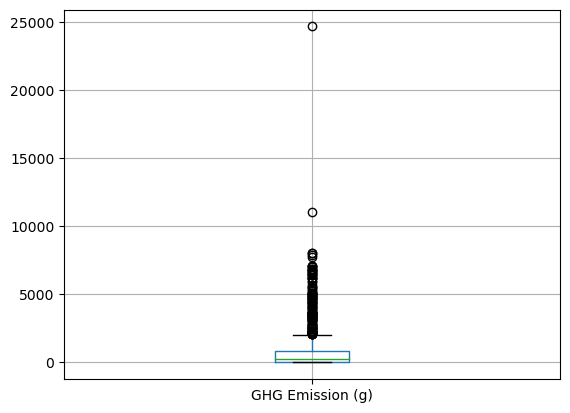

In [68]:
Products.boxplot(column=['GHG Emission (g)'], return_type='axes')

In [69]:
Products.boxplot(column=['N lost (g)'], return_type='axes')

<Axes: >

In [70]:
Products.boxplot(column=['Freshwater Withdrawals (L)'], return_type='axes')

<Axes: >

In [71]:
Products.boxplot(column=['Stress-Weighted Water Use (L)'], return_type='axes')

<Axes: >

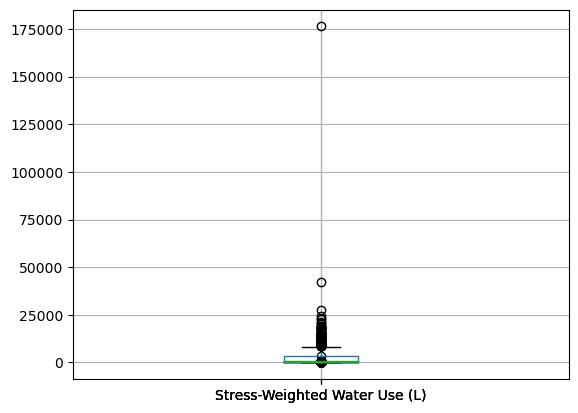

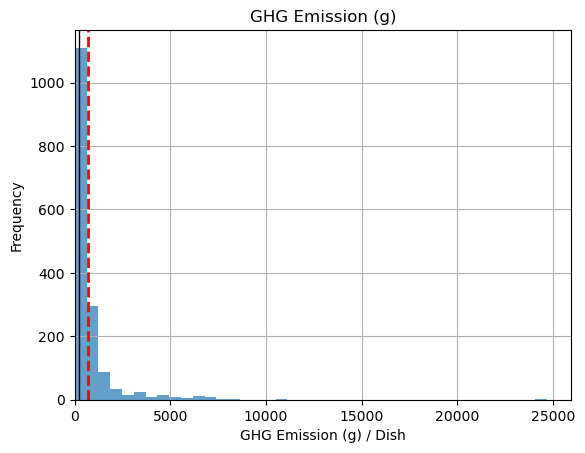

In [72]:
# These figures were not loading earlier because there were not any folders for the path required, so now that is working
Products.hist(column=['GHG Emission (g)'], bins= 40, alpha = 0.7)
plt.axvline(Products['GHG Emission (g)'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['GHG Emission (g)'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('GHG Emission (g) / Dish')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'GHGe_dish.png')
plt.show()

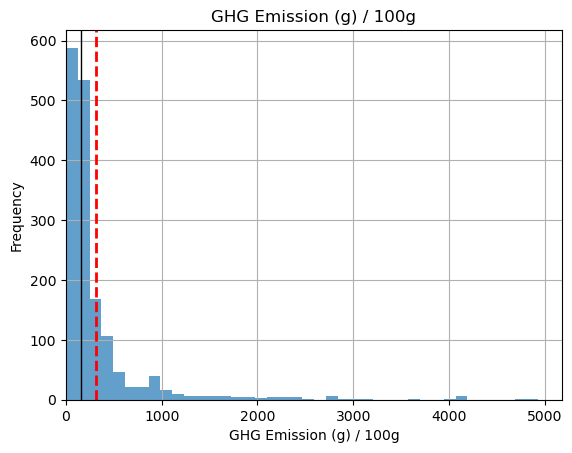

In [73]:
Products.hist(column=['GHG Emission (g) / 100g'], bins= 40, alpha = 0.7)
plt.axvline(Products['GHG Emission (g) / 100g'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['GHG Emission (g) / 100g'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('GHG Emission (g) / 100g')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'GHGe_100g.png')
plt.show()

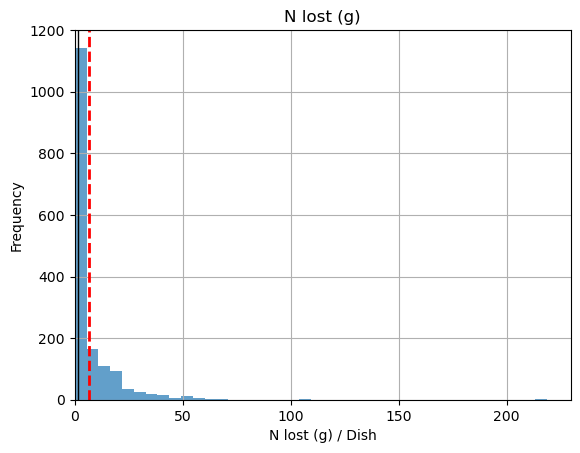

In [74]:
Products.hist(column=['N lost (g)'], bins= 40, alpha = 0.7)
plt.axvline(Products['N lost (g)'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['N lost (g)'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('N lost (g) / Dish')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'N lost_dish.png')
plt.show()

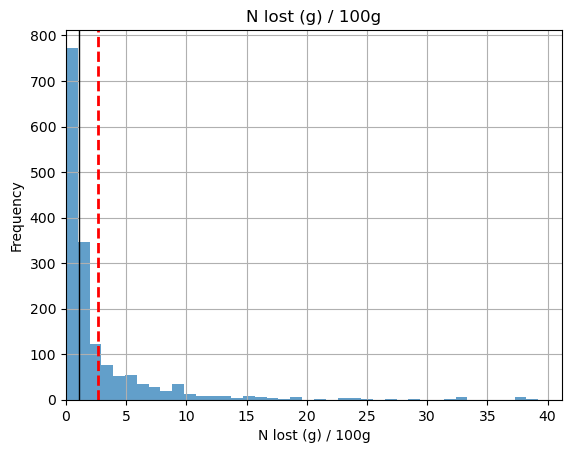

In [75]:
Products.hist(column=['N lost (g) / 100g'], bins= 40, alpha = 0.7)
plt.axvline(Products['N lost (g) / 100g'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['N lost (g) / 100g'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('N lost (g) / 100g')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'N lost_100g.png')
plt.show()

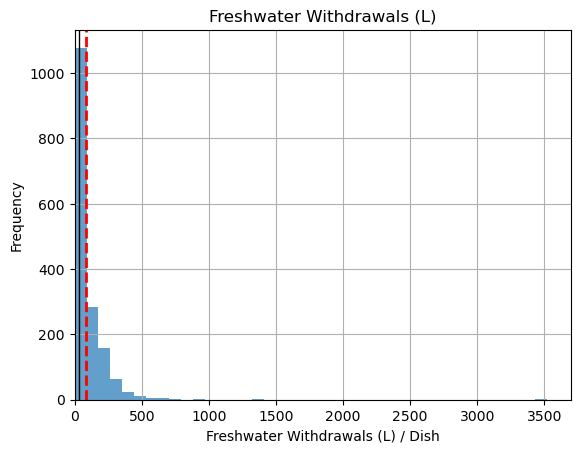

In [76]:
Products.hist(column=['Freshwater Withdrawals (L)'], bins= 40, alpha = 0.7)
plt.axvline(Products['Freshwater Withdrawals (L)'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['Freshwater Withdrawals (L)'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('Freshwater Withdrawals (L) / Dish')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'Fresh water_dish.png')
plt.show()

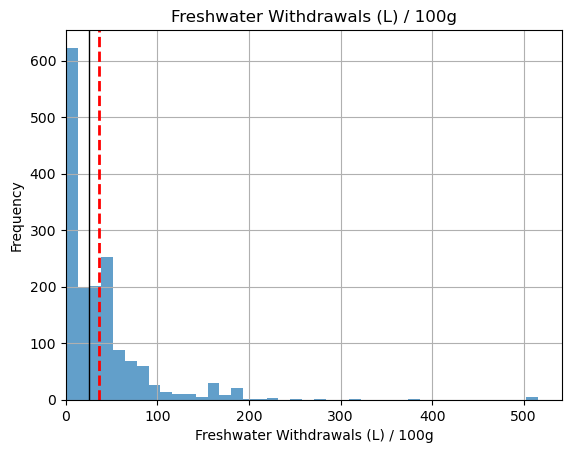

In [77]:
Products.hist(column=['Freshwater Withdrawals (L) / 100g'], bins= 40, alpha = 0.7)
plt.axvline(Products['Freshwater Withdrawals (L) / 100g'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['Freshwater Withdrawals (L) / 100g'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('Freshwater Withdrawals (L) / 100g')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'Fresh water_100g.png')
plt.show()

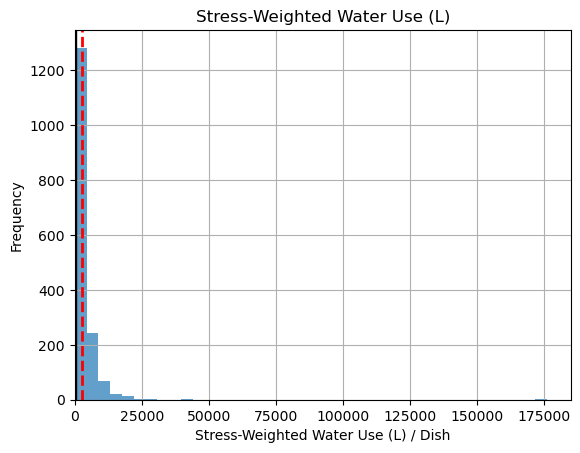

In [78]:
Products.hist(column=['Stress-Weighted Water Use (L)'], bins= 40, alpha = 0.7)
plt.axvline(Products['Stress-Weighted Water Use (L)'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['Stress-Weighted Water Use (L)'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('Stress-Weighted Water Use (L) / Dish')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'Stress water_dish.png')
plt.show()

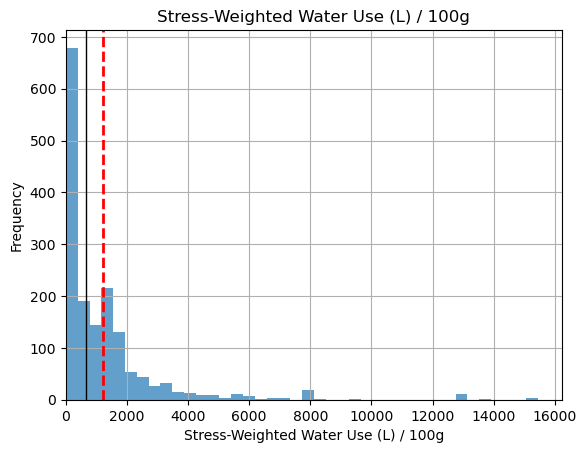

In [79]:
Products.hist(column=['Stress-Weighted Water Use (L) / 100g'], bins= 40, alpha = 0.7)
plt.axvline(Products['Stress-Weighted Water Use (L) / 100g'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['Stress-Weighted Water Use (L) / 100g'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('Stress-Weighted Water Use (L) / 100g')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'Stress water_100g.png')
plt.show()

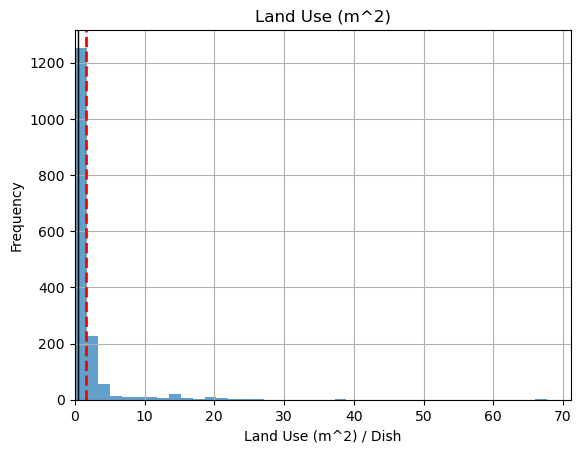

In [80]:
Products.hist(column=['Land Use (m^2)'], bins= 40, alpha = 0.7)
plt.axvline(Products['Land Use (m^2)'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['Land Use (m^2)'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('Land Use (m^2) / Dish')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'Land_Use_(m^2).png')
plt.show()

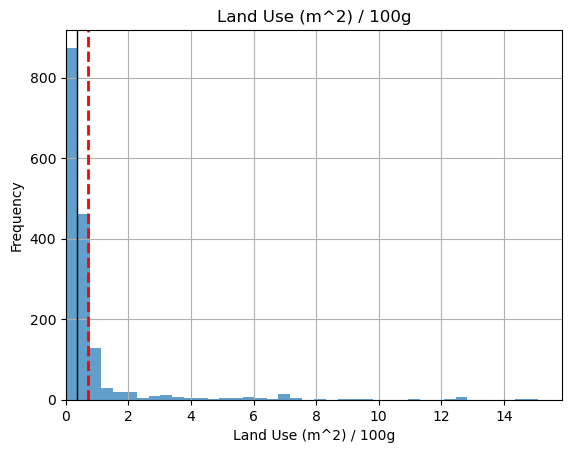

In [81]:
Products.hist(column=['Land Use (m^2) / 100g'], bins= 40, alpha = 0.7)
plt.axvline(Products['Land Use (m^2) / 100g'].mean(), color='r', linestyle='dashed', linewidth=2, label = 'mean' )
plt.axvline(Products['Land Use (m^2) / 100g'].median(), color='k', linewidth=1, label = 'median')
plt.xlabel('Land Use (m^2) / 100g')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.savefig(path + 'Land_Use_(m^2)_per_100g.png')
plt.show()

In [82]:
Products.to_csv('C:/Users/smvan/CFFS-S23/CFFS-22-23/data/preprocessed/Products_List.csv', index = False)
